# Library Import

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
%matplotlib inline

import math
import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings('ignore')

# Data Import

In [2]:
df = pd.read_csv('zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [3]:
# Function provided in order to melt the dataset
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID', 'RegionName', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], var_name='Month', value_name='Mean Value')
    melted['Month'] = pd.to_datetime(melted['Month'], infer_datetime_format=True)
    melted = melted.dropna(subset=['Mean Value'])
    return melted

In [4]:
melted_df = melt_data(df)

In [5]:
# New transformed, 'melted' dataset
melted_df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,Month,Mean Value
0,84654,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0
2,91982,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0
3,84616,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0
4,93144,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0


# Boston Focus
I am going to initially focus on the zip codes in Boston to find the top 5 zip codes to invest in. Later, if enough time, I am going to expand this search to the full range of zip codes.

In [5]:
boston = melted_df[(melted_df.City == 'Boston') & (melted_df.State == 'MA') & (melted_df.Month >= datetime.datetime(2010, 1, 1))]
boston.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,Month,Mean Value
2429856,58649,2135,Boston,MA,Boston,Suffolk,562,2010-01-01,415400.0
2430464,58638,2124,Boston,MA,Boston,Suffolk,1170,2010-01-01,278000.0
2430806,58641,2127,Boston,MA,Boston,Suffolk,1512,2010-01-01,384900.0
2430965,58644,2130,Boston,MA,Boston,Suffolk,1671,2010-01-01,514800.0
2431216,58642,2128,Boston,MA,Boston,Suffolk,1922,2010-01-01,226900.0


In [6]:
boston = boston.drop(['RegionID', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], axis = 1)
boston.head()

,RegionName,Month,Mean Value
2429856,2135,2010-01-01,415400.0
2430464,2124,2010-01-01,278000.0
2430806,2127,2010-01-01,384900.0
2430965,2130,2010-01-01,514800.0
2431216,2128,2010-01-01,226900.0


# Visualize Zip Codes

In [8]:
# This takes in a melted DF for a specific region with altered columns like above
def visualize_zips(df):
    for zip in list(df['RegionName'].unique()):
        plot_df = df[(df.RegionName == zip)]
        plot_df.set_index('Month', inplace = True)
        plot_df = plot_df.drop(['RegionName'], axis = 1)
        plot_df.plot(title = zip, figsize = (8, 3))

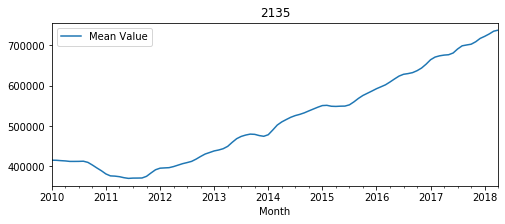

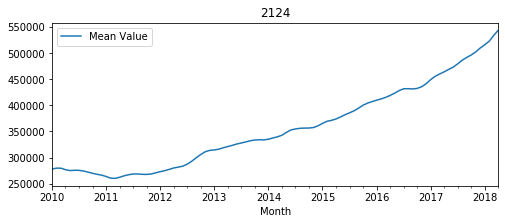

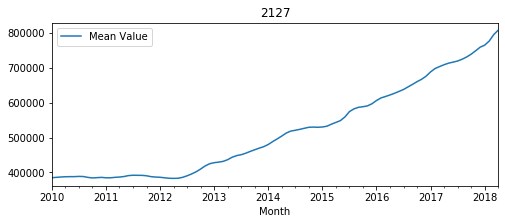

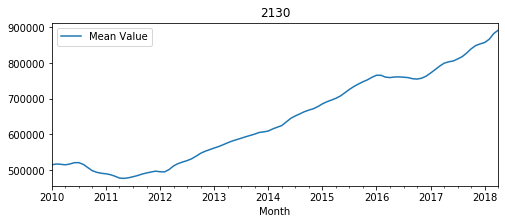

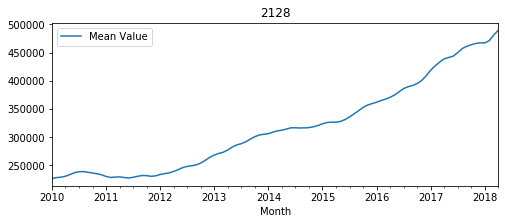

...

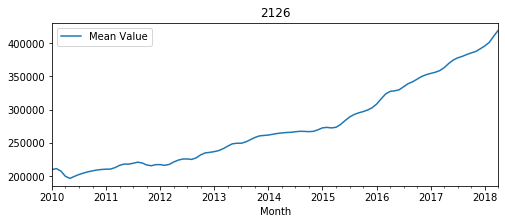

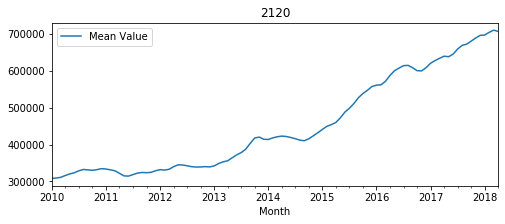

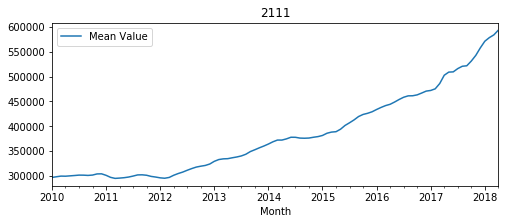

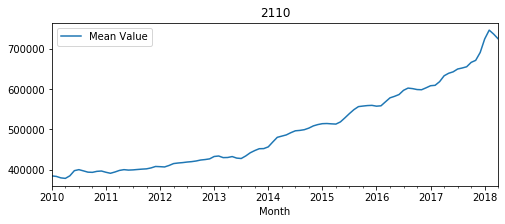

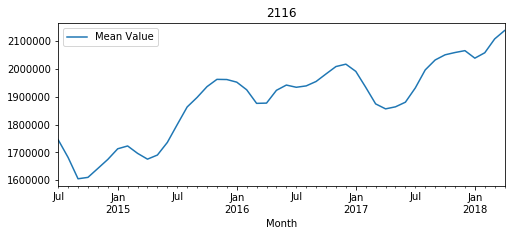

In [9]:
visualize_zips(boston)

# Log Transform / Visualize

In [12]:
def log_transform_zips(df):
    for zip in list(df['RegionName'].unique()):
        temp_df = df[(df.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        transformed = np.log(temp_df)
        fig = plt.figure(figsize=(8,3))
        plt.plot(transformed, color = 'green')

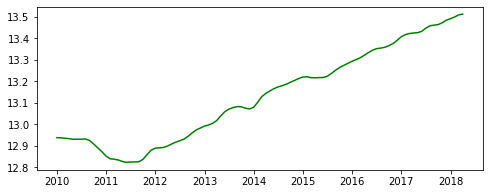

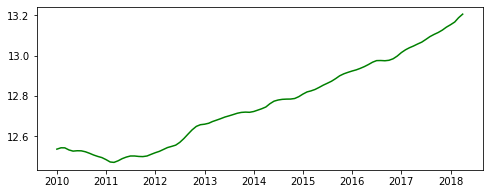

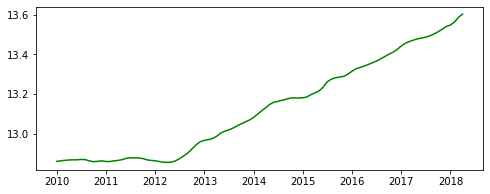

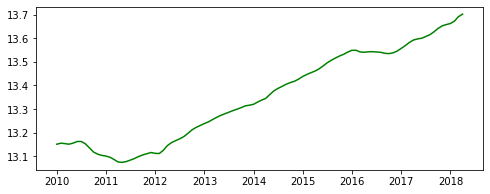

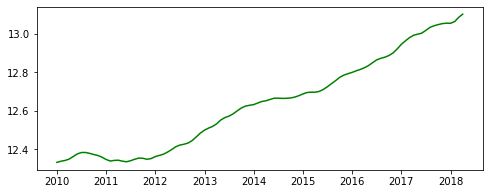

...

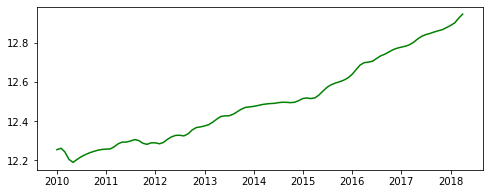

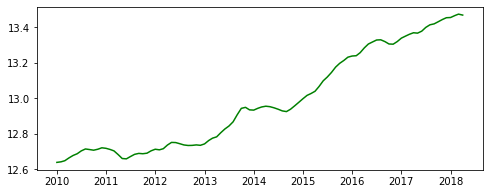

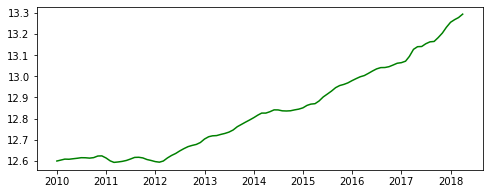

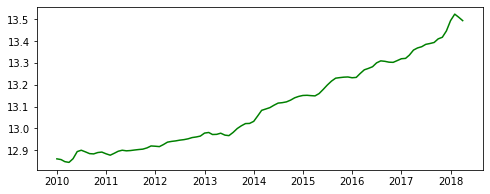

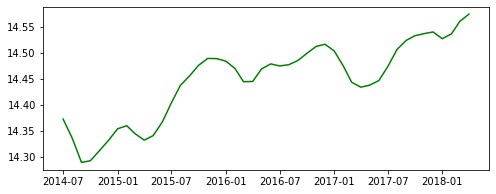

In [13]:
log_transform_zips(boston)

# Difference / Visualize

In [93]:
def difference_zips(df):
    for zip in list(df['RegionName'].unique()):
        temp_df = df[(df.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        diff_df = temp_df.diff(periods = 2)
        diff_df = diff_df.dropna()
        fig = plt.figure(figsize=(8,3))
        plt.plot(diff_df, color = 'green')

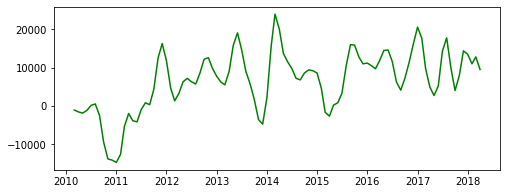

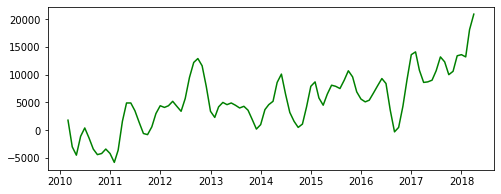

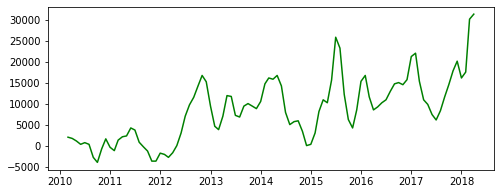

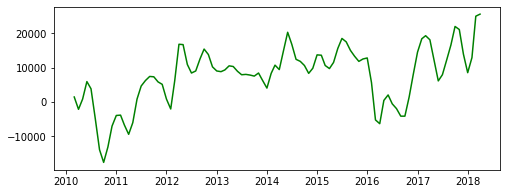

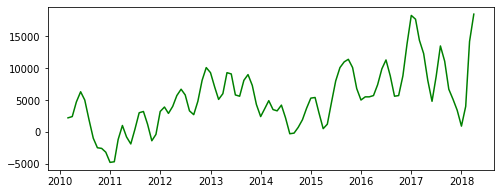

...

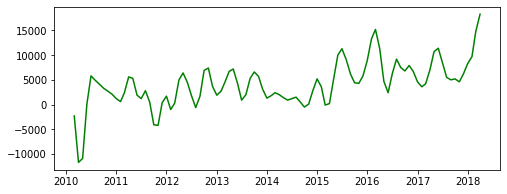

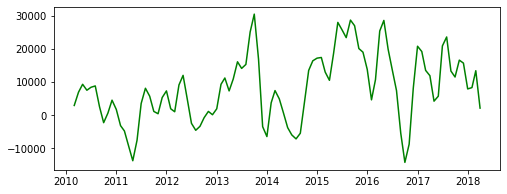

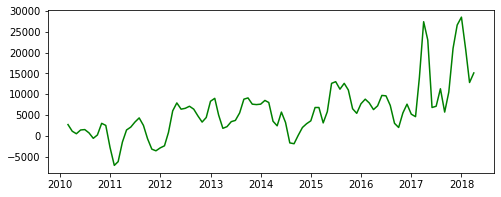

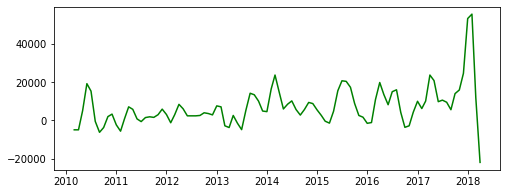

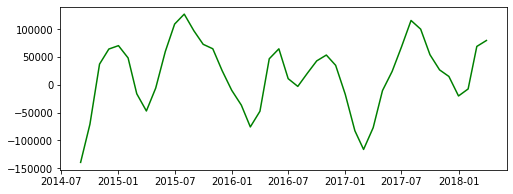

In [94]:
difference_zips(boston)

In [7]:
from statsmodels.tsa.stattools import adfuller

# DF Test on Differenced

In [16]:
for zip in list(boston['RegionName'].unique()):
        plot_df = boston[(boston.RegionName == zip)]
        plot_df.set_index('Month', inplace = True)
        plot_df = plot_df.drop(['RegionName'], axis = 1)
        diff_df = plot_df.diff(periods = 3)
        diff_df = diff_df.dropna()
        dftest = adfuller(diff_df['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                 -2.859363
p-value                         0.050282
#Lags Used                     10.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64
Test Statistic                 -1.622414
p-value                         0.471464
#Lags Used                     10.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64
Test Statistic                 -0.817748
p-value                         0.813853
#Lags Used                     10.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64
Test Statistic                 -2.498572
p-value                         0.115822
#Lags Used  

# DF Test on Data - Rolling Mean

In [17]:
for zip in list(boston['RegionName'].unique()):
        plot_df = boston[(boston.RegionName == zip)]
        plot_df.set_index('Month', inplace = True)
        plot_df = plot_df.drop(['RegionName'], axis = 1)
        roll_mean = plot_df.rolling(window = 12).mean()
        data_minus_roll_mean = plot_df - roll_mean
        data_minus_roll_mean.dropna(inplace = True)
        dftest = adfuller(data_minus_roll_mean['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                 -3.708314
p-value                         0.003998
#Lags Used                      4.000000
Number of Observations Used    84.000000
Critical Value (1%)            -3.510712
Critical Value (5%)            -2.896616
Critical Value (10%)           -2.585482
dtype: float64
Test Statistic                 -1.097496
p-value                         0.716070
#Lags Used                      6.000000
Number of Observations Used    82.000000
Critical Value (1%)            -3.512738
Critical Value (5%)            -2.897490
Critical Value (10%)           -2.585949
dtype: float64
Test Statistic                 -0.918644
p-value                         0.781771
#Lags Used                      7.000000
Number of Observations Used    81.000000
Critical Value (1%)            -3.513790
Critical Value (5%)            -2.897943
Critical Value (10%)           -2.586191
dtype: float64
Test Statistic                 -3.256289
p-value                         0.016949
#Lags Used  

# DF Test for Data - Exp Mean

In [18]:
for zip in list(boston['RegionName'].unique()):
        plot_df = boston[(boston.RegionName == zip)]
        plot_df.set_index('Month', inplace = True)
        plot_df = plot_df.drop(['RegionName'], axis = 1)
        exp_mean = plot_df.ewm(halflife = 2).mean()
        data_minus_exp_mean = plot_df - exp_mean
        data_minus_exp_mean.dropna(inplace = True)
        dftest = adfuller(data_minus_exp_mean['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                 -1.665438
p-value                         0.449002
#Lags Used                      4.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64
Test Statistic                 -0.727187
p-value                         0.839581
#Lags Used                      6.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64
Test Statistic                 -0.871178
p-value                         0.797316
#Lags Used                      7.000000
Number of Observations Used    92.000000
Critical Value (1%)            -3.503515
Critical Value (5%)            -2.893508
Critical Value (10%)           -2.583824
dtype: float64
Test Statistic                 -2.130239
p-value                         0.232530
#Lags Used  

## So far when trying to de-trend the data, I have not been successful with log transformations, subtrating the rolling/exponential mean, or differencing alone. I am now going to try applying multiple transformations to the dataset and see if that works.

# DF Test - Log & Roll Mean

In [19]:
for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 12).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll.dropna(inplace = True)
        dftest = adfuller(log_minus_roll['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                 -4.214835
p-value                         0.000622
#Lags Used                      4.000000
Number of Observations Used    84.000000
Critical Value (1%)            -3.510712
Critical Value (5%)            -2.896616
Critical Value (10%)           -2.585482
dtype: float64
Test Statistic                 -2.622803
p-value                         0.088375
#Lags Used                      6.000000
Number of Observations Used    82.000000
Critical Value (1%)            -3.512738
Critical Value (5%)            -2.897490
Critical Value (10%)           -2.585949
dtype: float64
Test Statistic                 -1.719965
p-value                         0.420857
#Lags Used                      7.000000
Number of Observations Used    81.000000
Critical Value (1%)            -3.513790
Critical Value (5%)            -2.897943
Critical Value (10%)           -2.586191
dtype: float64
Test Statistic                 -3.678821
p-value                         0.004421
#Lags Used  

## Getting closer but still not quite there

# DF Test - Log & Exp Mean

In [20]:
for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        exp_log = log_df.ewm(halflife = 4).mean()
        log_minus_exp = log_df - exp_log
        log_minus_exp.dropna(inplace = True)
        dftest = adfuller(log_minus_exp['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                 -1.974677
p-value                         0.297786
#Lags Used                      6.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64
Test Statistic                 -1.655516
p-value                         0.454165
#Lags Used                      6.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64
Test Statistic                 -1.405382
p-value                         0.579693
#Lags Used                      7.000000
Number of Observations Used    92.000000
Critical Value (1%)            -3.503515
Critical Value (5%)            -2.893508
Critical Value (10%)           -2.583824
dtype: float64
Test Statistic                 -2.127685
p-value                         0.233529
#Lags Used  

## Worse than with the non-weighted mean

# DF Test - Log, Roll Mean, Differenced

In [21]:
for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        dftest = adfuller(log_minus_roll_diffed['Mean Value'])
        dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
        for key,value in dftest[4].items():
            dfoutput['Critical Value (%s)'%key] = value
        print(dfoutput)

Test Statistic                -5.689593e+00
p-value                        8.128968e-07
#Lags Used                     5.000000e+00
Number of Observations Used    9.100000e+01
Critical Value (1%)           -3.504343e+00
Critical Value (5%)           -2.893866e+00
Critical Value (10%)          -2.584015e+00
dtype: float64
Test Statistic                 -4.298110
p-value                         0.000448
#Lags Used                      7.000000
Number of Observations Used    89.000000
Critical Value (1%)            -3.506057
Critical Value (5%)            -2.894607
Critical Value (10%)           -2.584410
dtype: float64
Test Statistic                 -5.155696
p-value                         0.000011
#Lags Used                     10.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64
Test Statistic                 -4.042273
p-value                         

# Yay! After applying a log transformation, subtracting the rolling mean (with a window = 2), and differencing (period = 2), all of my zip codes are FINALLY stationary.

## Let's plot them.

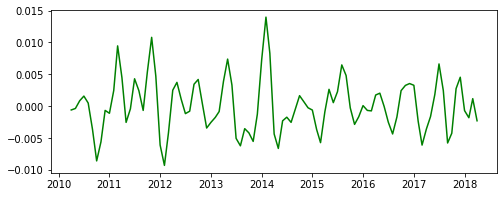

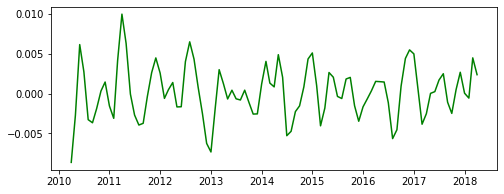

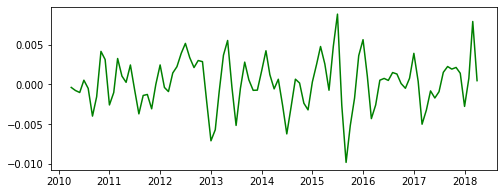

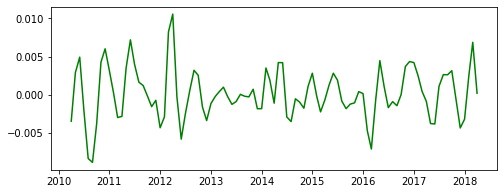

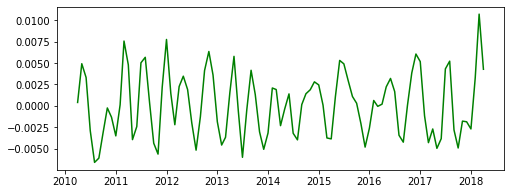

...

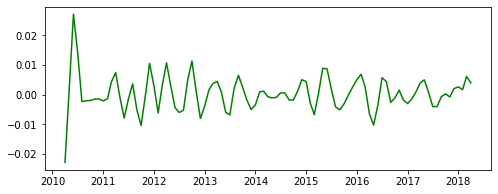

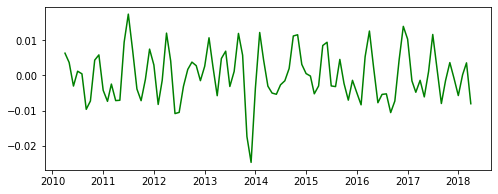

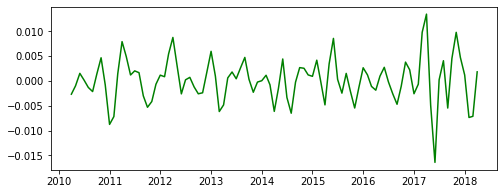

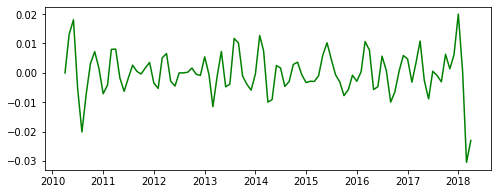

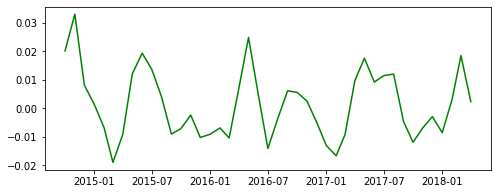

In [22]:
for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        fig = plt.figure(figsize=(8,3))
        plt.plot(log_minus_roll_diffed, color = 'green')

# Cool, all looks good. Both the trend and seasonality appear to be gone.

# ACF

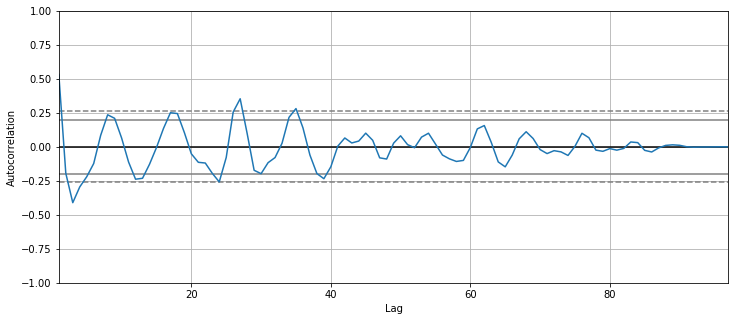

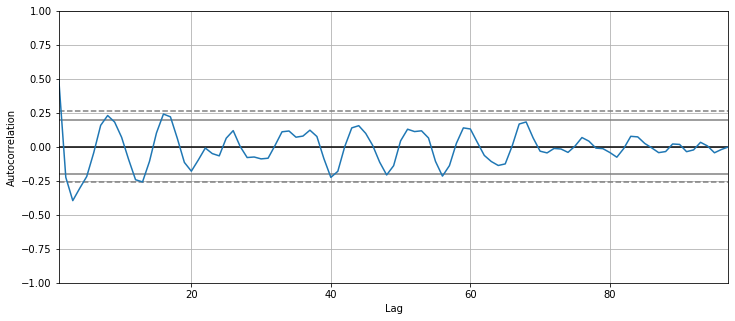

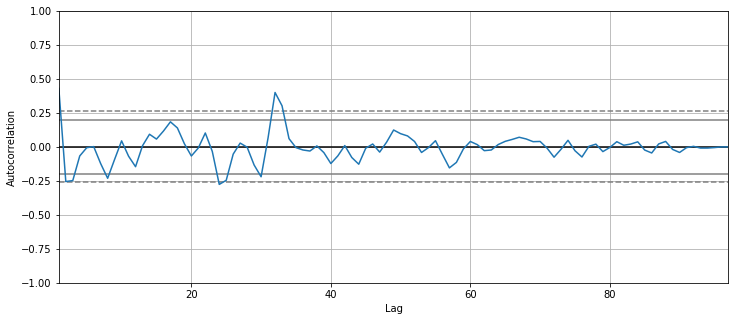

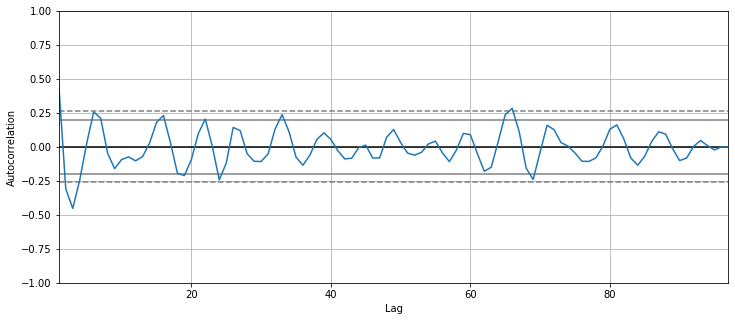

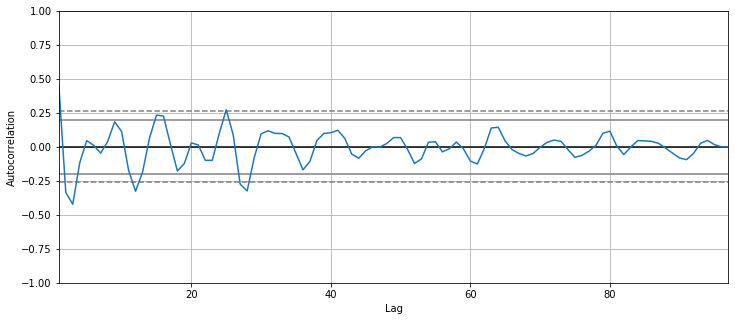

...

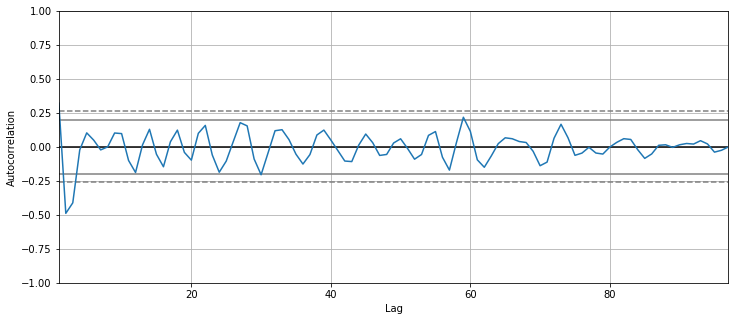

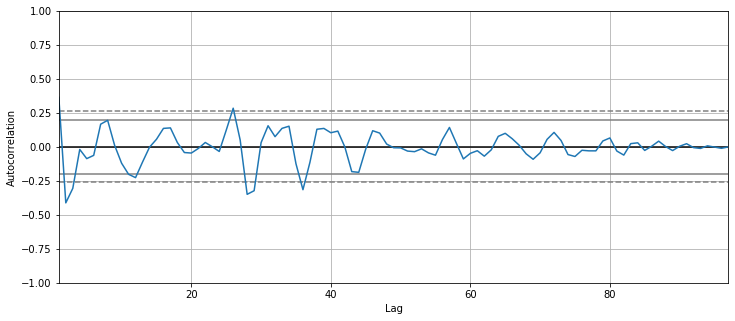

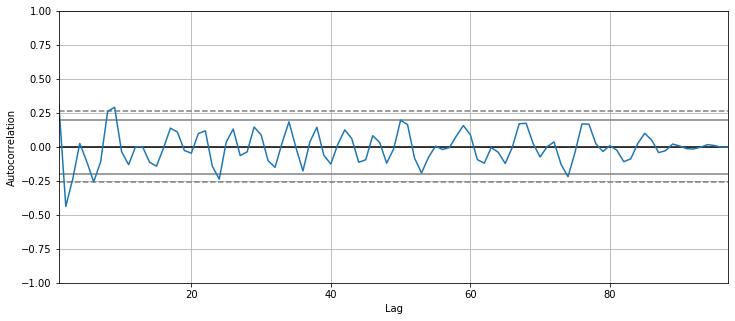

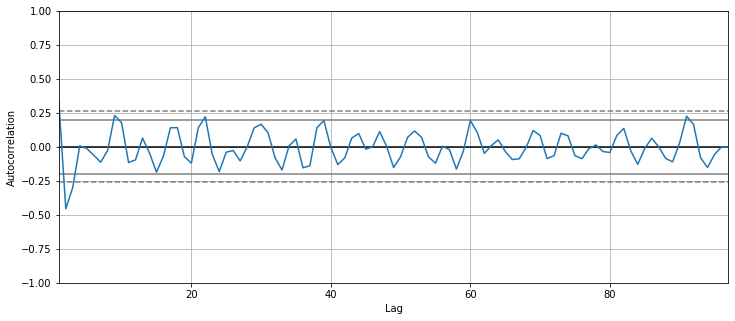

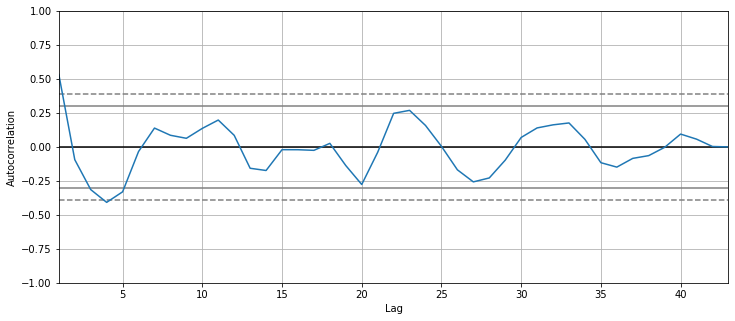

In [23]:
from statsmodels.graphics.tsaplots import plot_acf

for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        plt.figure(figsize=(12,5))
        pd.plotting.autocorrelation_plot(log_minus_roll_diffed)

# PACF

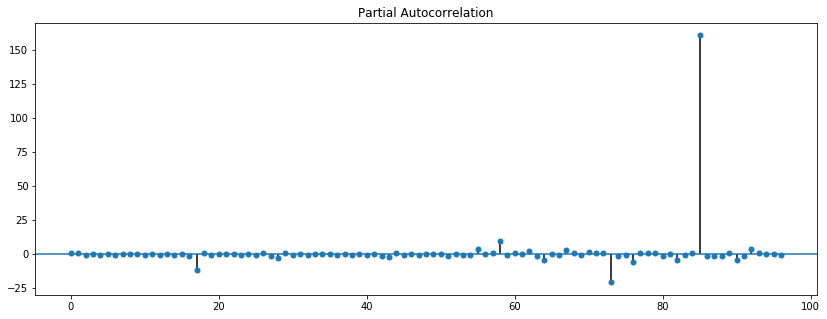

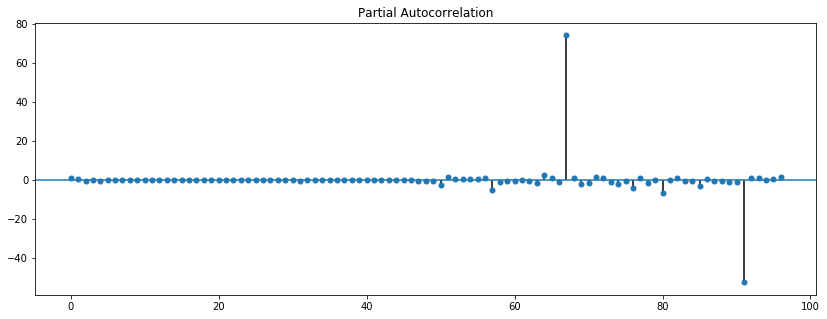

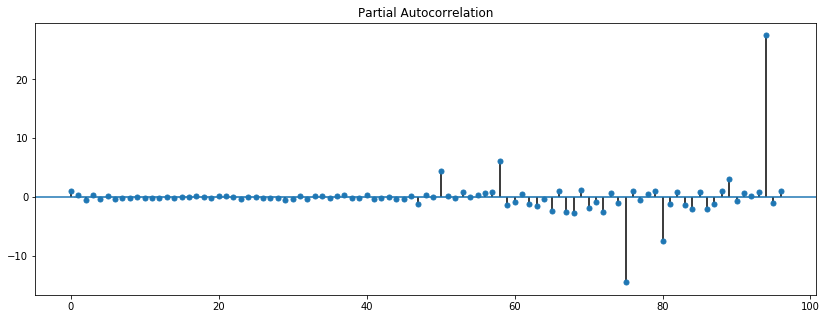

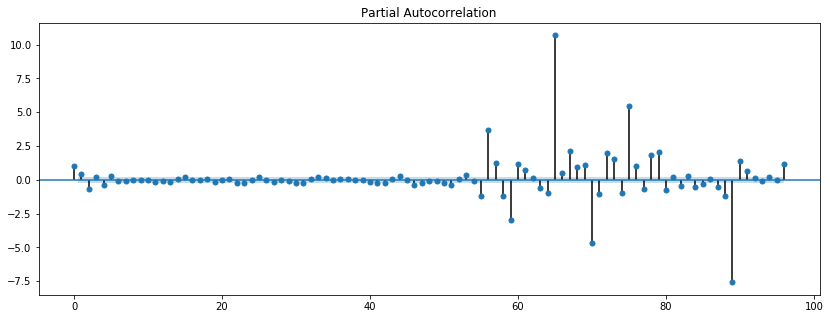

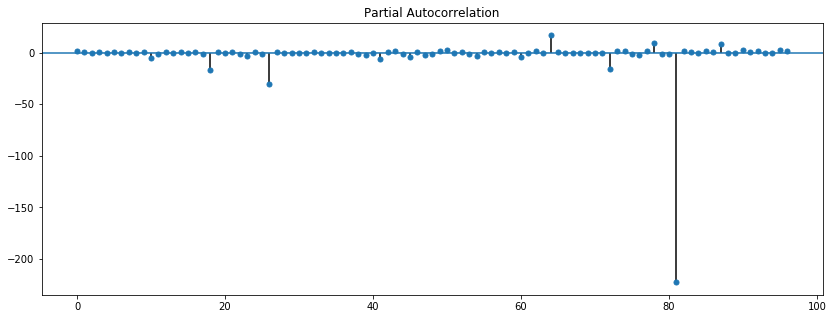

...

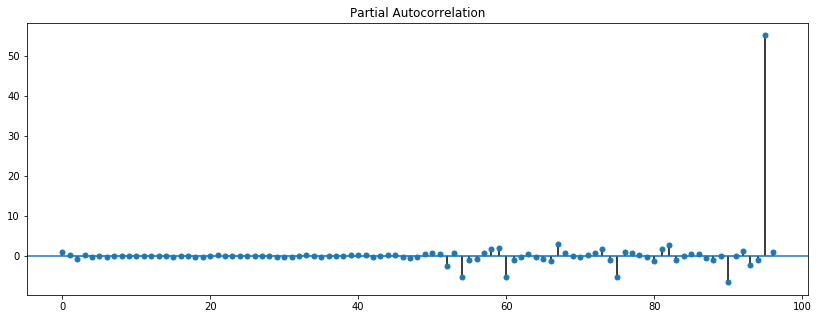

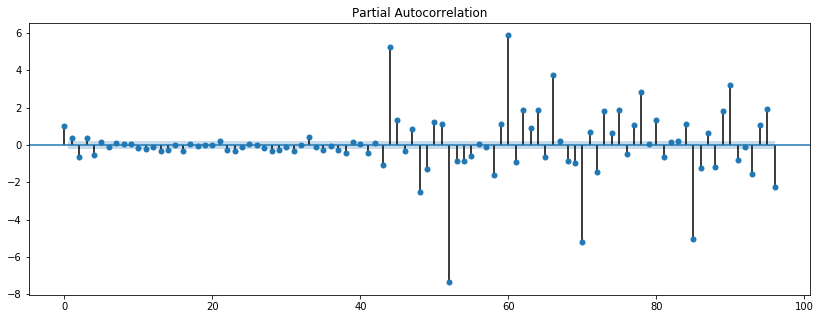

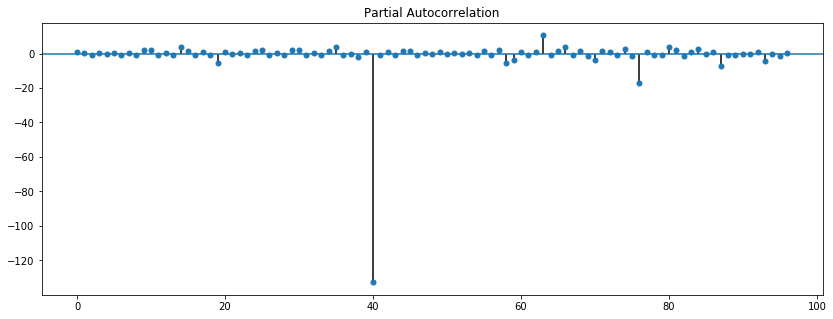

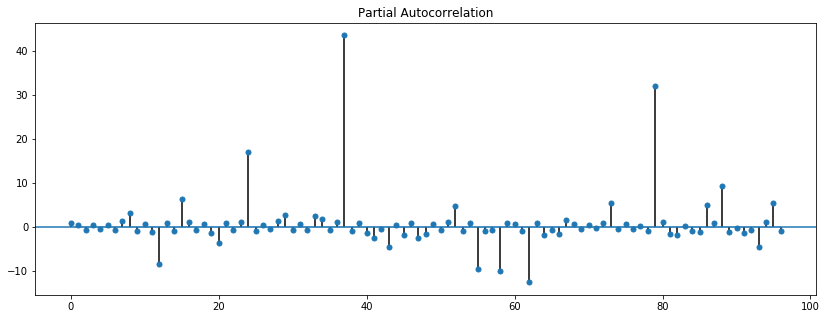

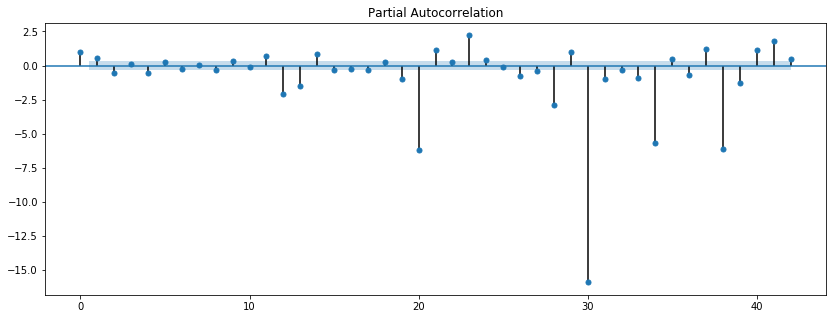

In [24]:
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib.pylab import rcParams

for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        rcParams['figure.figsize'] = 14, 5
        plot_pacf(log_minus_roll_diffed, lags=100)

# ARMA

In [25]:
from statsmodels.tsa.arima_model import ARMA
import statsmodels.api as sm

# First Order AR Model

                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 410.427
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -814.854
Time:                        13:10:17   BIC                           -807.130
Sample:                    04-01-2010   HQIC                          -811.731
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             4.562e-05      0.001      0.061      0.952      -0.001       0.002
ar.L1.Mean Value     0.5299      0.085      6.219      0.000       0.363       0.697
                            

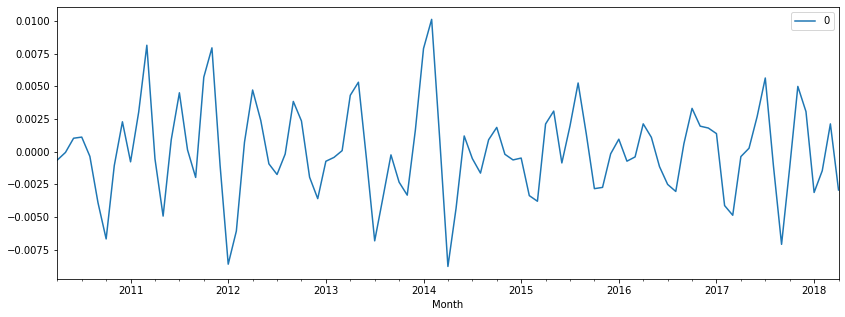

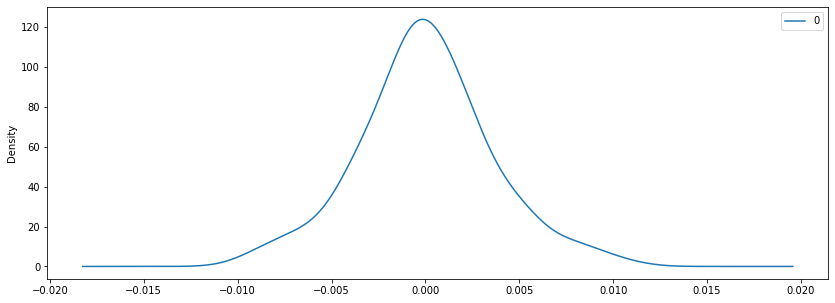

               0
count  97.000000
mean    0.000004
std     0.003529
min    -0.008795
25%    -0.001965
50%    -0.000256
75%     0.001955
max     0.010116
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 433.263
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -860.526
Time:                        13:10:18   BIC                           -852.802
Sample:                    04-01-2010   HQIC                          -857.403
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             9.331e-05      0.001      0

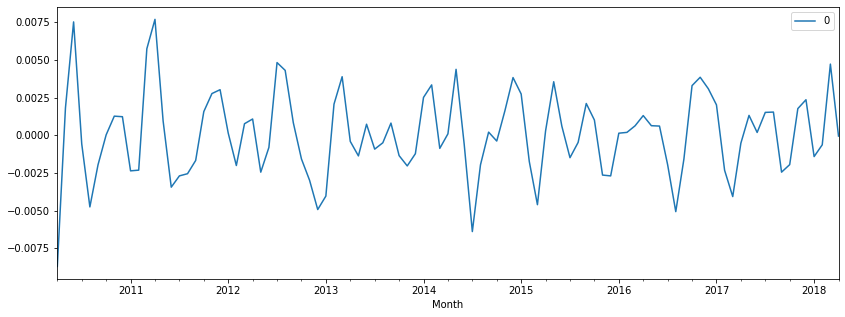

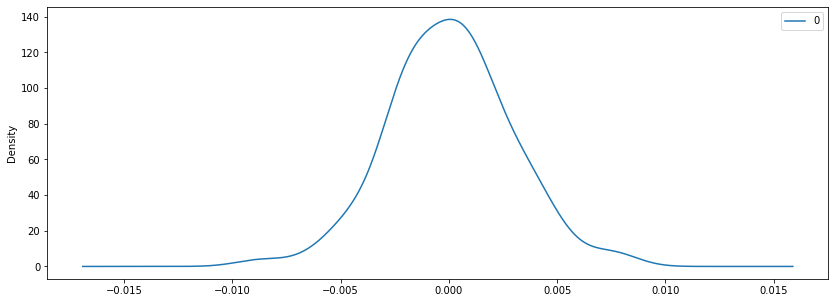

               0
count  97.000000
mean    0.000048
std     0.002828
min    -0.008708
25%    -0.001952
50%     0.000134
75%     0.001618
max     0.007687
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 432.162
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -858.324
Time:                        13:10:18   BIC                           -850.599
Sample:                    04-01-2010   HQIC                          -855.200
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0002      0.000      0

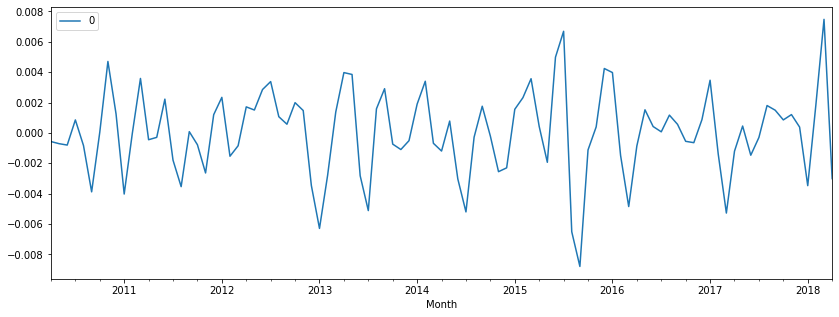

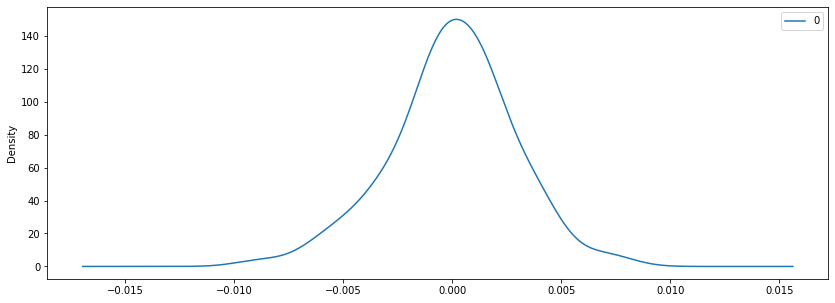

               0
count  97.000000
mean    0.000003
std     0.002823
min    -0.008795
25%    -0.001391
50%     0.000072
75%     0.001586
max     0.007478
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 426.685
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -847.370
Time:                        13:10:19   BIC                           -839.646
Sample:                    04-01-2010   HQIC                          -844.247
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.001      0

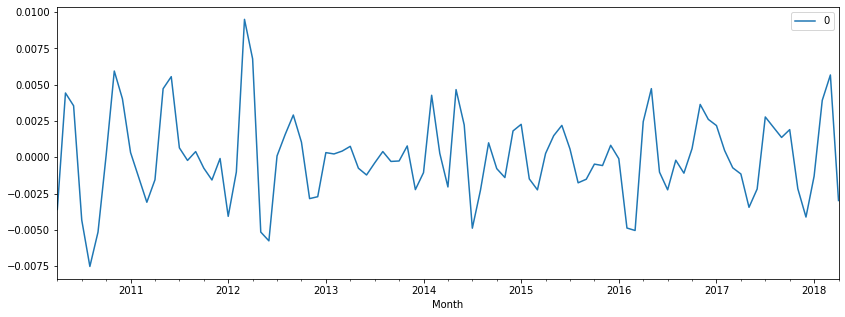

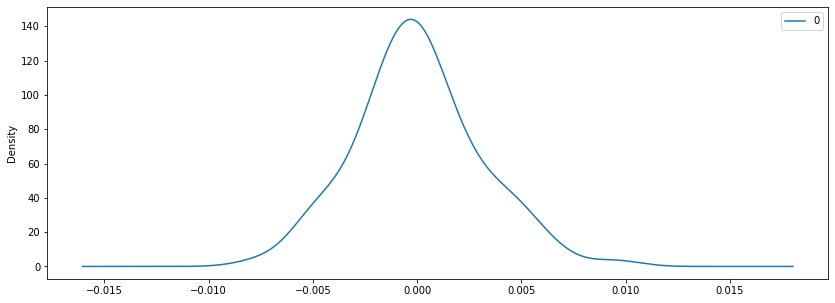

               0
count  97.000000
mean    0.000017
std     0.002991
min    -0.007525
25%    -0.001565
50%    -0.000099
75%     0.001815
max     0.009504
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 416.156
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -826.313
Time:                        13:10:20   BIC                           -818.589
Sample:                    04-01-2010   HQIC                          -823.189
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0002      0.001      0

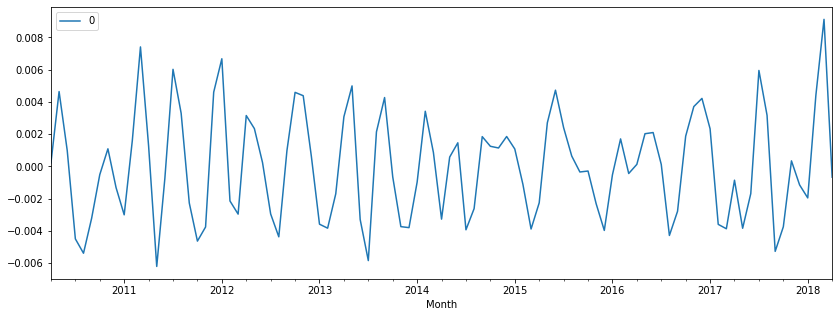

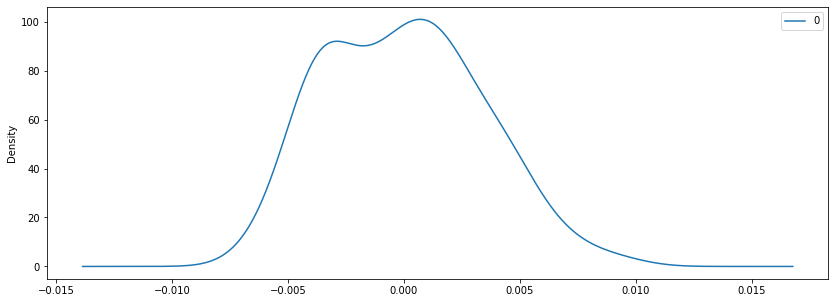

               0
count  97.000000
mean   -0.000001
std     0.003329
min    -0.006201
25%    -0.002957
50%     0.000122
75%     0.002141
max     0.009117
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 439.292
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -872.584
Time:                        13:10:20   BIC                           -864.860
Sample:                    04-01-2010   HQIC                          -869.461
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             7.453e-05      0.000      0

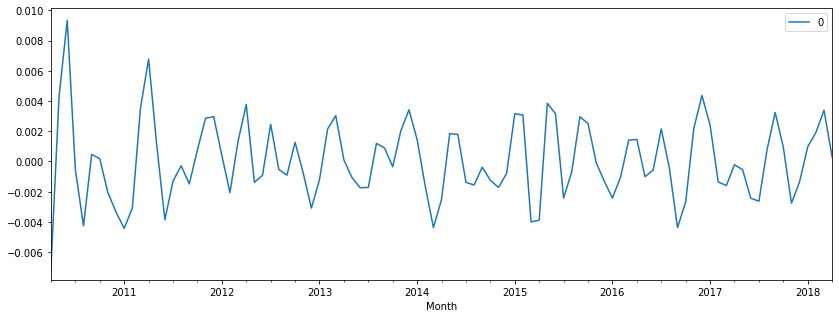

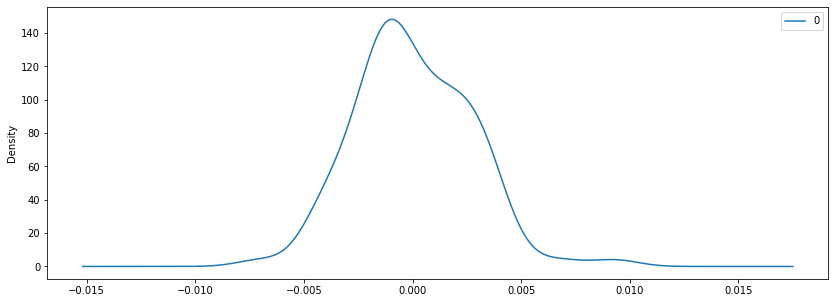

               0
count  97.000000
mean    0.000032
std     0.002641
min    -0.007009
25%    -0.001588
50%    -0.000375
75%     0.001913
max     0.009337
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 408.354
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -810.708
Time:                        13:10:21   BIC                           -802.983
Sample:                    04-01-2010   HQIC                          -807.584
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.001      0

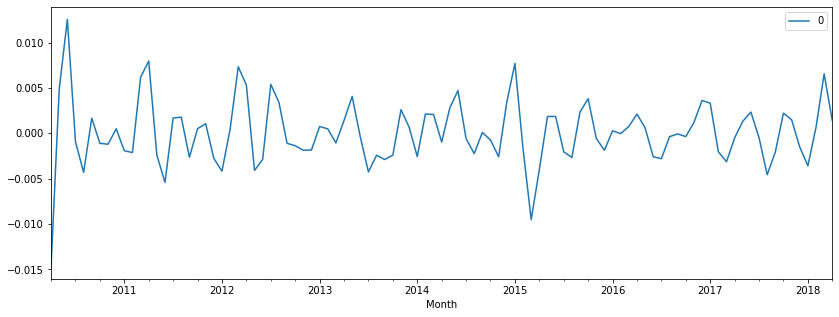

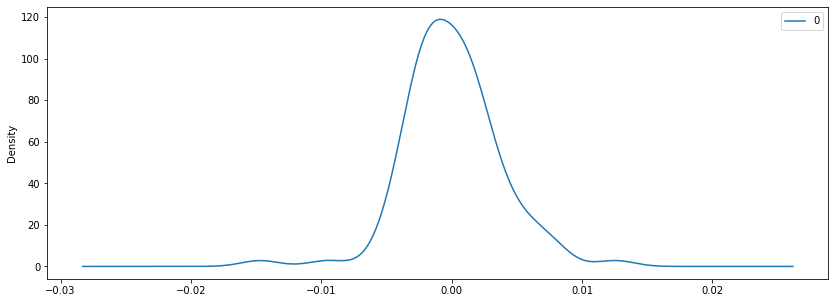

               0
count  97.000000
mean    0.000048
std     0.003640
min    -0.014681
25%    -0.002125
50%    -0.000365
75%     0.001855
max     0.012559
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 432.686
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -859.373
Time:                        13:10:22   BIC                           -851.649
Sample:                    04-01-2010   HQIC                          -856.250
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             7.452e-05      0.001      0

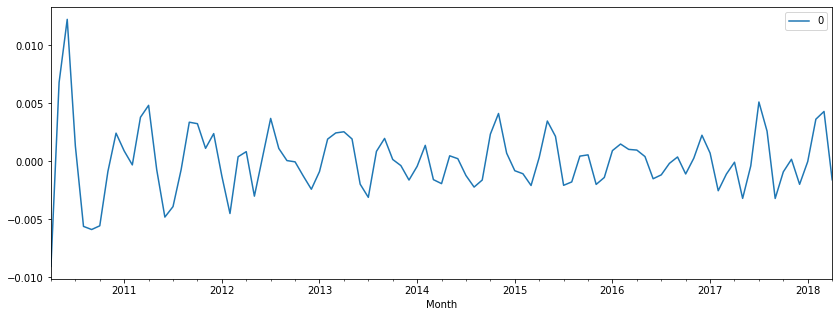

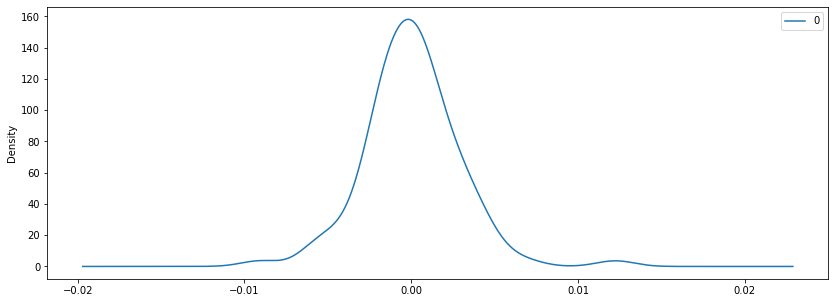

               0
count  97.000000
mean    0.000050
std     0.002848
min    -0.009052
25%    -0.001572
50%     0.000070
75%     0.001384
max     0.012240
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 457.248
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -908.497
Time:                        13:10:23   BIC                           -900.773
Sample:                    04-01-2010   HQIC                          -905.374
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             6.166e-05      0.000      0

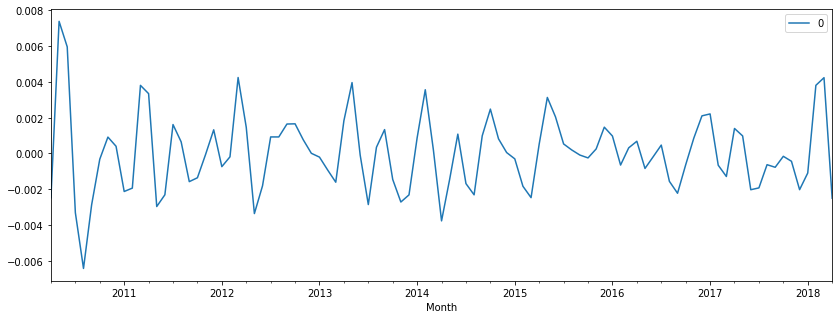

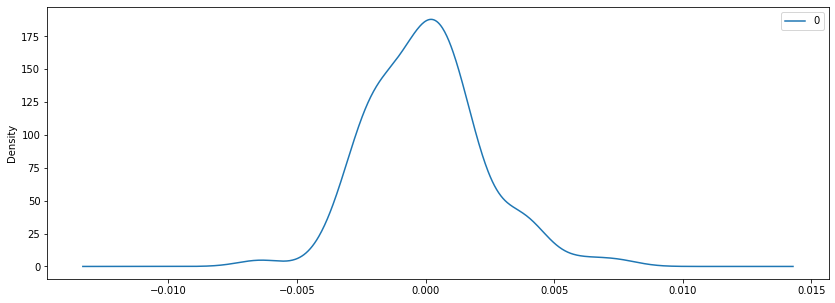

               0
count  97.000000
mean    0.000011
std     0.002182
min    -0.006424
25%    -0.001574
50%    -0.000088
75%     0.000989
max     0.007381
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 362.441
Method:                       css-mle   S.D. of innovations              0.006
Date:                Fri, 17 Apr 2020   AIC                           -718.882
Time:                        13:10:23   BIC                           -711.158
Sample:                    04-01-2010   HQIC                          -715.759
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0003      0.001      0

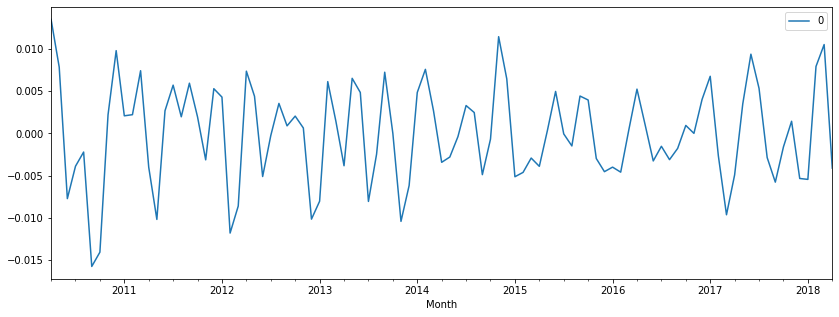

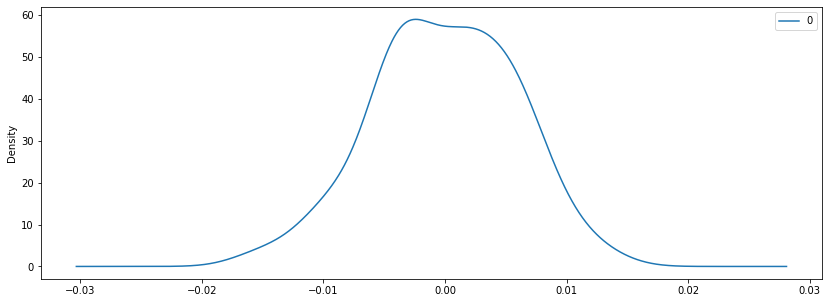

               0
count  97.000000
mean   -0.000068
std     0.005828
min    -0.015728
25%    -0.003983
50%     0.000009
75%     0.004398
max     0.013494
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 381.130
Method:                       css-mle   S.D. of innovations              0.005
Date:                Fri, 17 Apr 2020   AIC                           -756.260
Time:                        13:10:24   BIC                           -748.536
Sample:                    04-01-2010   HQIC                          -753.137
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             7.769e-05      0.001      0

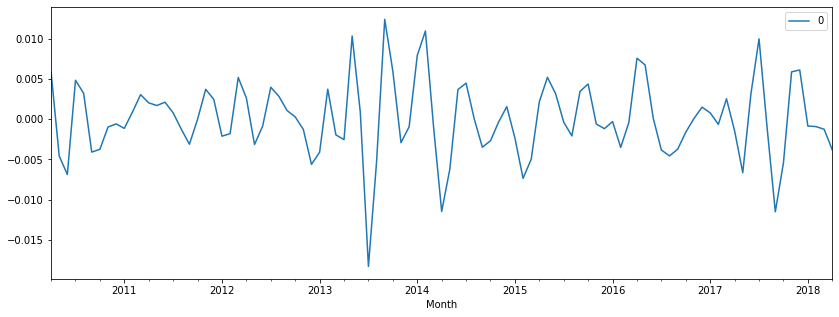

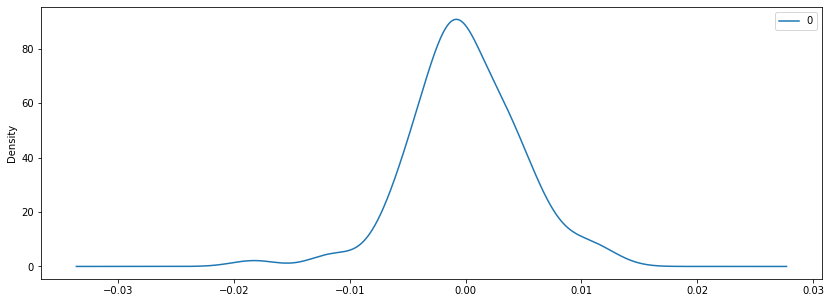

               0
count  97.000000
mean   -0.000020
std     0.004783
min    -0.018282
25%    -0.002679
50%    -0.000425
75%     0.003043
max     0.012386
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 363.090
Method:                       css-mle   S.D. of innovations              0.006
Date:                Fri, 17 Apr 2020   AIC                           -720.181
Time:                        13:10:25   BIC                           -712.457
Sample:                    04-01-2010   HQIC                          -717.058
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.0001      0.001     -0

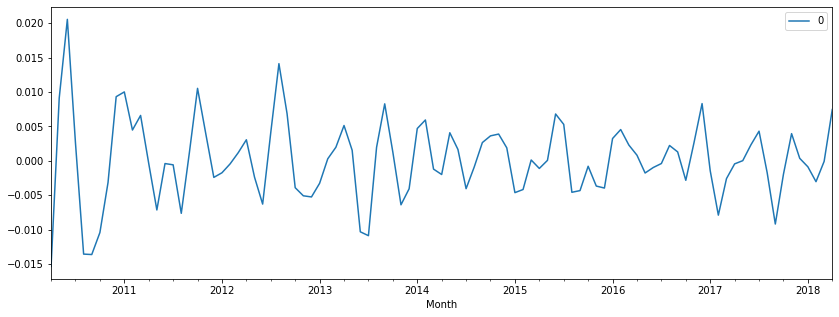

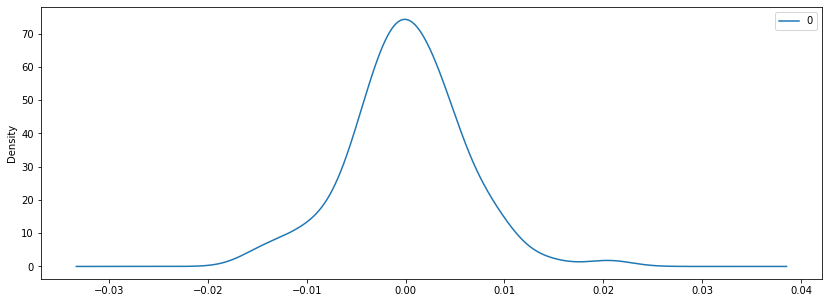

               0
count  97.000000
mean    0.000086
std     0.005811
min    -0.015341
25%    -0.003134
50%    -0.000072
75%     0.003637
max     0.020569
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 407.602
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -809.203
Time:                        13:10:25   BIC                           -801.479
Sample:                    04-01-2010   HQIC                          -806.080
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             4.393e-05      0.001      0

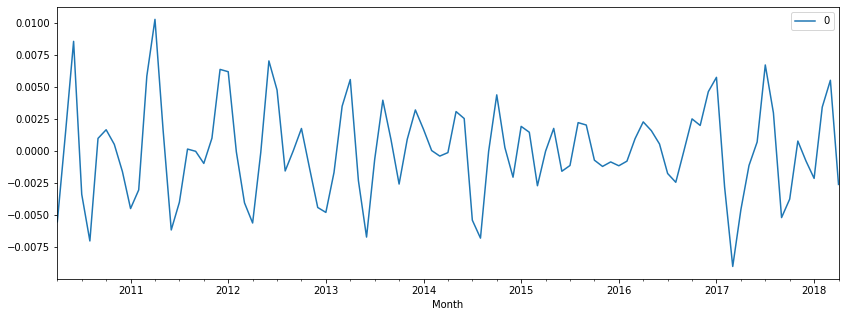

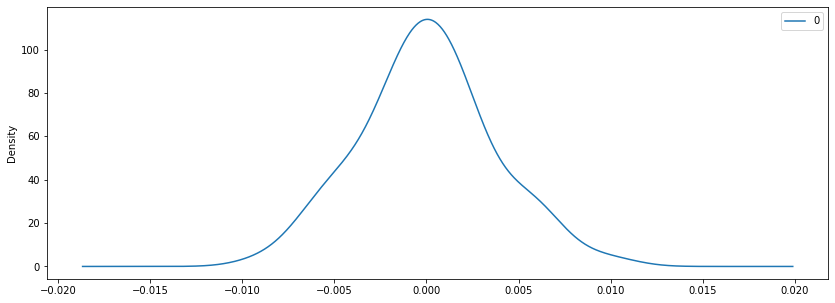

               0
count  97.000000
mean    0.000027
std     0.003645
min    -0.009027
25%    -0.002157
50%    -0.000038
75%     0.001973
max     0.010248
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 366.203
Method:                       css-mle   S.D. of innovations              0.006
Date:                Fri, 17 Apr 2020   AIC                           -726.406
Time:                        13:10:26   BIC                           -718.682
Sample:                    04-01-2010   HQIC                          -723.283
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0002      0.001      0

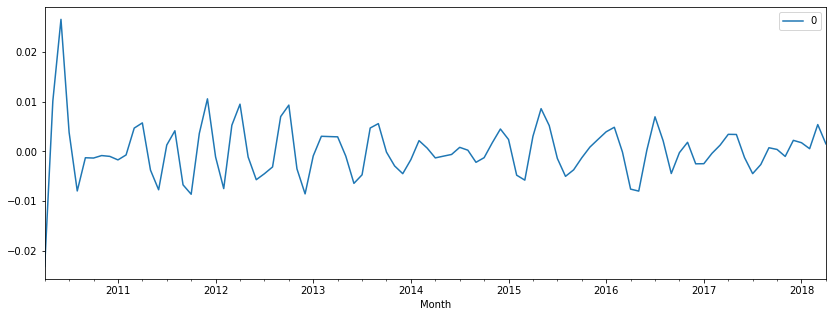

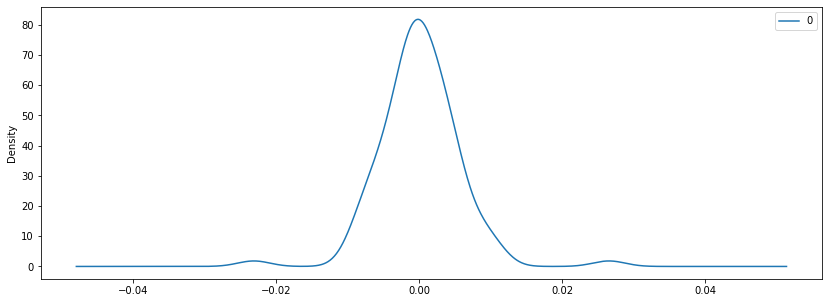

               0
count  97.000000
mean    0.000091
std     0.005644
min    -0.023123
25%    -0.002638
50%    -0.000247
75%     0.003039
max     0.026544
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 348.593
Method:                       css-mle   S.D. of innovations              0.007
Date:                Fri, 17 Apr 2020   AIC                           -691.186
Time:                        13:10:27   BIC                           -683.462
Sample:                    04-01-2010   HQIC                          -688.063
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -4.254e-05      0.001     -0

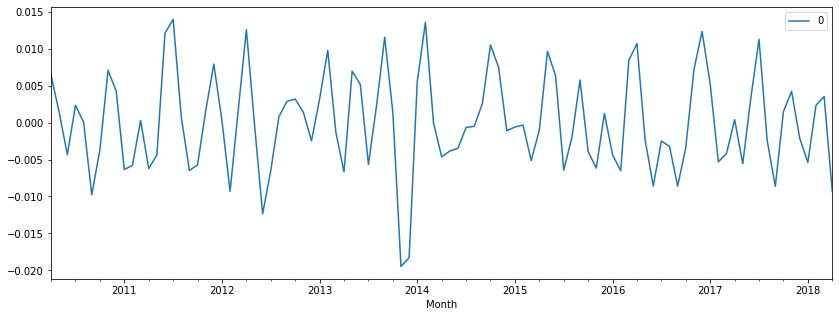

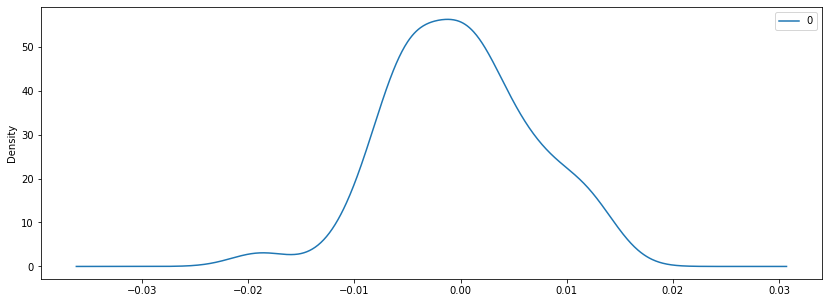

               0
count  97.000000
mean   -0.000024
std     0.006687
min    -0.019473
25%    -0.004639
50%    -0.000284
75%     0.004238
max     0.013989
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 394.808
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -783.616
Time:                        13:10:27   BIC                           -775.892
Sample:                    04-01-2010   HQIC                          -780.493
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             8.113e-05      0.001      0

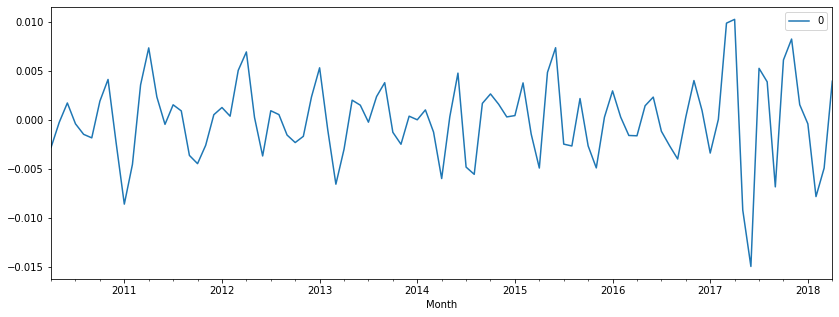

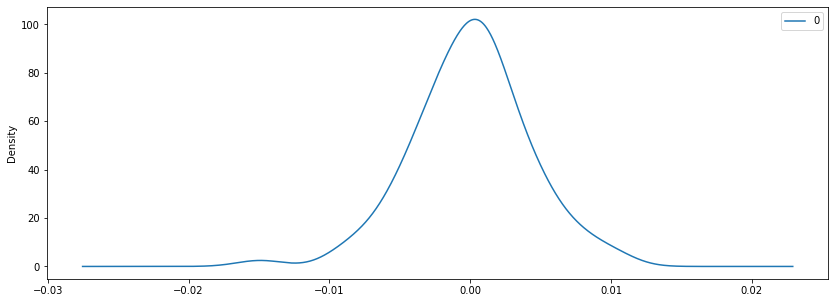

               0
count  97.000000
mean    0.000009
std     0.004152
min    -0.014922
25%    -0.002451
50%     0.000315
75%     0.002364
max     0.010297
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                 343.806
Method:                       css-mle   S.D. of innovations              0.007
Date:                Fri, 17 Apr 2020   AIC                           -681.612
Time:                        13:10:28   BIC                           -673.888
Sample:                    04-01-2010   HQIC                          -678.489
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.0002      0.001     -0

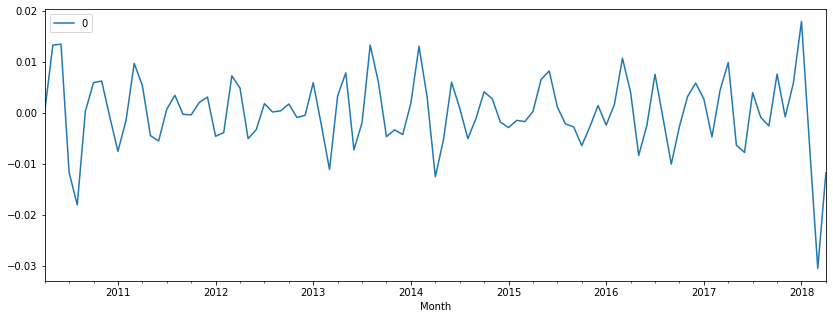

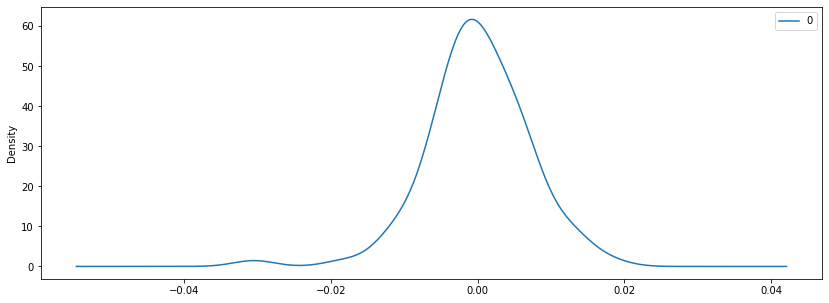

                  0
count  9.700000e+01
mean  -7.456858e-07
std    7.020746e-03
min   -3.051250e-02
25%   -3.352197e-03
50%   -3.208218e-04
75%    4.098565e-03
max    1.789651e-02
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   43
Model:                     ARMA(1, 0)   Log Likelihood                 136.976
Method:                       css-mle   S.D. of innovations              0.010
Date:                Fri, 17 Apr 2020   AIC                           -267.952
Time:                        13:10:29   BIC                           -262.668
Sample:                    10-01-2014   HQIC                          -266.003
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             

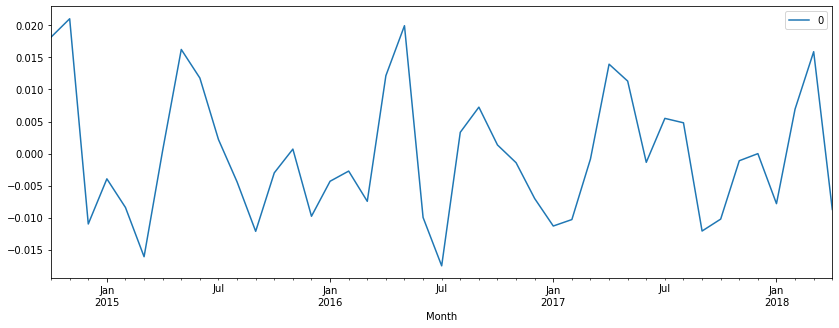

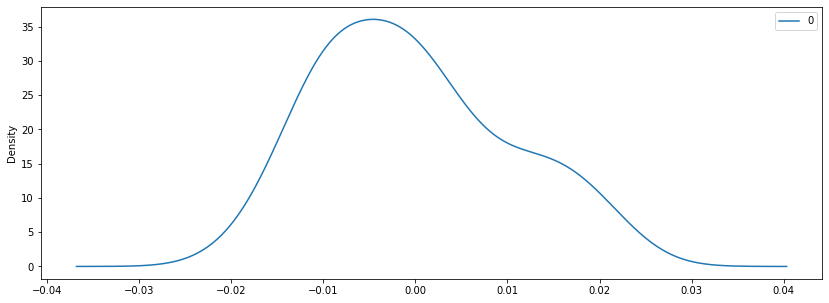

               0
count  43.000000
mean   -0.000233
std     0.010199
min    -0.017520
25%    -0.008566
50%    -0.001367
75%     0.006217
max     0.021034


In [26]:
from pandas import DataFrame
from matplotlib import pyplot

for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        mod_arma = ARMA(log_minus_roll_diffed, order=(1,0))
        res_arma = mod_arma.fit()
        print(res_arma.summary())
        residuals = DataFrame(res_arma.resid)
        residuals.plot()
        pyplot.show()
        residuals.plot(kind = 'kde')
        pyplot.show()
        print(residuals.describe())

# First Order MA Model

                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 441.600
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -877.200
Time:                        13:10:33   BIC                           -869.475
Sample:                    04-01-2010   HQIC                          -874.076
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             4.092e-05      0.001      0.081      0.935      -0.001       0.001
ma.L1.Mean Value     1.0000      0.026     38.217      0.000       0.949       1.051
                            

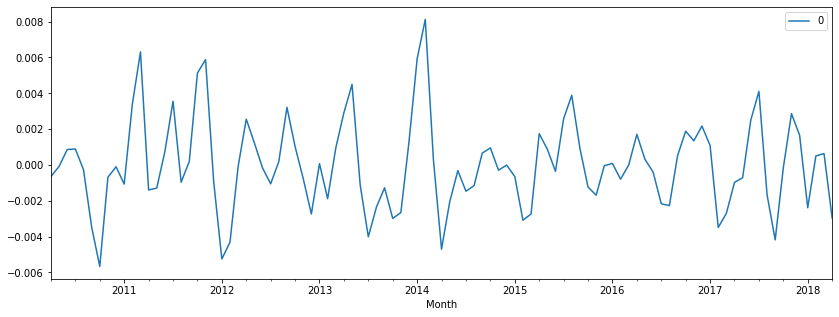

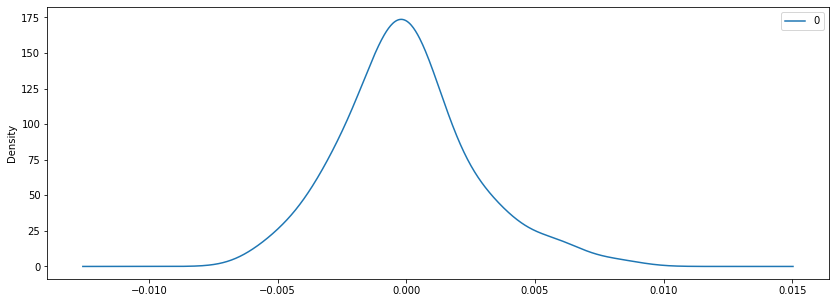

               0
count  97.000000
mean    0.000002
std     0.002554
min    -0.005670
25%    -0.001399
50%    -0.000103
75%     0.001085
max     0.008130
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 464.028
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -922.057
Time:                        13:10:34   BIC                           -914.333
Sample:                    04-01-2010   HQIC                          -918.934
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.000      0

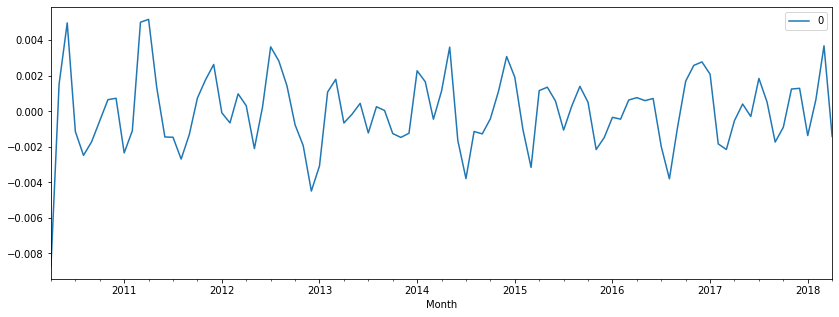

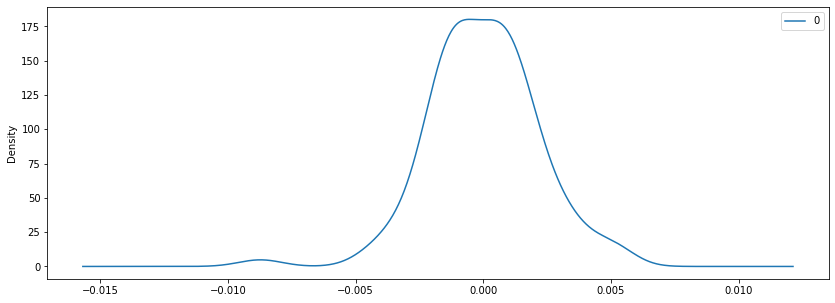

               0
count  97.000000
mean    0.000003
std     0.002132
min    -0.008731
25%    -0.001309
50%     0.000046
75%     0.001297
max     0.005179
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 461.403
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -916.806
Time:                        13:10:35   BIC                           -909.082
Sample:                    04-01-2010   HQIC                          -913.683
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.000      0

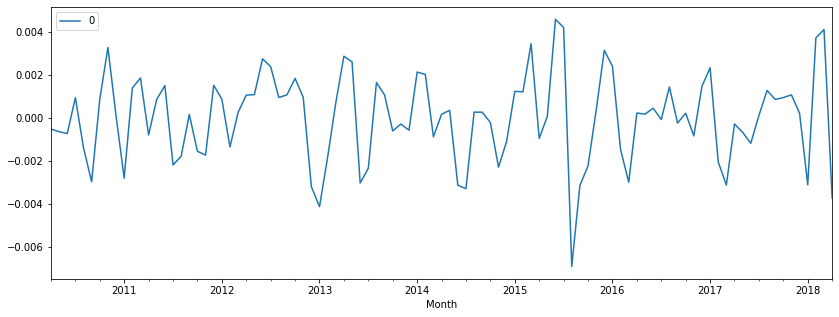

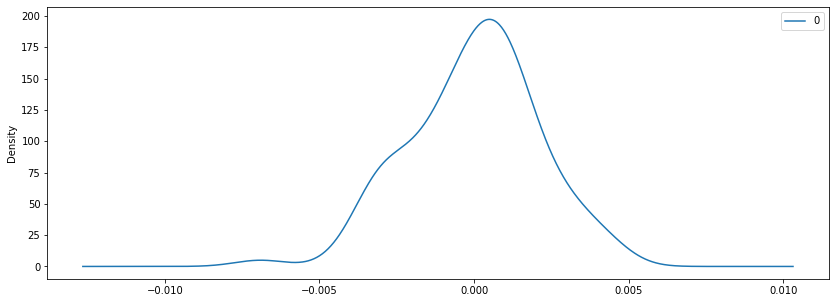

               0
count  97.000000
mean   -0.000002
std     0.002072
min    -0.006910
25%    -0.001357
50%     0.000204
75%     0.001224
max     0.004569
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 457.699
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -909.398
Time:                        13:10:35   BIC                           -901.674
Sample:                    04-01-2010   HQIC                          -906.275
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             6.803e-05      0.000      0

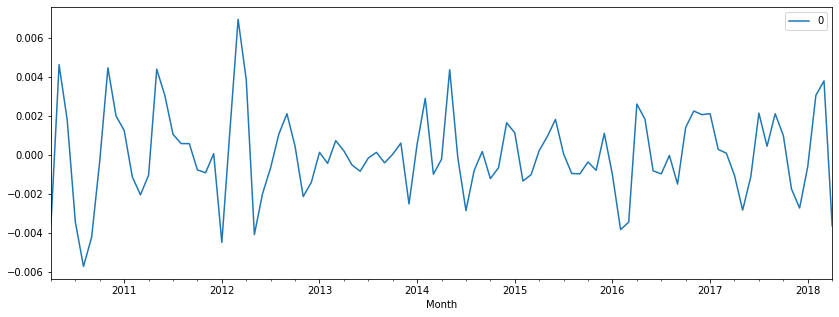

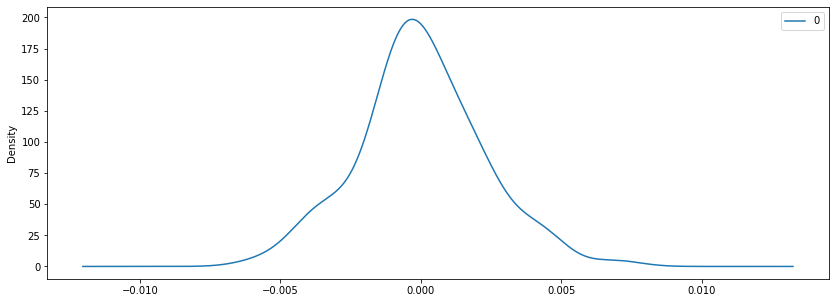

               0
count  97.000000
mean    0.000010
std     0.002210
min    -0.005707
25%    -0.001036
50%    -0.000029
75%     0.001250
max     0.006935
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 448.812
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -891.624
Time:                        13:10:36   BIC                           -883.900
Sample:                    04-01-2010   HQIC                          -888.501
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.000      0

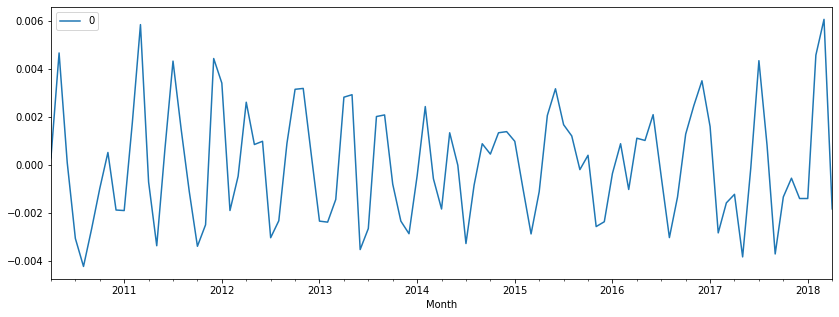

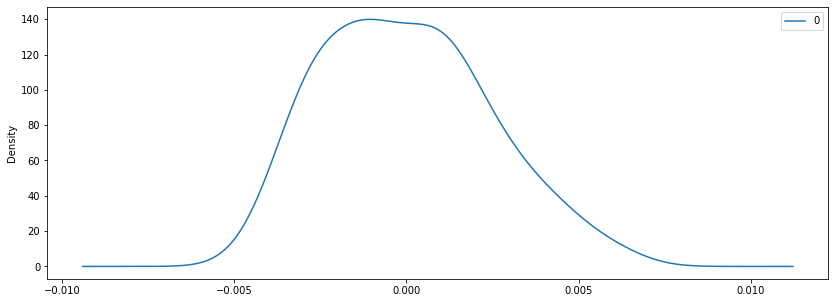

               0
count  97.000000
mean    0.000008
std     0.002386
min    -0.004243
25%    -0.001889
50%    -0.000203
75%     0.001486
max     0.006067
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 472.411
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -938.822
Time:                        13:10:37   BIC                           -931.098
Sample:                    04-01-2010   HQIC                          -935.698
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             7.177e-05      0.000      0

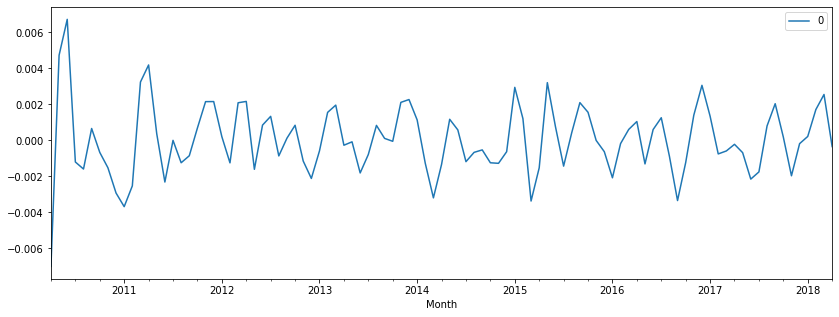

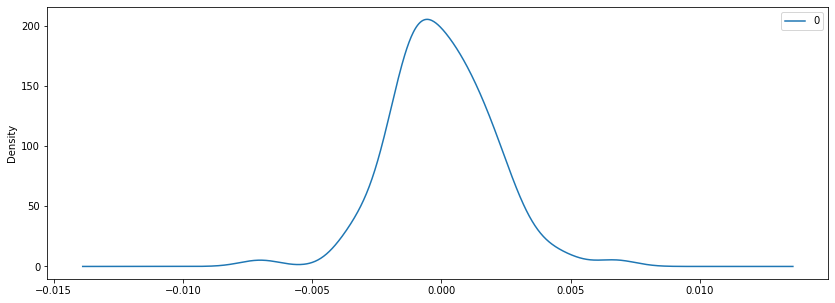

               0
count  97.000000
mean    0.000014
std     0.001969
min    -0.007006
25%    -0.001244
50%    -0.000080
75%     0.001210
max     0.006727
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 440.509
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -875.018
Time:                        13:10:38   BIC                           -867.294
Sample:                    04-01-2010   HQIC                          -871.894
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              9.62e-05      0.001      0

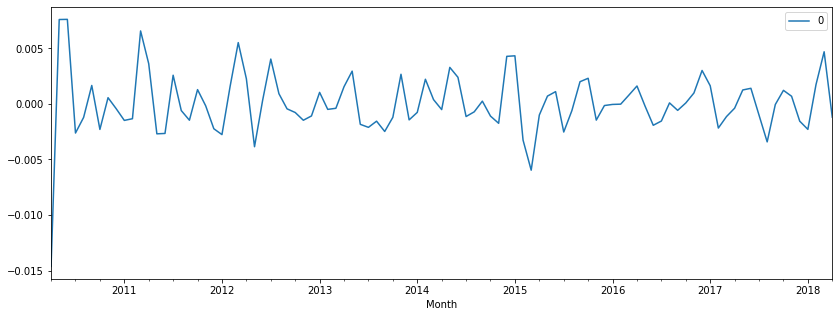

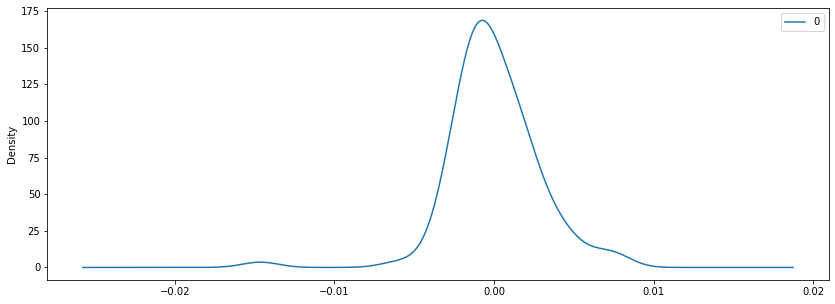

               0
count  97.000000
mean    0.000027
std     0.002837
min    -0.014634
25%    -0.001467
50%    -0.000384
75%     0.001551
max     0.007614
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 463.263
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -920.526
Time:                        13:10:39   BIC                           -912.801
Sample:                    04-01-2010   HQIC                          -917.402
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             8.999e-05      0.000      0

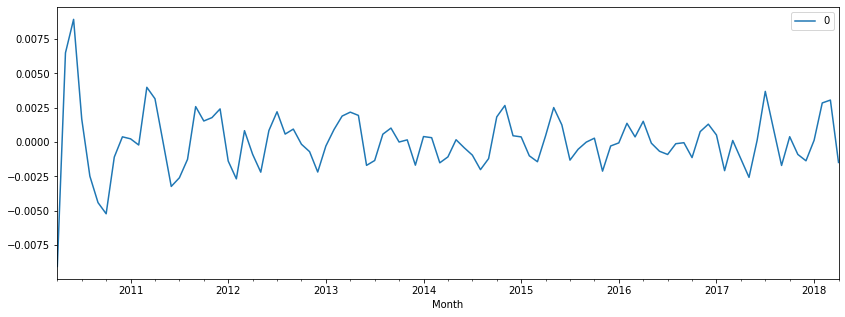

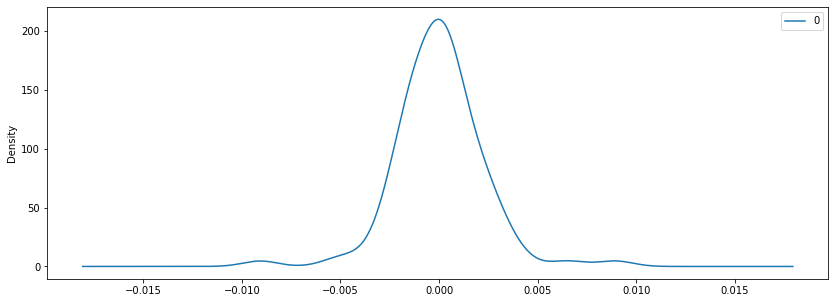

               0
count  97.000000
mean    0.000023
std     0.002224
min    -0.009068
25%    -0.001228
50%     0.000003
75%     0.000984
max     0.008946
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 489.449
Method:                       css-mle   S.D. of innovations              0.002
Date:                Fri, 17 Apr 2020   AIC                           -972.897
Time:                        13:10:39   BIC                           -965.173
Sample:                    04-01-2010   HQIC                          -969.774
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              2.36e-05      0.000      0

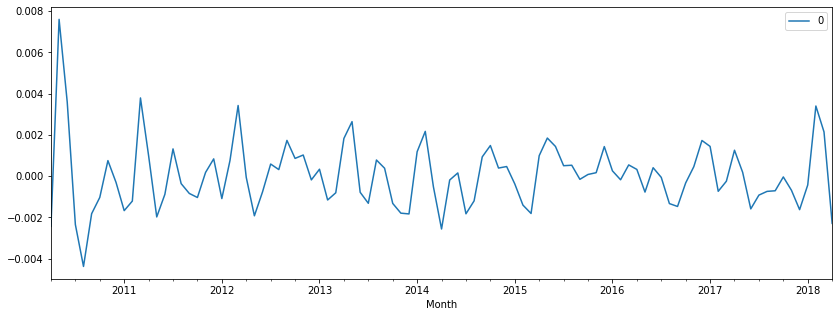

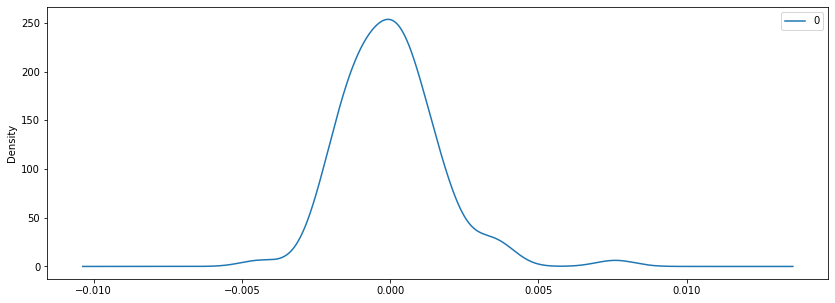

               0
count  97.000000
mean    0.000021
std     0.001644
min    -0.004379
25%    -0.001036
50%    -0.000061
75%     0.000836
max     0.007599
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 393.639
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -781.279
Time:                        13:10:40   BIC                           -773.555
Sample:                    04-01-2010   HQIC                          -778.156
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0002      0.001      0

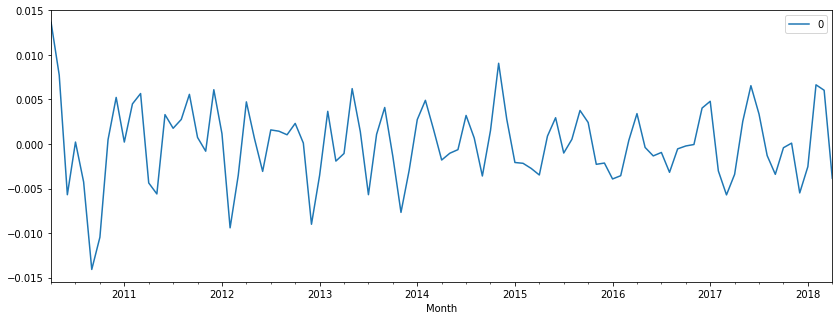

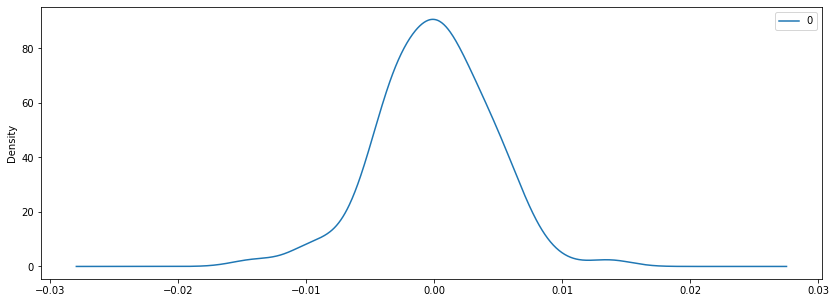

               0
count  97.000000
mean    0.000011
std     0.004354
min    -0.014086
25%    -0.002976
50%     0.000101
75%     0.002765
max     0.013652
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 415.142
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -824.285
Time:                        13:10:41   BIC                           -816.560
Sample:                    04-01-2010   HQIC                          -821.161
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             6.834e-05      0.001      0

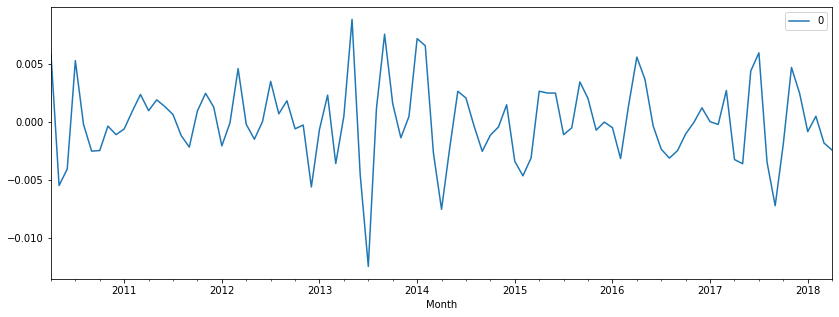

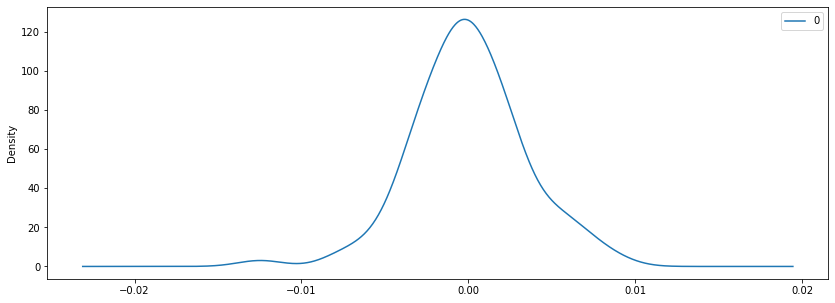

               0
count  97.000000
mean   -0.000008
std     0.003382
min    -0.012468
25%    -0.002194
50%    -0.000236
75%     0.001988
max     0.008808
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 394.515
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -783.031
Time:                        13:10:41   BIC                           -775.307
Sample:                    04-01-2010   HQIC                          -779.908
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -2.856e-05      0.001     -0

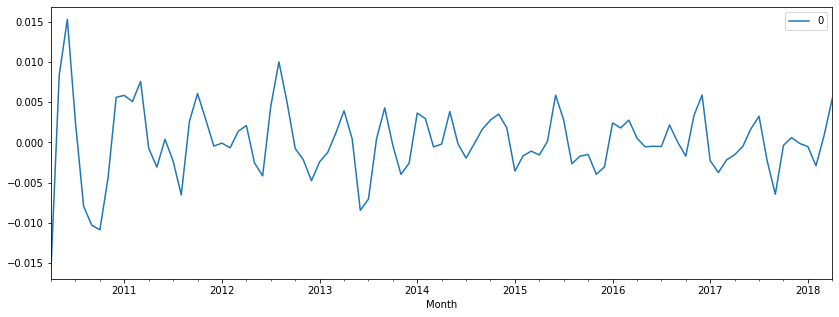

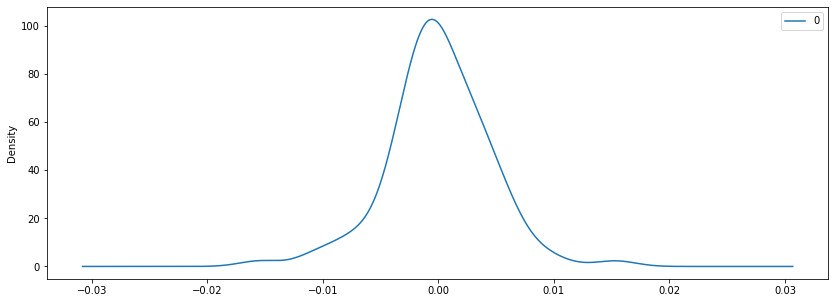

               0
count  97.000000
mean    0.000026
std     0.004412
min    -0.015423
25%    -0.002267
50%    -0.000202
75%     0.002763
max     0.015311
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 440.240
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -874.481
Time:                        13:10:42   BIC                           -866.757
Sample:                    04-01-2010   HQIC                          -871.358
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             4.966e-05      0.001      0

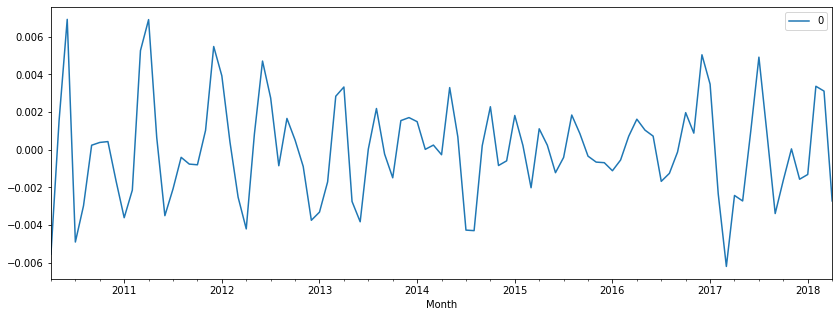

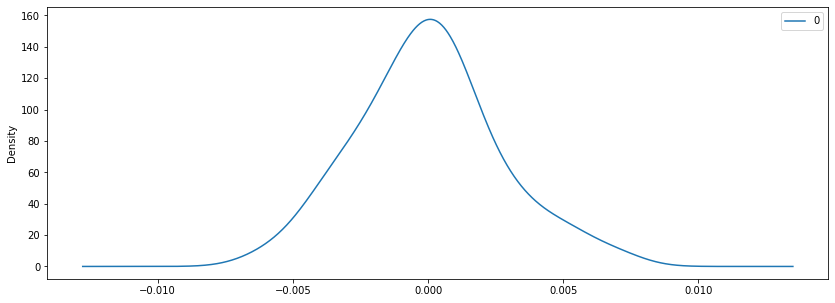

               0
count  97.000000
mean   -0.000002
std     0.002645
min    -0.006204
25%    -0.001659
50%     0.000030
75%     0.001547
max     0.006928
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 400.541
Method:                       css-mle   S.D. of innovations              0.004
Date:                Fri, 17 Apr 2020   AIC                           -795.082
Time:                        13:10:43   BIC                           -787.358
Sample:                    04-01-2010   HQIC                          -791.959
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.001      0

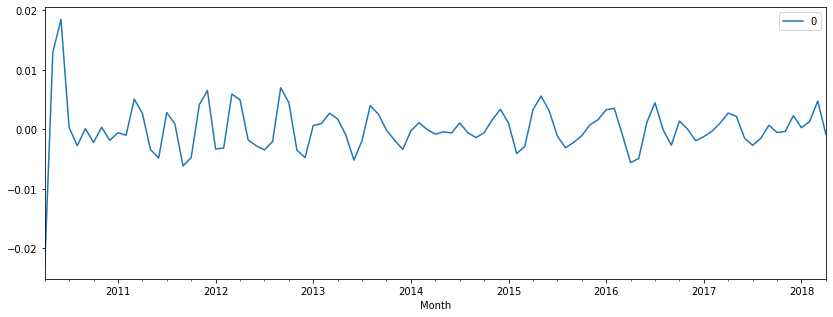

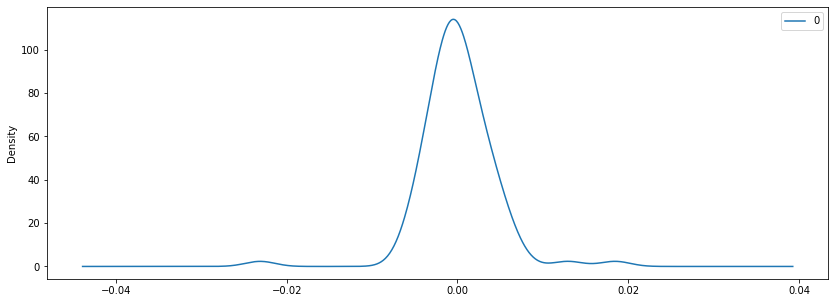

               0
count  97.000000
mean    0.000048
std     0.004375
min    -0.023105
25%    -0.001970
50%    -0.000288
75%     0.002155
max     0.018466
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 381.633
Method:                       css-mle   S.D. of innovations              0.005
Date:                Fri, 17 Apr 2020   AIC                           -757.266
Time:                        13:10:43   BIC                           -749.542
Sample:                    04-01-2010   HQIC                          -754.143
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -8.778e-05      0.001     -0

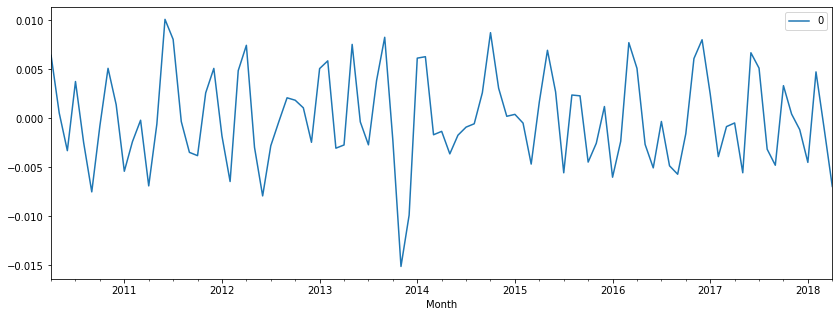

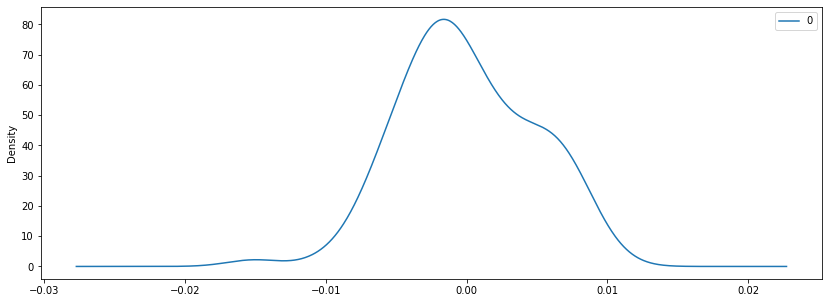

               0
count  97.000000
mean    0.000003
std     0.004749
min    -0.015104
25%    -0.003035
50%    -0.000475
75%     0.003345
max     0.010113
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 424.927
Method:                       css-mle   S.D. of innovations              0.003
Date:                Fri, 17 Apr 2020   AIC                           -843.855
Time:                        13:10:44   BIC                           -836.130
Sample:                    04-01-2010   HQIC                          -840.731
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0001      0.001      0

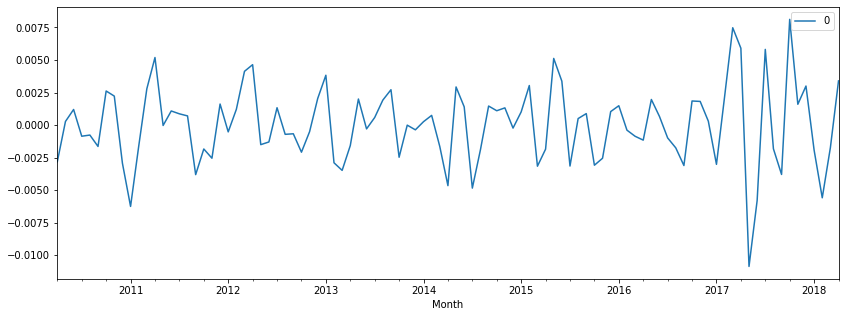

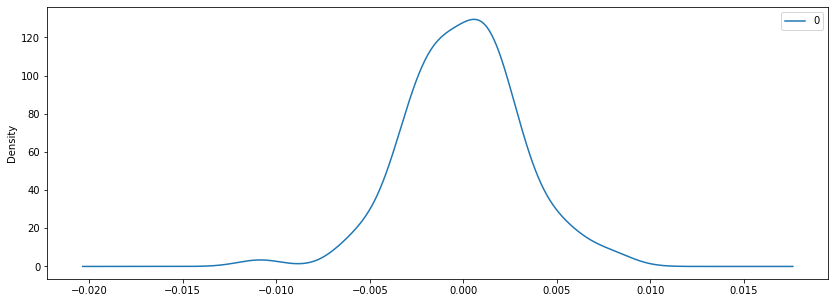

               0
count  97.000000
mean   -0.000006
std     0.003020
min    -0.010859
25%    -0.001835
50%    -0.000005
75%     0.001817
max     0.008121
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   97
Model:                     ARMA(0, 1)   Log Likelihood                 375.283
Method:                       css-mle   S.D. of innovations              0.005
Date:                Fri, 17 Apr 2020   AIC                           -744.566
Time:                        13:10:45   BIC                           -736.842
Sample:                    04-01-2010   HQIC                          -741.443
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.0001      0.001     -0

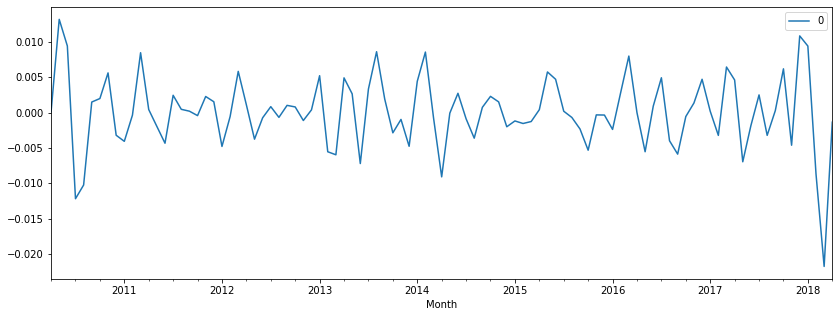

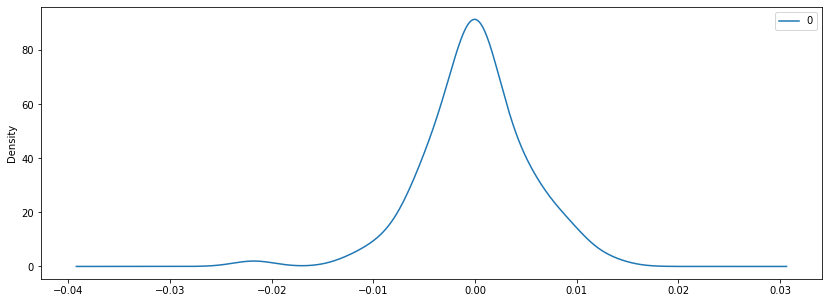

               0
count  97.000000
mean    0.000034
std     0.005137
min    -0.021757
25%    -0.002385
50%     0.000110
75%     0.002495
max     0.013178
                              ARMA Model Results                              
Dep. Variable:             Mean Value   No. Observations:                   43
Model:                     ARMA(0, 1)   Log Likelihood                 147.262
Method:                       css-mle   S.D. of innovations              0.008
Date:                Fri, 17 Apr 2020   AIC                           -288.524
Time:                        13:10:45   BIC                           -283.240
Sample:                    10-01-2014   HQIC                          -286.576
                         - 04-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0012      0.002      0

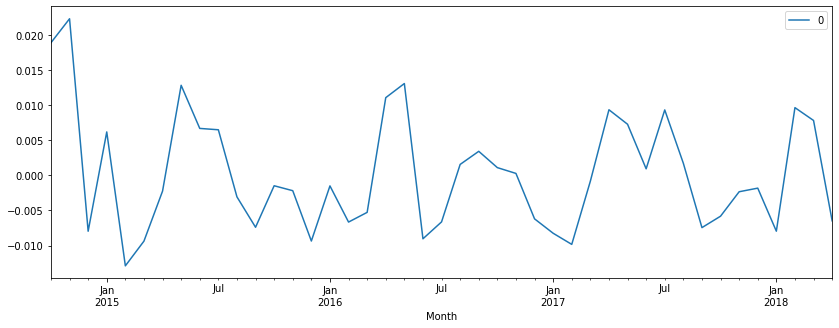

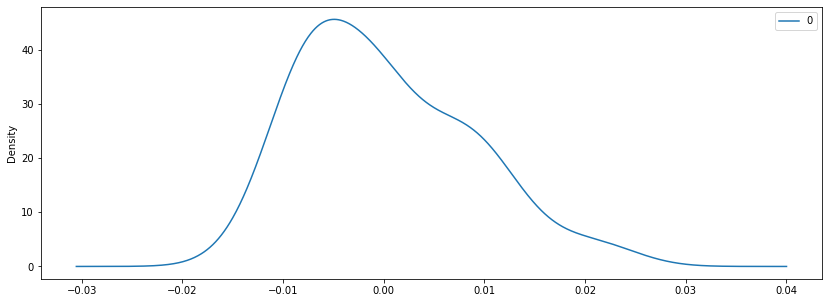

               0
count  43.000000
mean    0.000202
std     0.008364
min    -0.012904
25%    -0.006641
50%    -0.001488
75%     0.006622
max     0.022377


In [27]:
for zip in list(boston['RegionName'].unique()):
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        mod_arma = ARMA(log_minus_roll_diffed, order=(0,1))
        res_arma = mod_arma.fit()
        print(res_arma.summary())
        residuals = DataFrame(res_arma.resid)
        residuals.plot()
        pyplot.show()
        residuals.plot(kind = 'kde')
        pyplot.show()
        print(residuals.describe())

## This is all well and good, but we should probably use our model to make actual predictions. And if we're going to do that, we should also probably create a train/test split.... lol

Test RMSE: 0.002134258


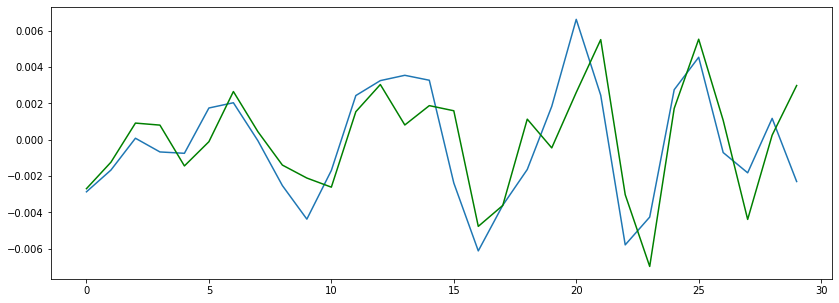

Test RMSE: 0.001802688


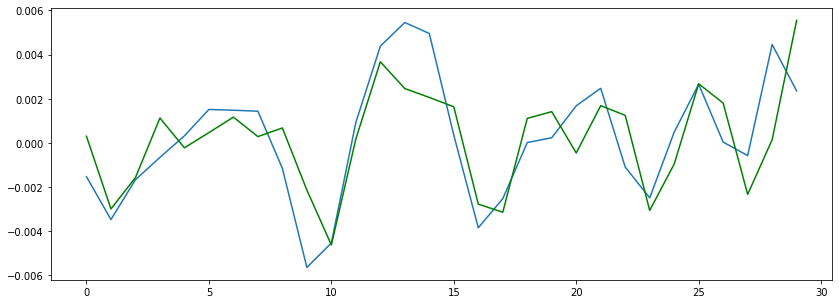

Test RMSE: 0.002393894


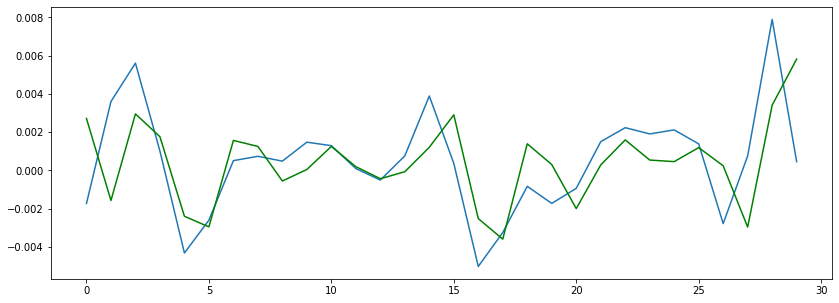

Test RMSE: 0.002052110


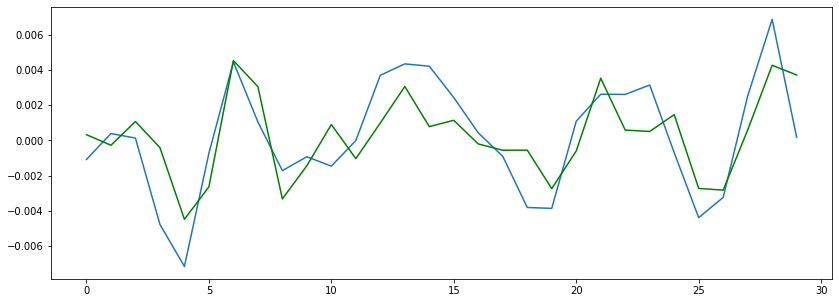

Test RMSE: 0.002642868


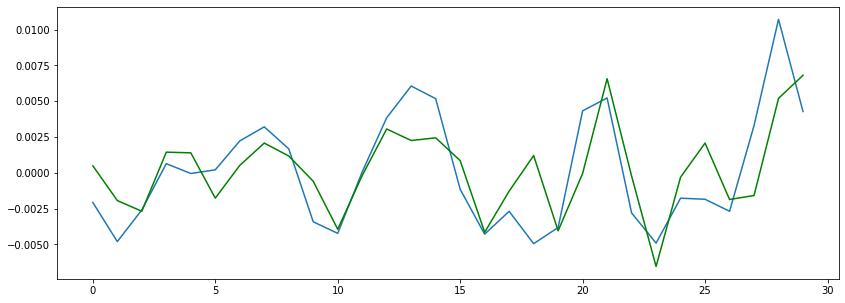

Test RMSE: 0.001341900


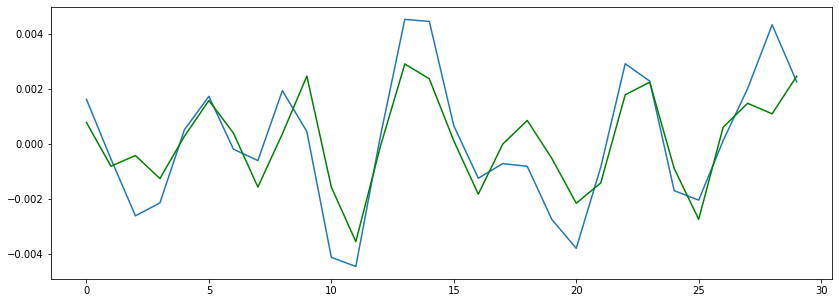

Test RMSE: 0.001524523


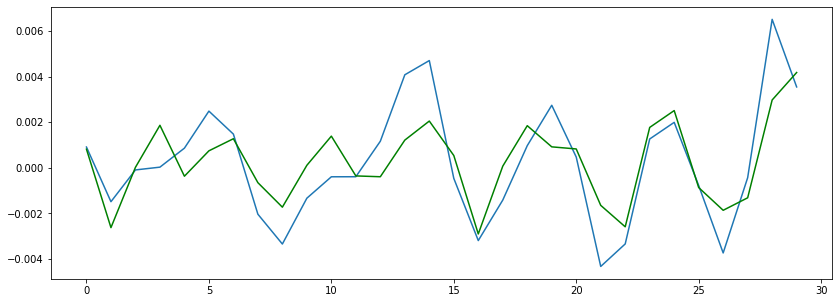

Test RMSE: 0.001701145


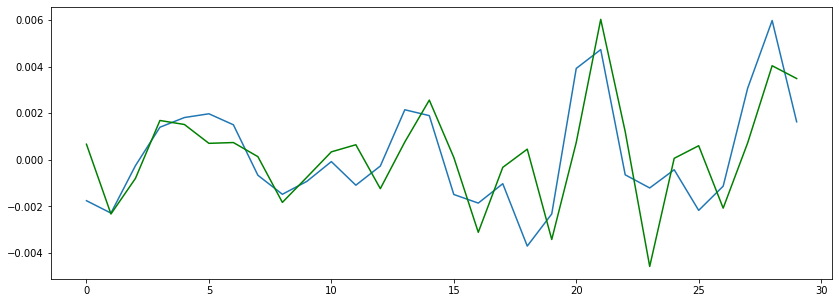

Test RMSE: 0.001201016


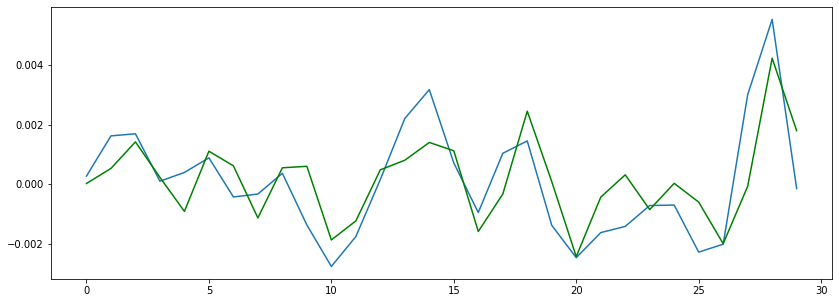

Test RMSE: 0.003464661


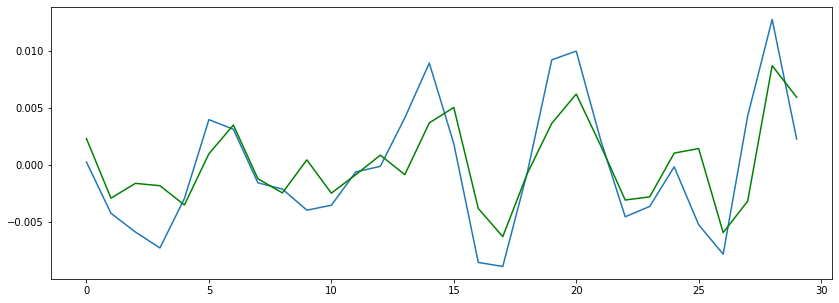

Test RMSE: 0.003014048


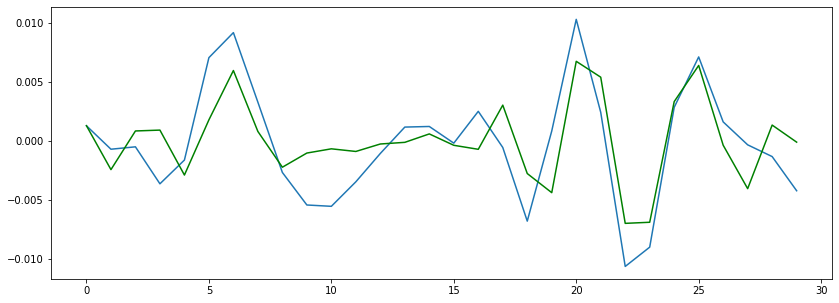

Test RMSE: 0.003126479


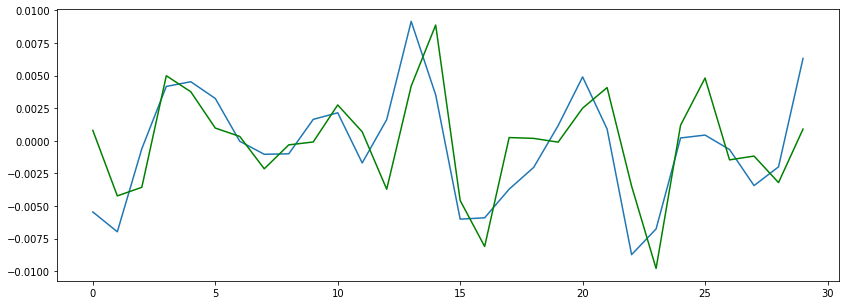

Test RMSE: 0.002637266


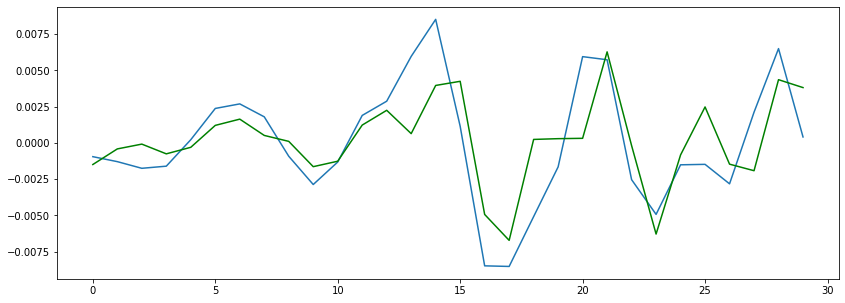

Test RMSE: 0.002535593


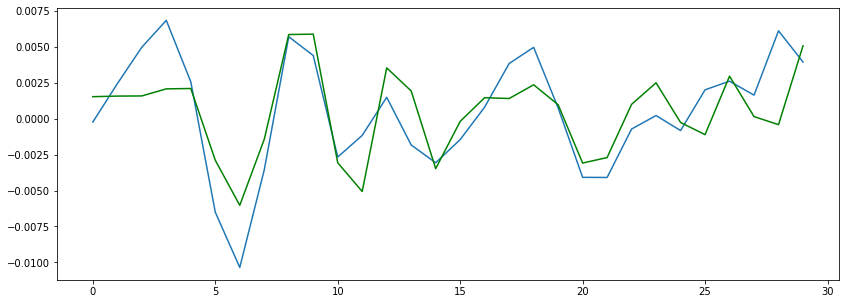

Test RMSE: 0.004919814


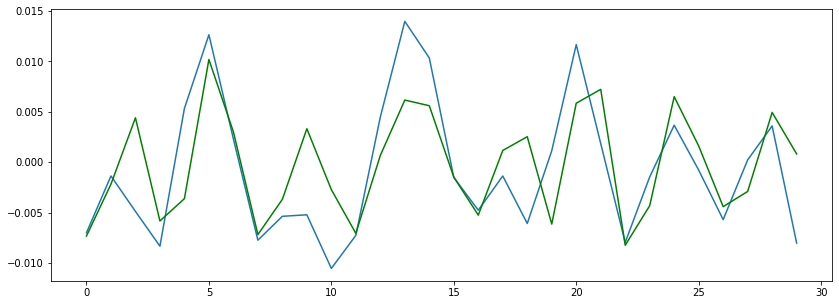

Test RMSE: 0.004407703


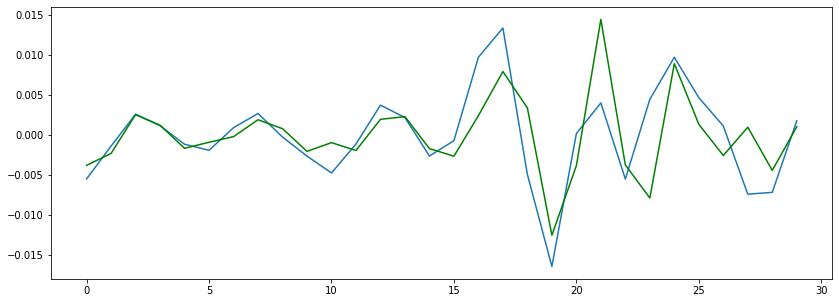

Test RMSE: 0.006652059


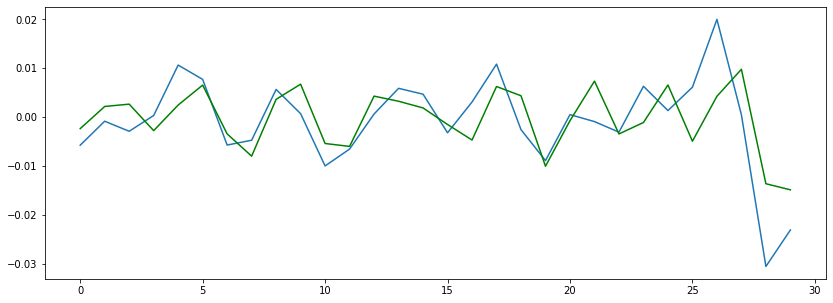

Test RMSE: 0.008325363


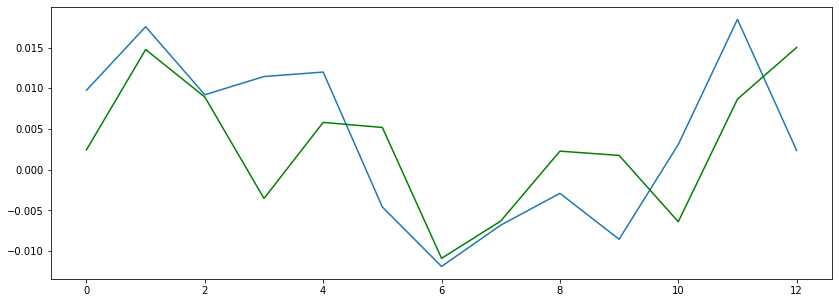

In [58]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA

for zip in list(boston['RegionName'].unique()):
        # Making a temporary dataframe with one zip code only and formatting it a little bit
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        
        # Transforming my data to ensure it is stationary
        log_df = np.log(temp_df)
        roll_log = log_df.rolling(window = 2).mean()
        log_minus_roll = log_df - roll_log
        log_minus_roll_diffed = log_minus_roll.diff(periods = 2)
        log_minus_roll_diffed.dropna(inplace = True)
        
        # Train/test split
        X = log_minus_roll_diffed.values
        size = int(len(X)*.7)
        train, test = X[0:size], X[size:len(X)]
        history = [x for x in train]
        predictions = []
        
        # Modeling
        for t in range(len(test)):
            mod_arma = ARMA(history, order=(3, 0))
            res_arma = mod_arma.fit()
            output = res_arma.forecast()
            yhat = output[0]
            predictions.append(yhat)
            obs = test[t]
            history.append(obs)
            #print('predicted: %f, expected: %f' % (yhat, obs))
        error = mean_squared_error(test, predictions)
        print('Test RMSE: %.9f' % np.sqrt(error))
        pyplot.plot(test)
        pyplot.plot(predictions, color = 'green')
        pyplot.show()
        

## Okay, I did some ARMA modeling with manually transformed data but now I am going to explore ARIMA modeling.

## Trying this out for just one zip code before iterating through every single zip code lol

In [8]:
import itertools

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [156]:
temp_df = boston[(boston.RegionName == 2135)]
temp_df.set_index('Month', inplace = True)
temp_df = temp_df.drop(['RegionName'], axis = 1)

ans = []
for comb in pdq:
    for combs in pdqs:
        try:
            mod = sm.tsa.statespace.SARIMAX(temp_df,
                                            order = comb,
                                            seasonal_order = combs,
                                            enforce_stationarity = False,
                                            enforce_intertibility = False)
            output = mod.fit()
            ans.append([comb, combs, output.aic])
            print('ARIMA {} x {}12 : AIC Calculated = {}'.format(comb, combs, output.aic))
        except:
            continue

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2892.137890071583
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2500.999063733193
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2140.6328300974365
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1843.0924389358233
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2064.653868251628
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1896.9987943012209
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1800.2825844105375
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1695.0686086584958
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2794.9393584612358
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2440.471370453047
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2066.2808427066334
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1769.0873119560636
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2488.1639681434253
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2433.5610137721

In [197]:
ans_df = pd.DataFrame(ans, columns = ['pdq', 'pdqs', 'aic'])
ans_df.loc[ans_df['aic'].idxmin()]

pdq         (1, 1, 1)
pdqs    (1, 1, 1, 12)
aic           1366.84
Name: 63, dtype: object

In [158]:
ARIMA_MODEL = sm.tsa.statespace.SARIMAX(temp_df,
                                        order = (1, 1, 1),
                                        seasonal_order = (1, 1, 1, 12),
                                        enforce_stationarity = False,
                                        enforce_invertibility = False)
output = ARIMA_MODEL.fit()

print(output.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6736      0.104      6.451      0.000       0.469       0.878
ma.L1          0.2190      0.038      5.713      0.000       0.144       0.294
ar.S.L12      -0.3547      0.108     -3.270      0.001      -0.567      -0.142
ma.S.L12      -0.0278      0.039     -0.711      0.477      -0.104       0.049
sigma2      7.963e+06   1.37e-09   5.83e+15      0.000    7.96e+06    7.96e+06


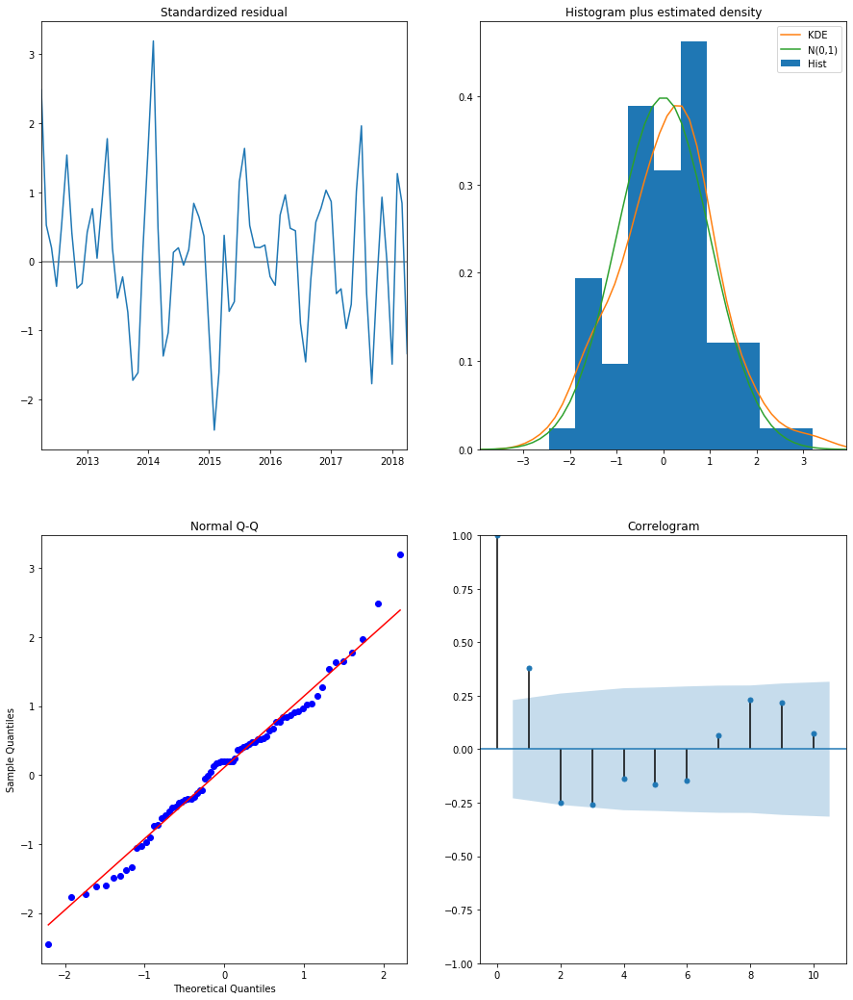

In [159]:
output.plot_diagnostics(figsize = (15, 18))
plt.show()

# Modeling

In [160]:
pred = output.get_prediction(start = pd.to_datetime('2017-01-01'), dynamic = False)
pred_conf = pred.conf_int()

# One Step Ahead

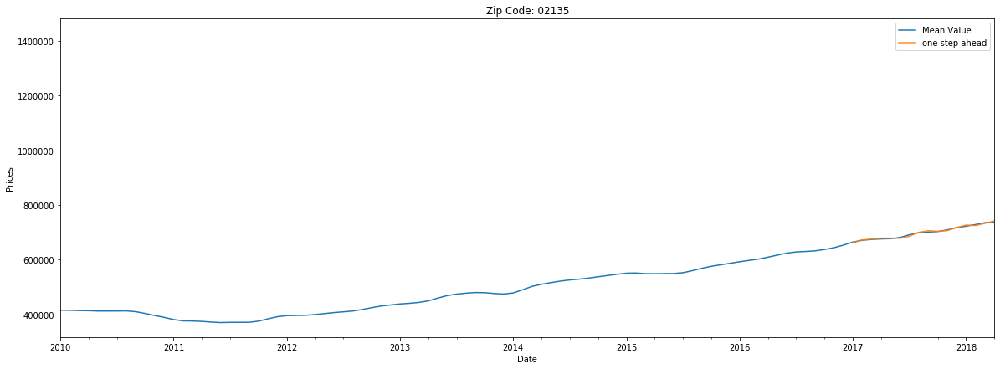

In [190]:
rcParams['figure.figsize'] = 20, 7

ax = temp_df['2010':].plot(label = 'observed')
pred.predicted_mean.plot(ax = ax, title = 'Zip Code: 02135', label = 'one step ahead', alpha = .9)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1], color = 'g', alpha = .5)

ax.set_xlabel('Date')
ax.set_ylabel('Prices')
plt.legend()

plt.show()

In [162]:
zip_forecasted = pred.predicted_mean
zip_truth = temp_df['2017-01-01':]

# Compute the mean square error
rmse = np.sqrt(((zip_forecasted - zip_truth['Mean Value']) ** 2).mean())
print('The Mean Squared Error of our forecasts is {}'.format(round(rmse, 4)))

The Mean Squared Error of our forecasts is 2997.0746


# Dynamic

In [166]:
pred_dynamic = output.get_prediction(start = pd.to_datetime('2017-01-01'), dynamic = True, full_results = True)
pred_dynamic_conf = pred_dynamic.conf_int()

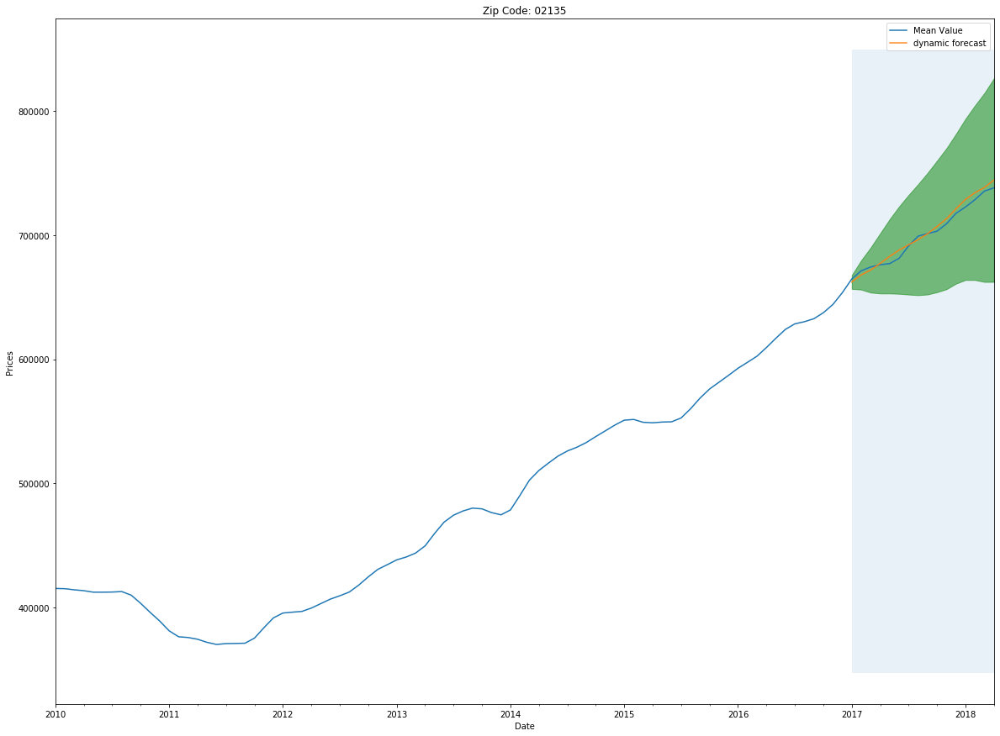

In [185]:
ax = temp_df['2010':].plot(title = 'Zip Code: 02135', label = 'observed', figsize=(20, 15))
pred_dynamic.predicted_mean.plot(ax = ax, label = 'dynamic forecast', alpha = .9)

ax.fill_between(pred_dynamic_conf.index,
                pred_dynamic_conf.iloc[:, 0],
                pred_dynamic_conf.iloc[:, 1], color = 'g', alpha = .5)

ax.fill_betweenx(ax.get_ylim(), pd.to_datetime('2017-01-01'), zip_forecasted.index[-1], alpha=.1, zorder=-1)

ax.set_xlabel('Date')
ax.set_ylabel('Prices')

plt.legend()
plt.show()

In [168]:
zip_forecasted = pred_dynamic.predicted_mean
zip_truth = temp_df['2017-01-01':]

# Compute the mean square error
rmse = np.sqrt(((zip_forecasted - zip_truth['Mean Value']) ** 2).mean())
print('The Mean Squared Error of our forecasts is {}'.format(round(rmse, 4)))

The Mean Squared Error of our forecasts is 4123.951


In [202]:
prediction = output.get_forecast(steps=60)
pred_conf = prediction.conf_int()
prediction.predicted_mean

2018-05-01    2.181910e+06
2018-06-01    2.209990e+06
2018-07-01    2.237062e+06
2018-08-01    2.274671e+06
2018-09-01    2.302052e+06
2018-10-01    2.325830e+06
2018-11-01    2.343767e+06
2018-12-01    2.351680e+06
2019-01-01    2.325504e+06
2019-02-01    2.306376e+06
2019-03-01    2.300997e+06
2019-04-01    2.306893e+06
2019-05-01    2.333078e+06
2019-06-01    2.355371e+06
2019-07-01    2.394580e+06
2019-08-01    2.445767e+06
2019-09-01    2.477249e+06
2019-10-01    2.498363e+06
2019-11-01    2.511385e+06
2019-12-01    2.518686e+06
2020-01-01    2.492144e+06
2020-02-01    2.492418e+06
2020-03-01    2.514796e+06
2020-04-01    2.532862e+06
2020-05-01    2.568753e+06
2020-06-01    2.593968e+06
2020-07-01    2.627049e+06
2020-08-01    2.671381e+06
2020-09-01    2.700792e+06
2020-10-01    2.723251e+06
2020-11-01    2.738754e+06
2020-12-01    2.746364e+06
2021-01-01    2.720008e+06
2021-02-01    2.710486e+06
2021-03-01    2.718850e+06
2021-04-01    2.730772e+06
2021-05-01    2.761762e+06
2

# Predicting into the Future

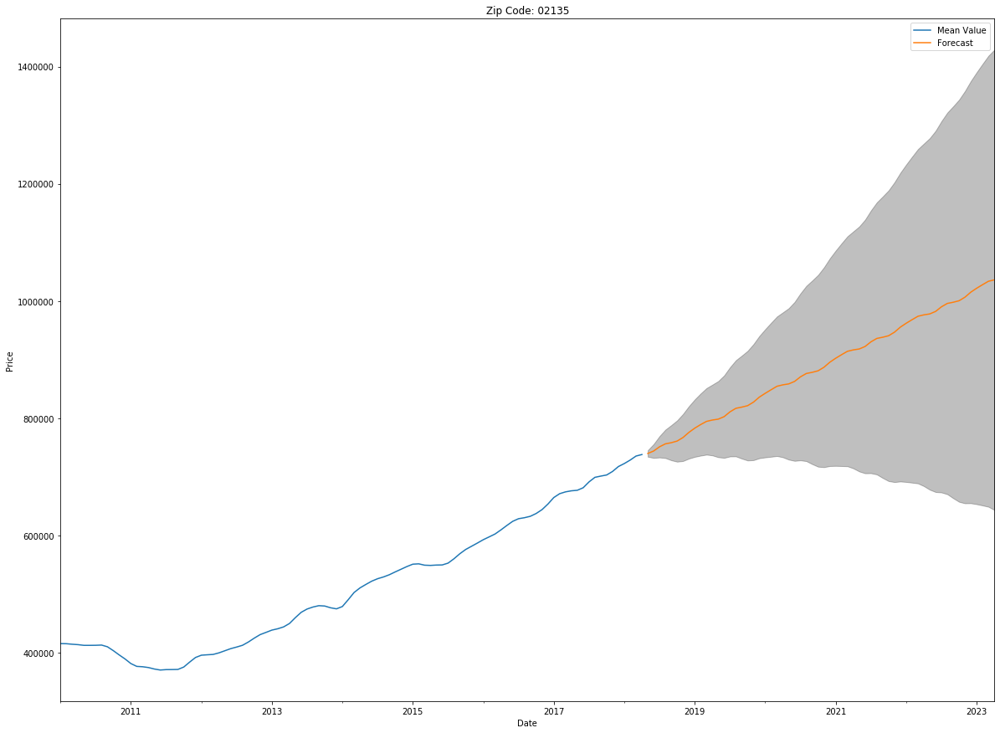

In [184]:
ax = temp_df.plot(label='observed', figsize=(20, 15))
prediction.predicted_mean.plot(title = 'Zip Code: 02135', ax=ax, label='Forecast')
ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1], color='k', alpha=0.25)
ax.set_xlabel('Date')
ax.set_ylabel('Price')

plt.legend()
plt.show()

# Now let's try iterating through for every zip code

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2892.137890071583
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2500.999063733193
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2140.6328300974365
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1843.0924389358233
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2064.653868251628
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1896.9987943012209
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1800.2825844105375
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1695.0686086584958
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2794.9393584612358
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2440.471370453047
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2066.2808427066334
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1769.0873119560636
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2488.1639681434253
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2433.5610137721

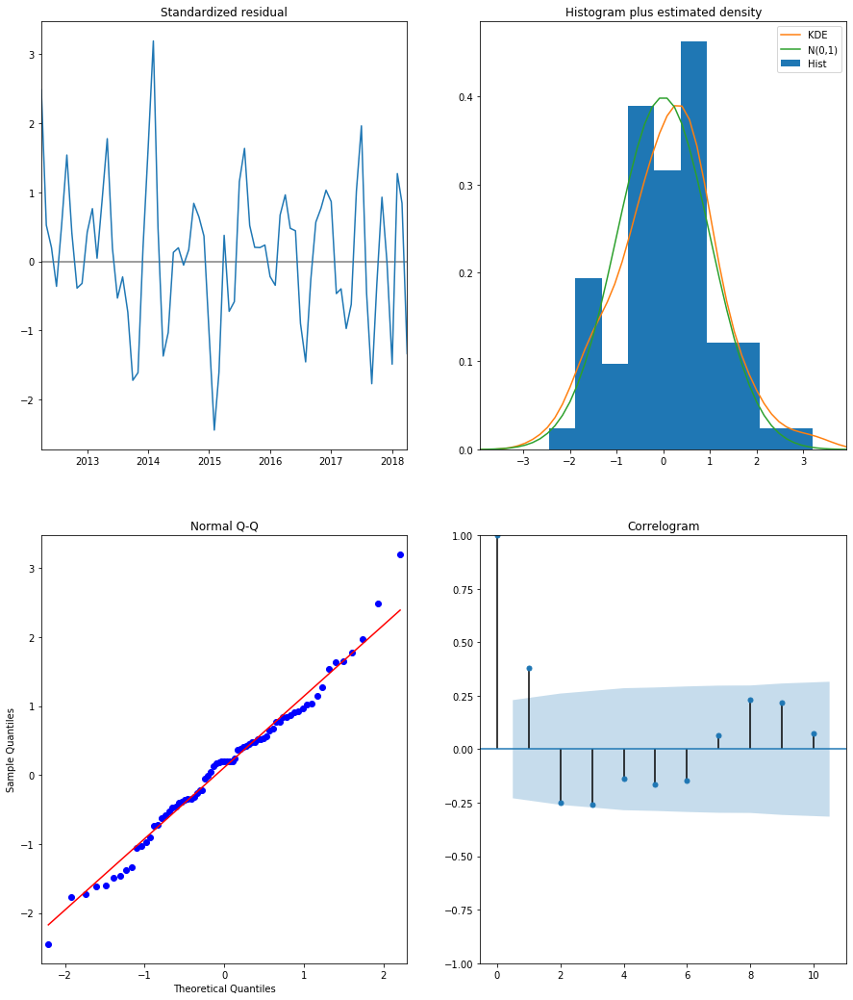

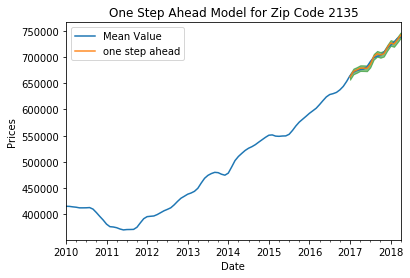

The Mean Squared Error of our forecasts is 2997.0746


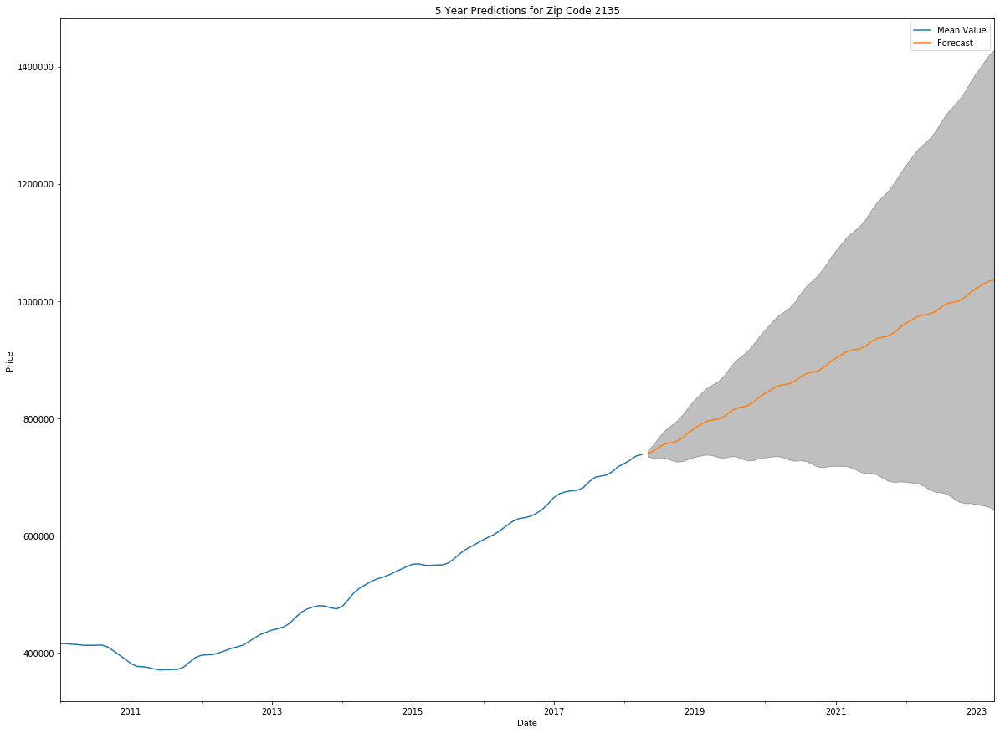

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2819.4400621006603
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2436.2227159654008
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2082.8722526552333
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1797.510942595117
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1969.6210259154955
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1861.9764979206425
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1730.5843922956
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1662.3639830832426
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2723.090145951662
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2377.449988304478
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2010.3262001238559
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1722.4589281875494
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2423.664097573204
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2370.5916904951214

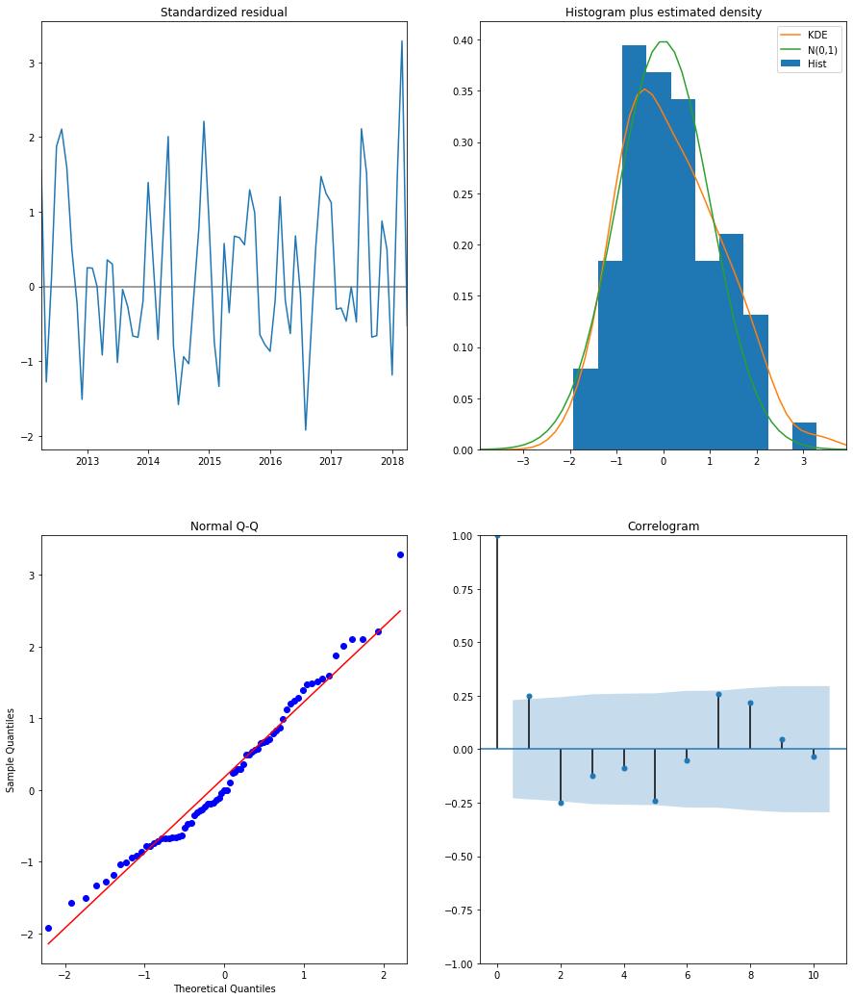

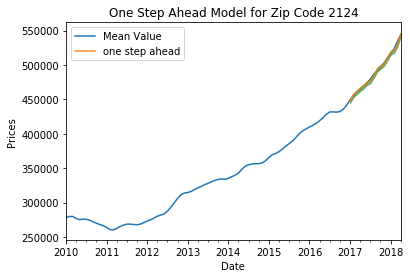

The Mean Squared Error of our forecasts is 1881.6776


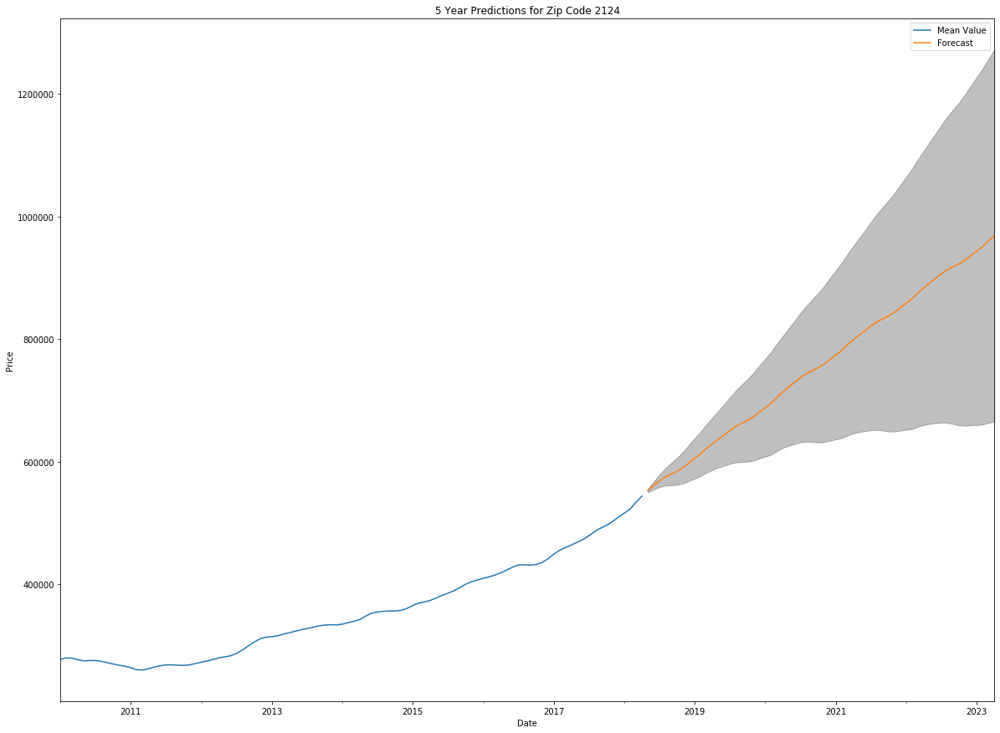

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2894.6706033329747
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2503.6716996155196
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2159.908550022592
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1858.3578798835515
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2025.0444093360427
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 2042.158198949701
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1756.3805306184643
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1764.981927187859
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2797.560283692107
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2442.756434048306
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2085.5251595423833
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1785.1813874862585
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2490.6060891122816
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2436.04628749595

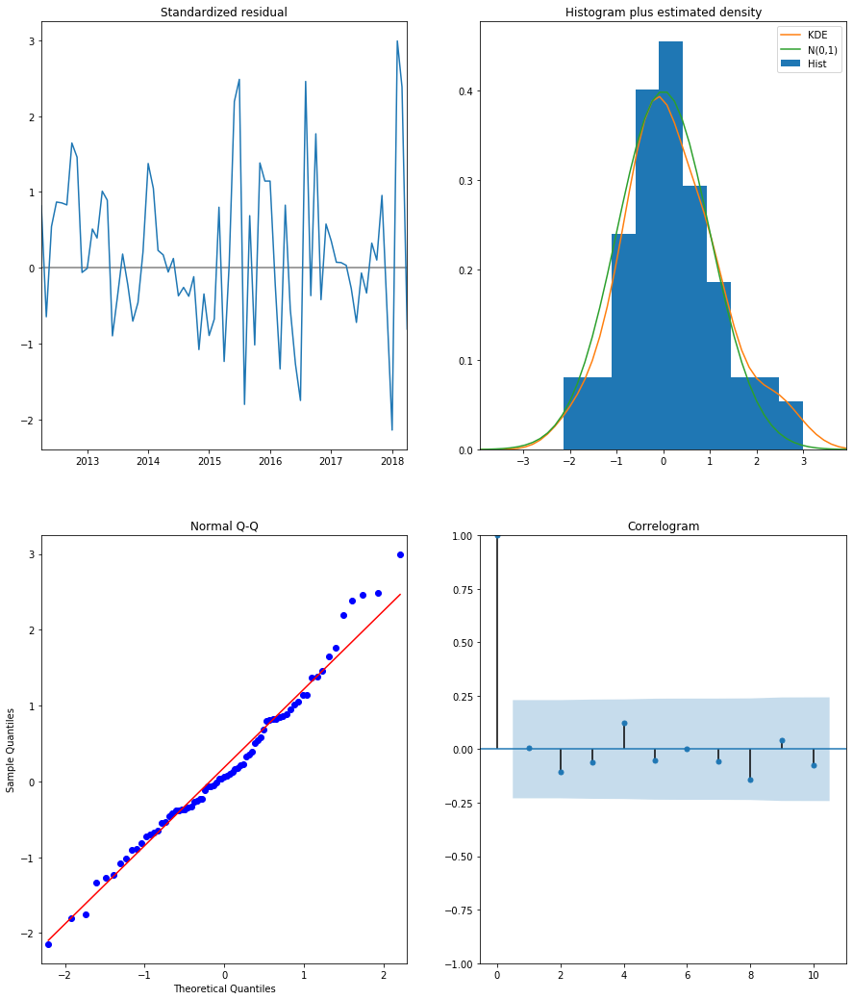

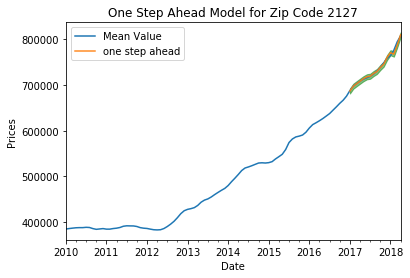

The Mean Squared Error of our forecasts is 3386.1721


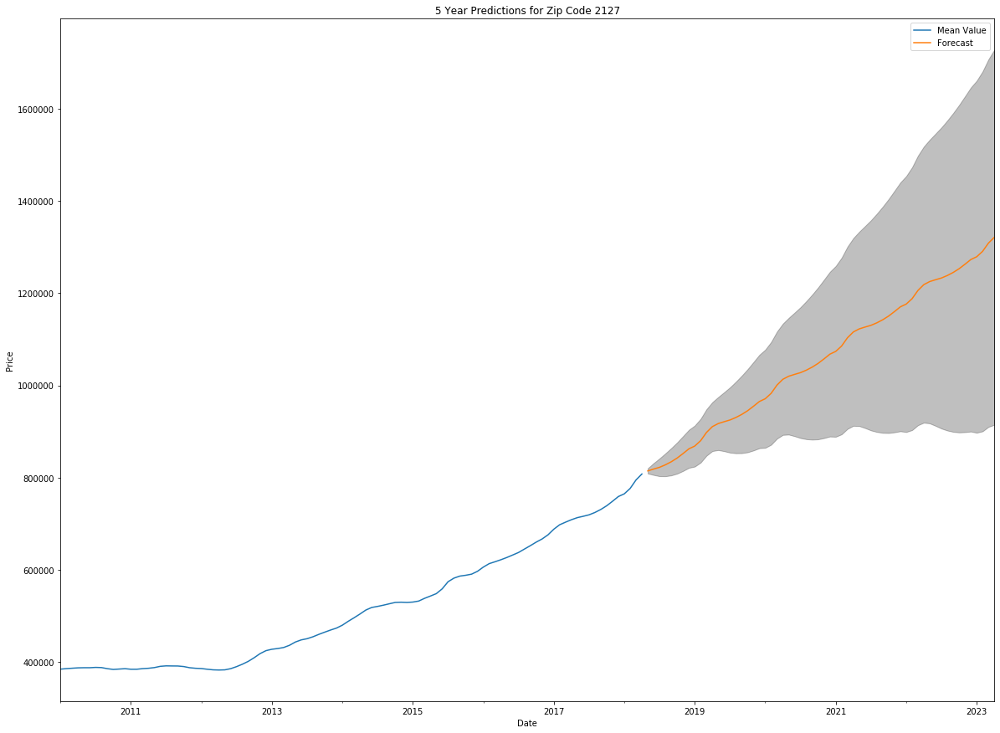

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2934.3076966226845
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2536.8054705982813
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2157.478600026926
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1862.616367774956
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2088.278042633764
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1998.8208400842623
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1842.8332529028512
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1768.089336038015
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2836.628095264189
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2476.940147305678
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2084.663101229583
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1786.5326034094703
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2525.5658452750627
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2470.170013683663


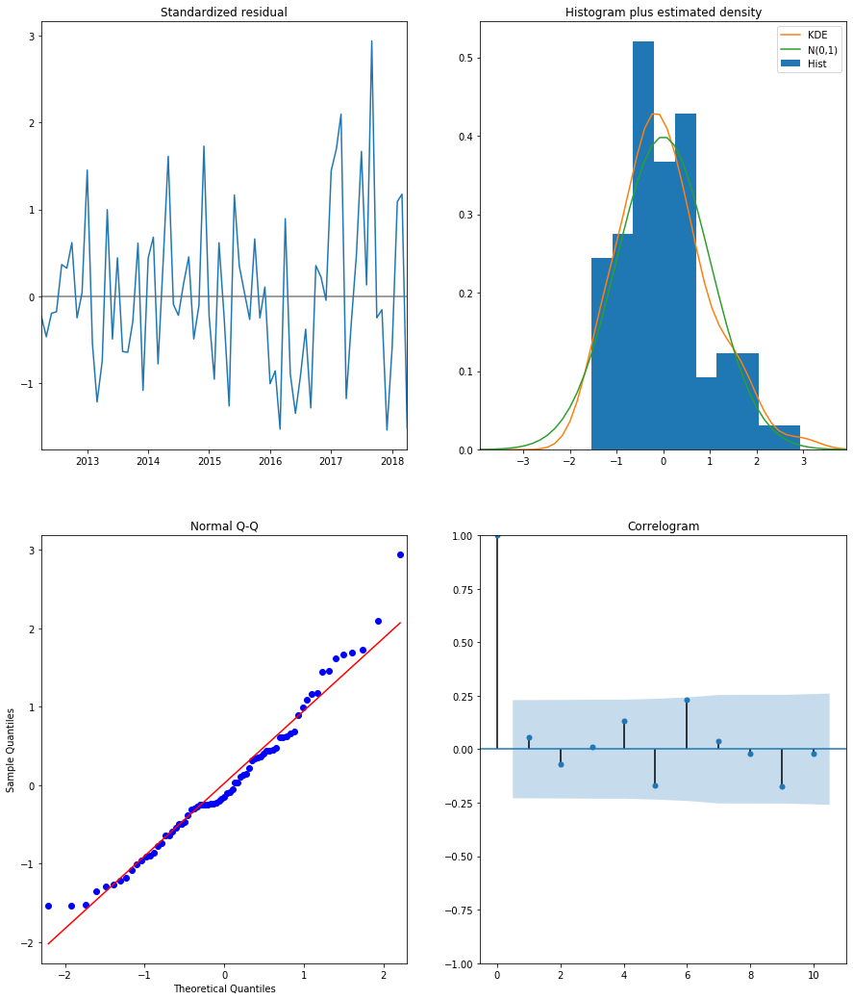

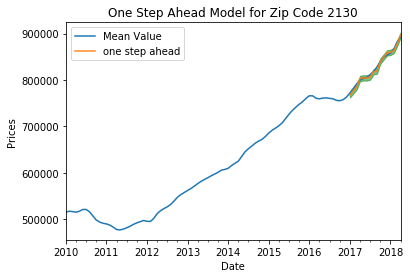

The Mean Squared Error of our forecasts is 4150.7384


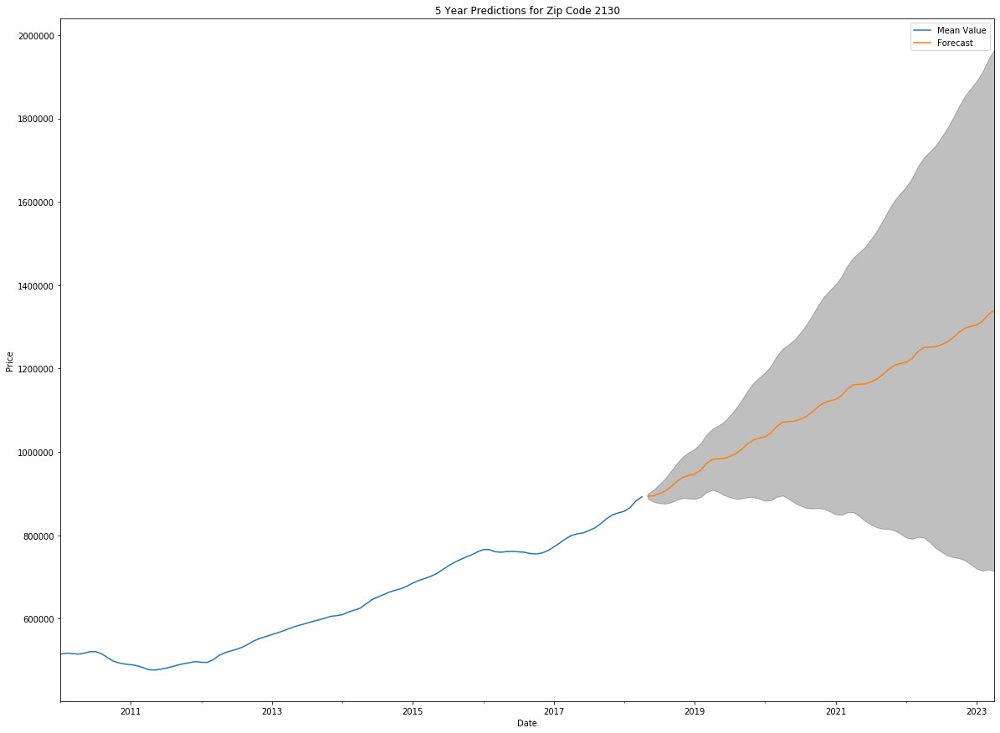

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2797.23496814937
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2418.5639126403016
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2084.901367821172
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1795.8934171060264
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1969.8768414010938
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1894.4689590851217
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1734.144056413737
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1695.9738279171788
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2701.180666678015
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2358.2988070766905
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2010.436621702555
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1722.8748791032583
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2404.205428622507
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2351.582840667217


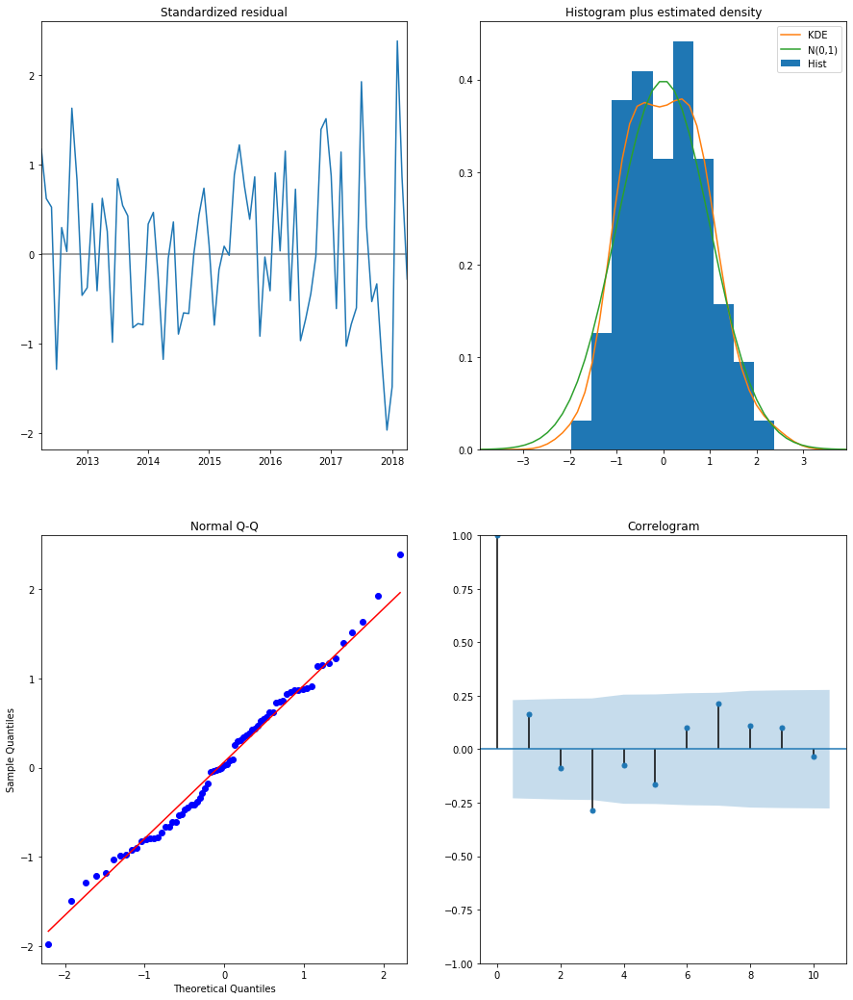

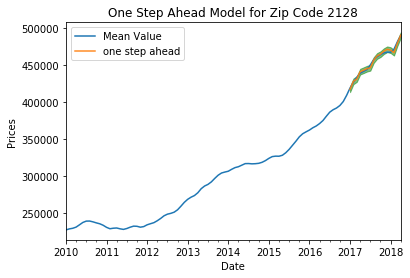

The Mean Squared Error of our forecasts is 2365.1407


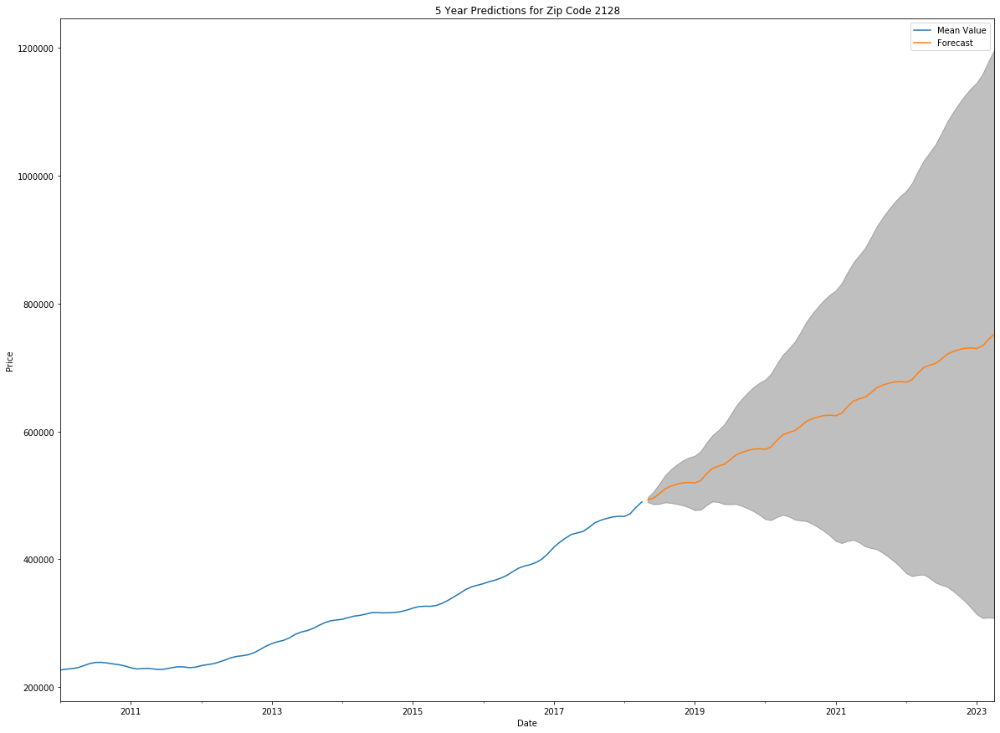

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2797.044928972055
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2413.7835904442118
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2017.8899382926124
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1739.0318287375285
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1939.9395415779404
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1879.9900760042444
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1693.6068952336602
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1675.1731849977637
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2700.8312198562153
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2357.562735076211
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 1924.051522679379
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1666.64216452119
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2403.532691141724
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2350.942716617102

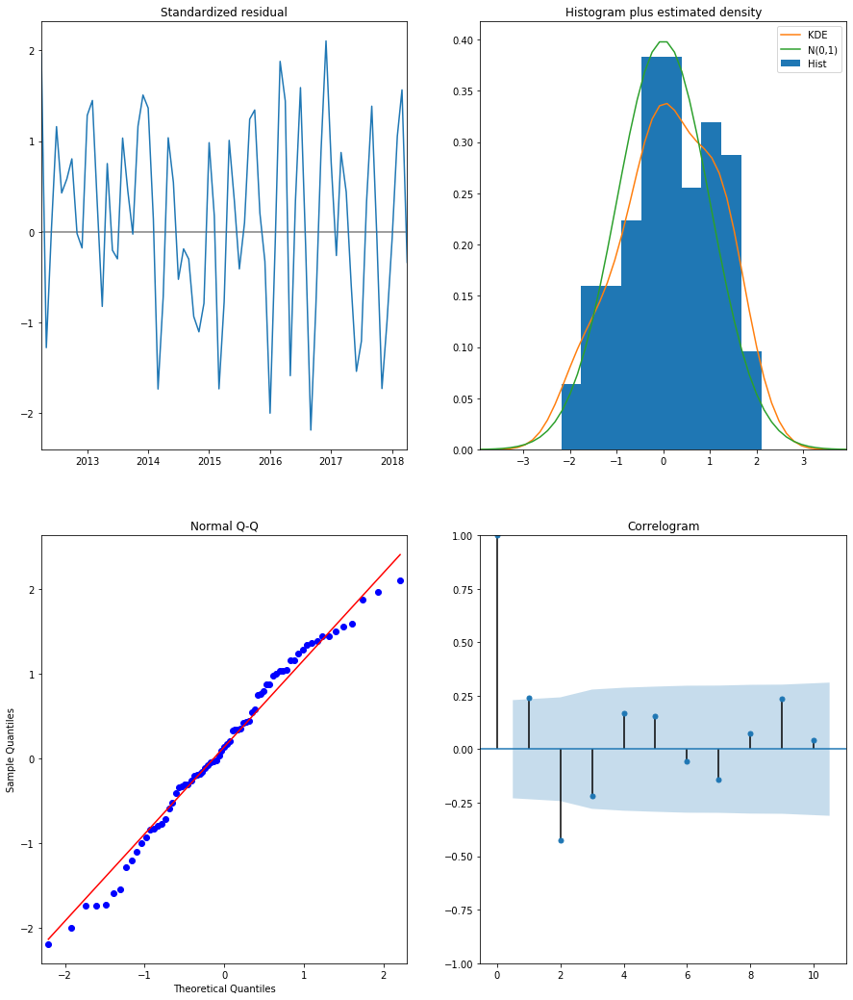

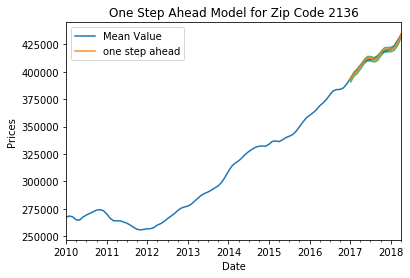

The Mean Squared Error of our forecasts is 1158.8426


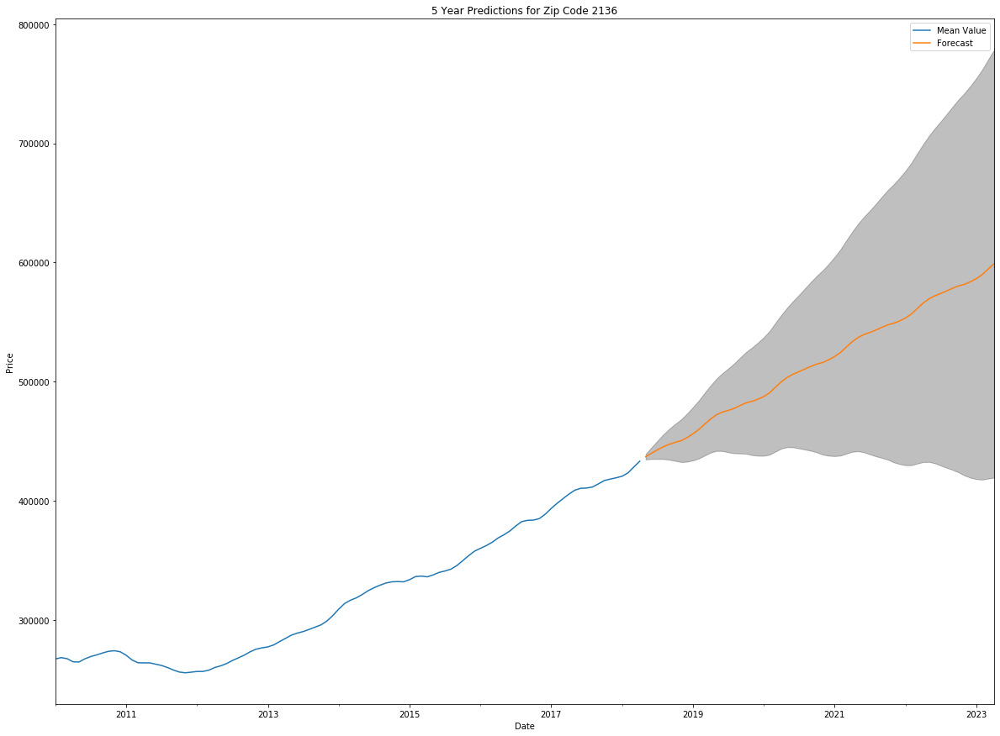

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2819.652233088339
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2438.288472179682
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2109.942176417458
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1818.9776609836044
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1990.3831985860475
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1910.1563102127484
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1714.2901053321941
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1670.2604536583854
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2723.3601163589983
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2377.7196906813942
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2035.8091491424977
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1743.3445362581356
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2423.9548786833934
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2370.853893611

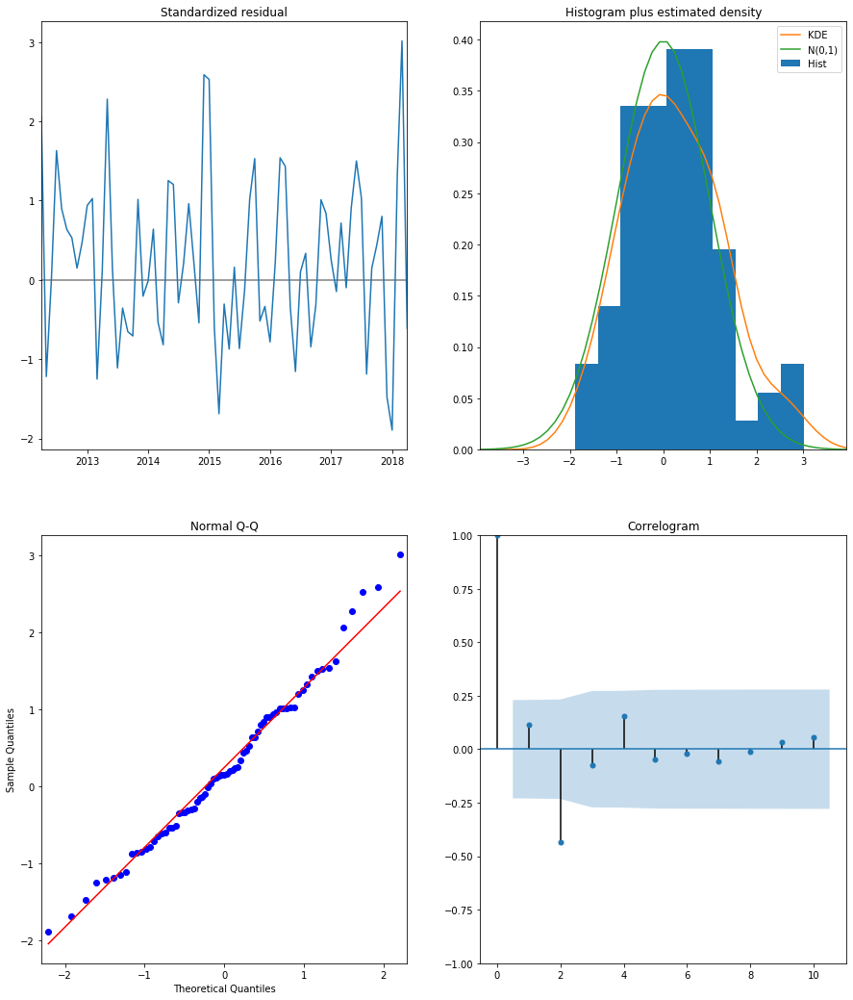

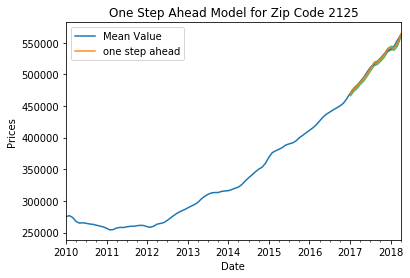

The Mean Squared Error of our forecasts is 1977.7768


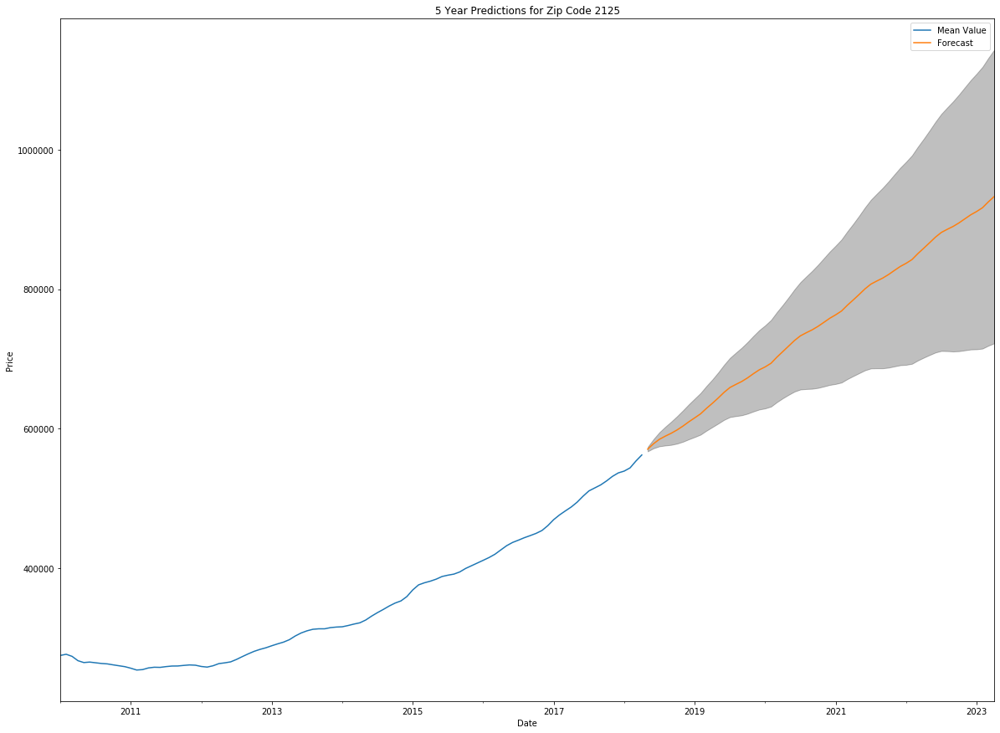

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2844.287996850524
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2455.764171558979
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2065.3423242123486
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1782.6641087343928
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1963.7799283325849
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1895.1190411522423
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1699.9318654061972
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1669.913451329104
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2747.600948943109
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2398.635608431052
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 1970.5165345113937
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1706.7064930678362
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2445.505596639159
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2391.975476899777

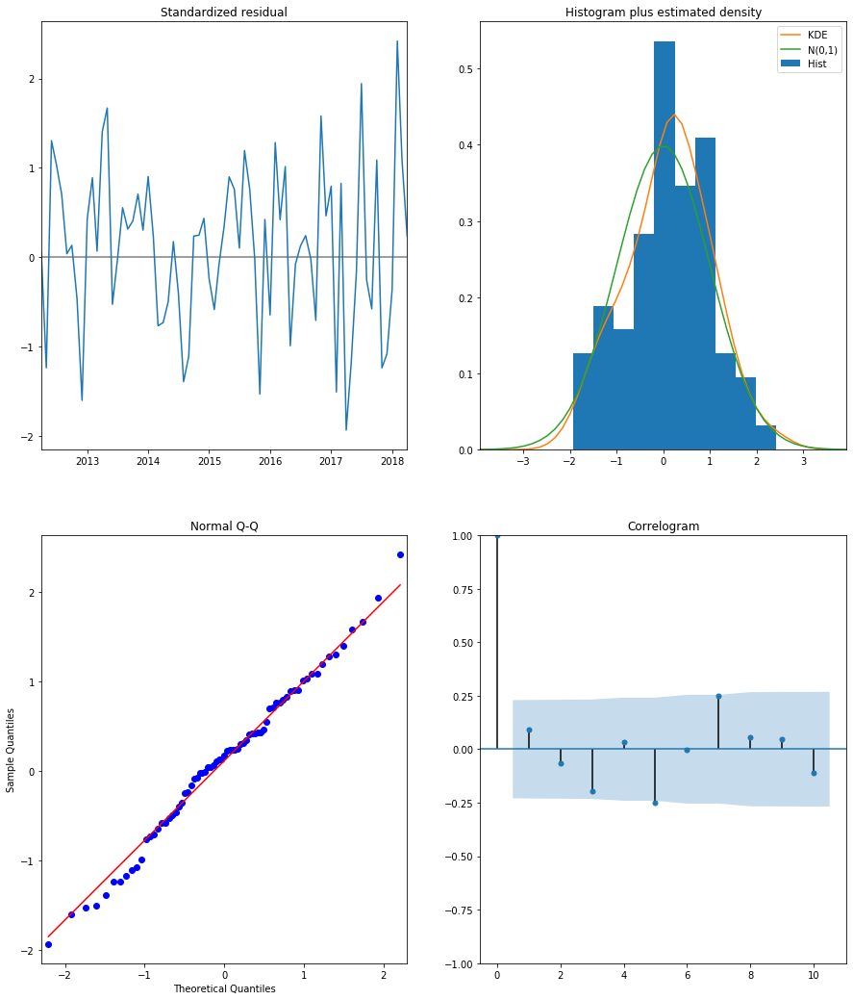

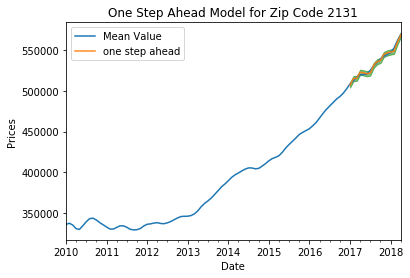

The Mean Squared Error of our forecasts is 2020.2783


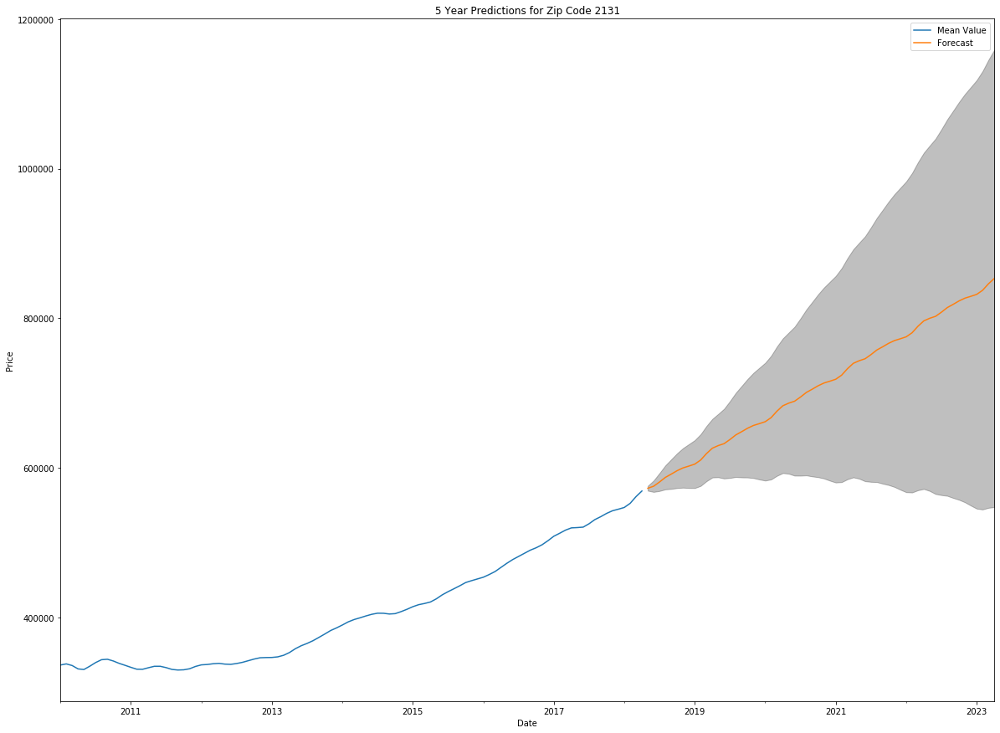

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2865.1693635644992
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2472.18115188568
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2081.153314788403
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1795.251287793727
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2006.1197761922836
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1972.1567245347187
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1768.1775777358923
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1747.399589955722
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2768.1467298164653
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2416.498782777421
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 1984.4670170929646
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1720.0100605628513
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2463.96500226479
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2410.0286563130353


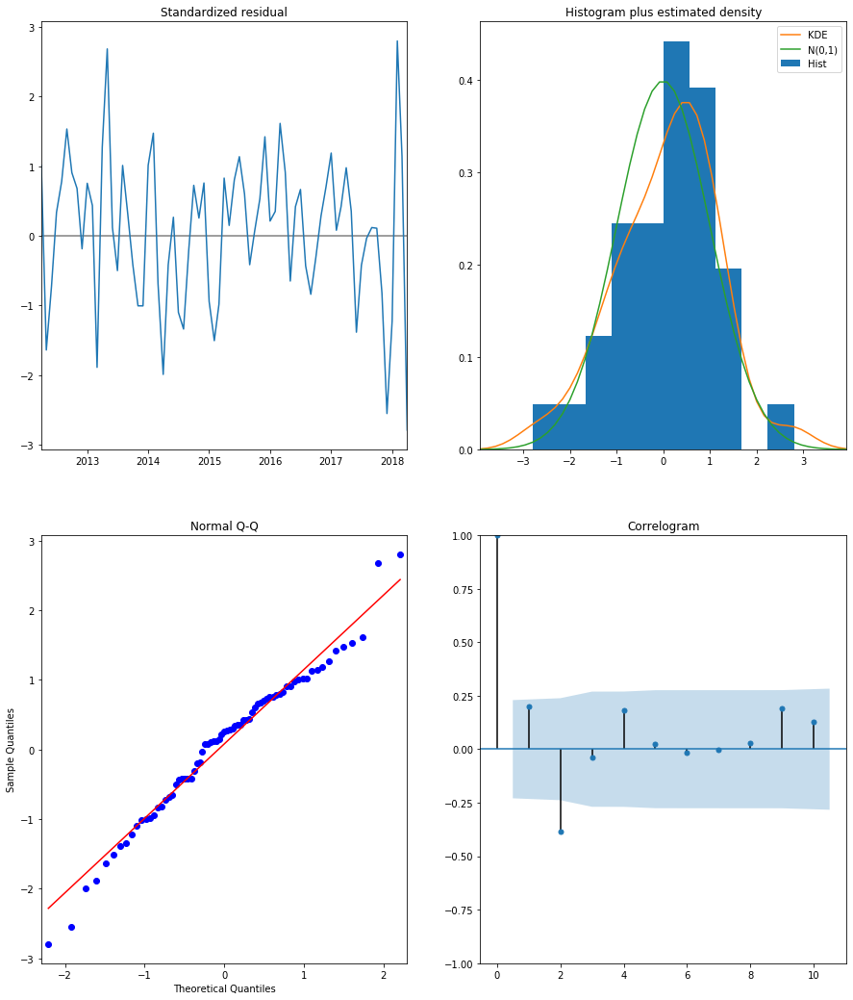

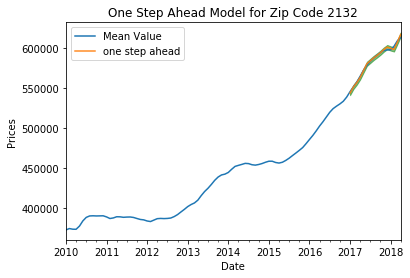

The Mean Squared Error of our forecasts is 1900.4552


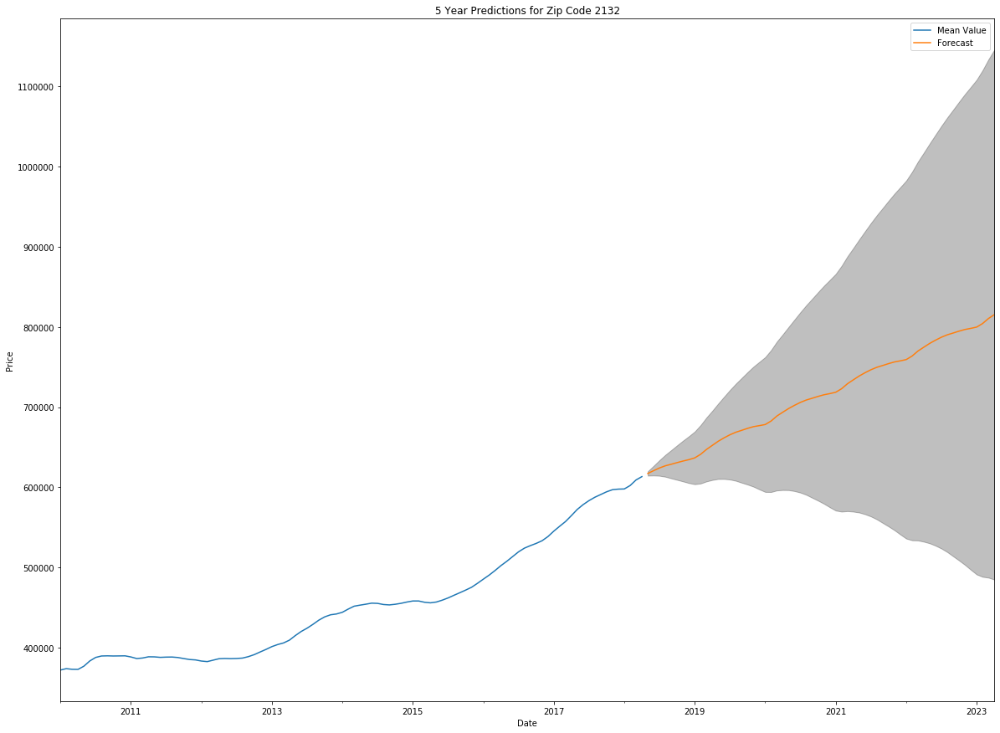

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2793.6512233180147
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2418.3299736499794
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2118.1829645203343
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1826.9523336783463
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2008.12348062805
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1951.5693812024012
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1786.626242380165
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1743.030493409804
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2697.68810414099
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2355.579230422488
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2040.6322361379732
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1751.1210724768089
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2401.4088717723466
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2348.8442645538457

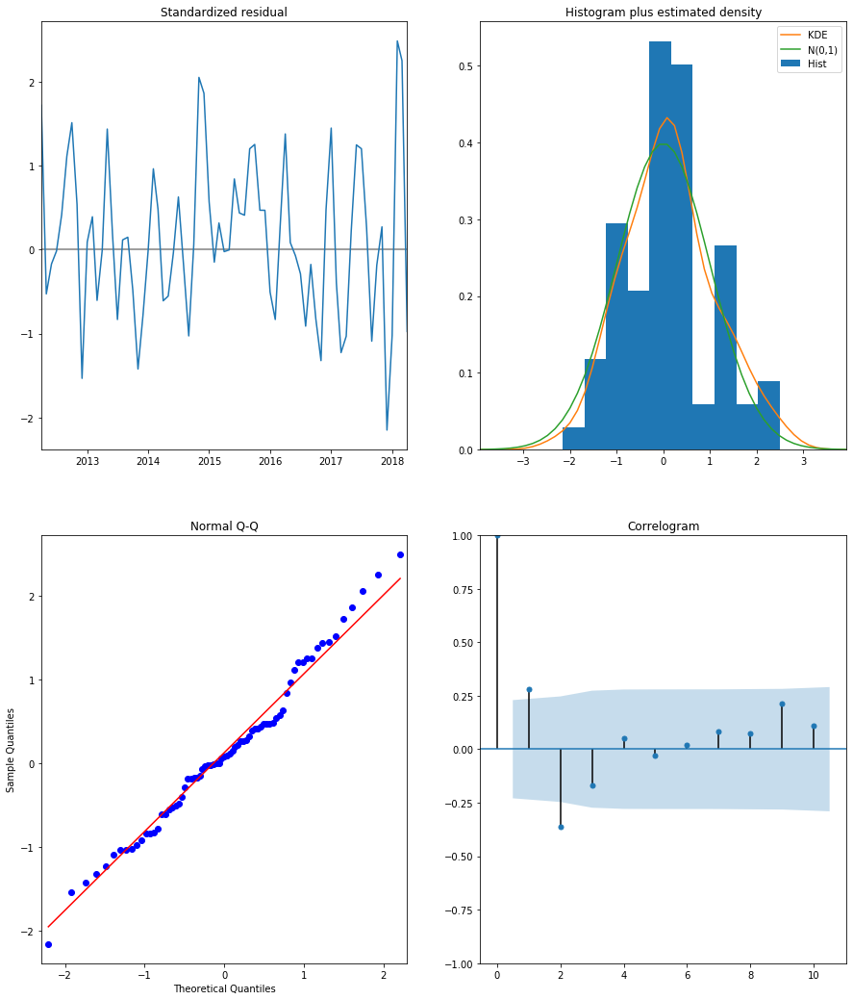

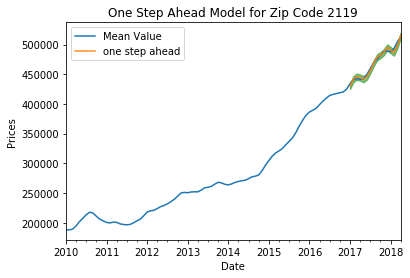

The Mean Squared Error of our forecasts is 3616.0427


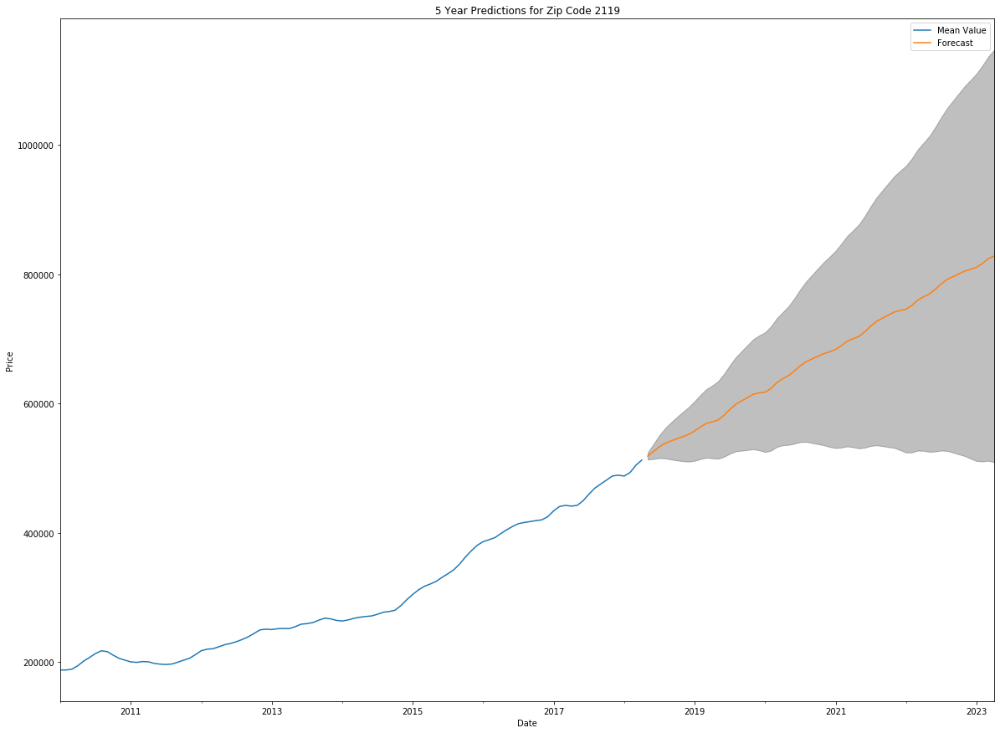

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2893.47518291517
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2503.8497941610876
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2176.6007381710633
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1879.759223315467
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2096.4573480773206
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1997.2886167921822
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1851.6803919024094
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1808.5710400438963
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2796.374130137428
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2441.882324852448
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2100.9352719612166
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1801.4480019278972
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2489.615856955317
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2434.976154833182

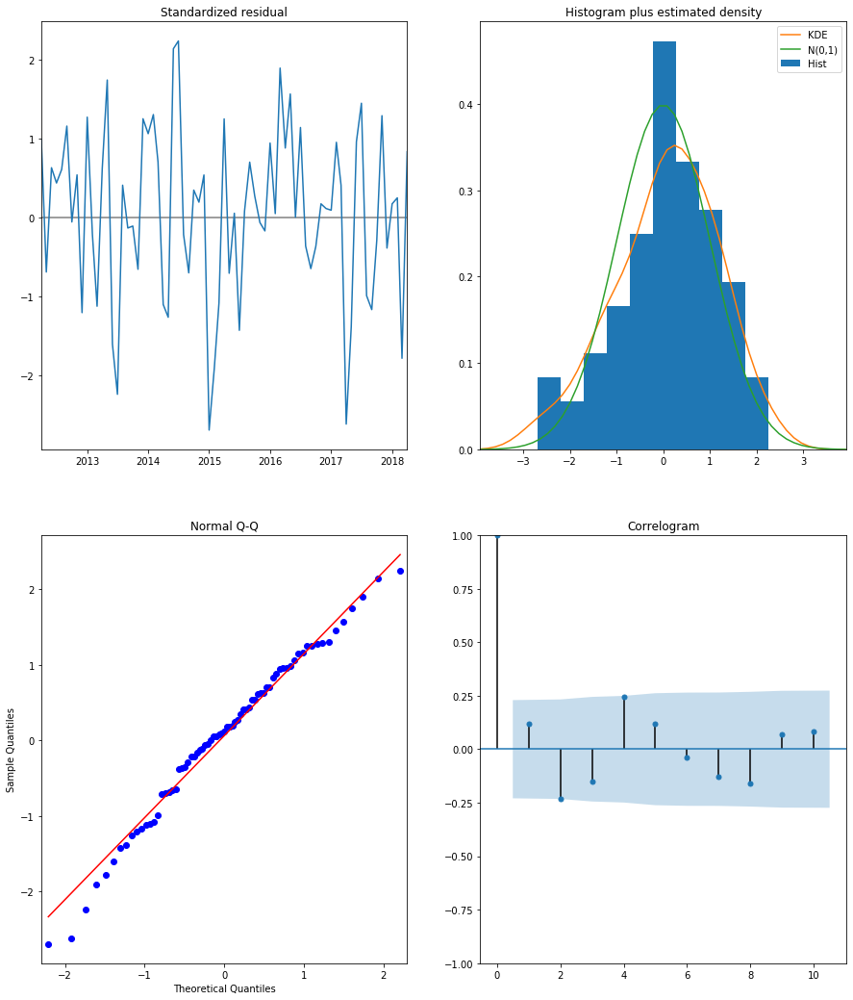

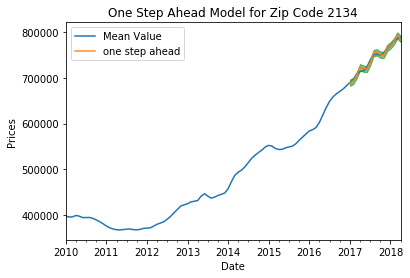

The Mean Squared Error of our forecasts is 4150.7062


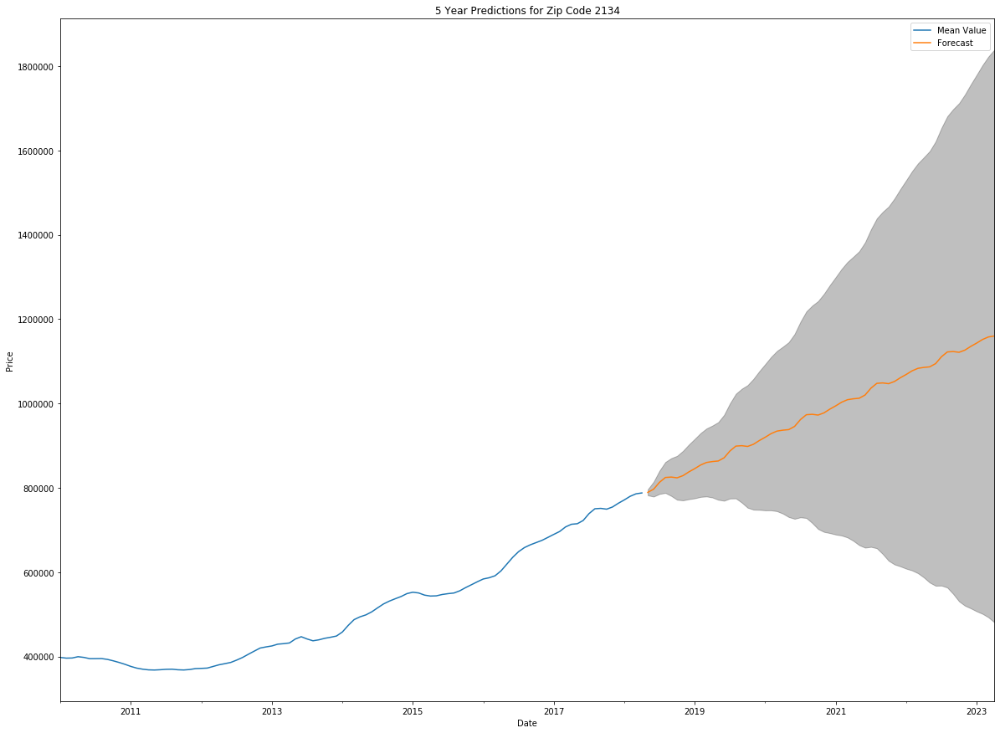

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2781.1561220484587
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2405.5880670511997
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2106.176484816932
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1815.5352677646893
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2039.9501520600666
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1955.8344289638121
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1803.3352370905645
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1743.5993034389514
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2685.306798165247
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2344.4250327148957
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2029.920099602575
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1741.0812648095168
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2390.0936405616058
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2337.671815566

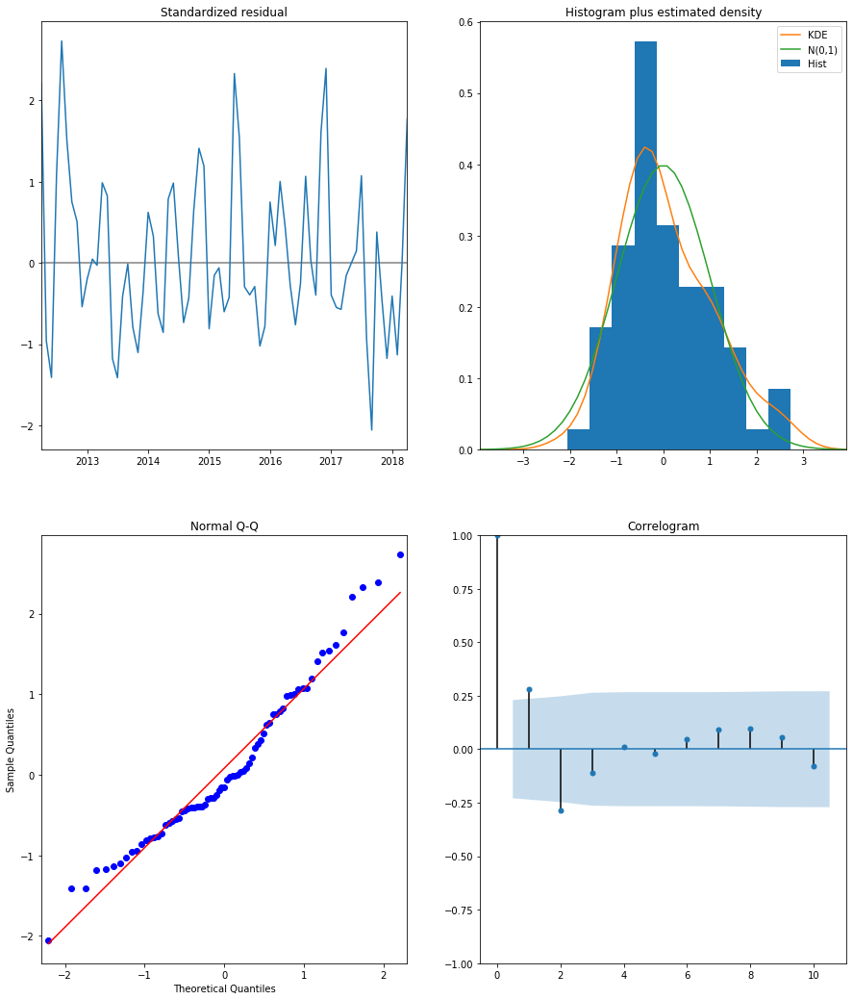

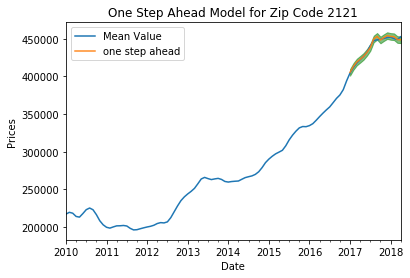

The Mean Squared Error of our forecasts is 2076.1026


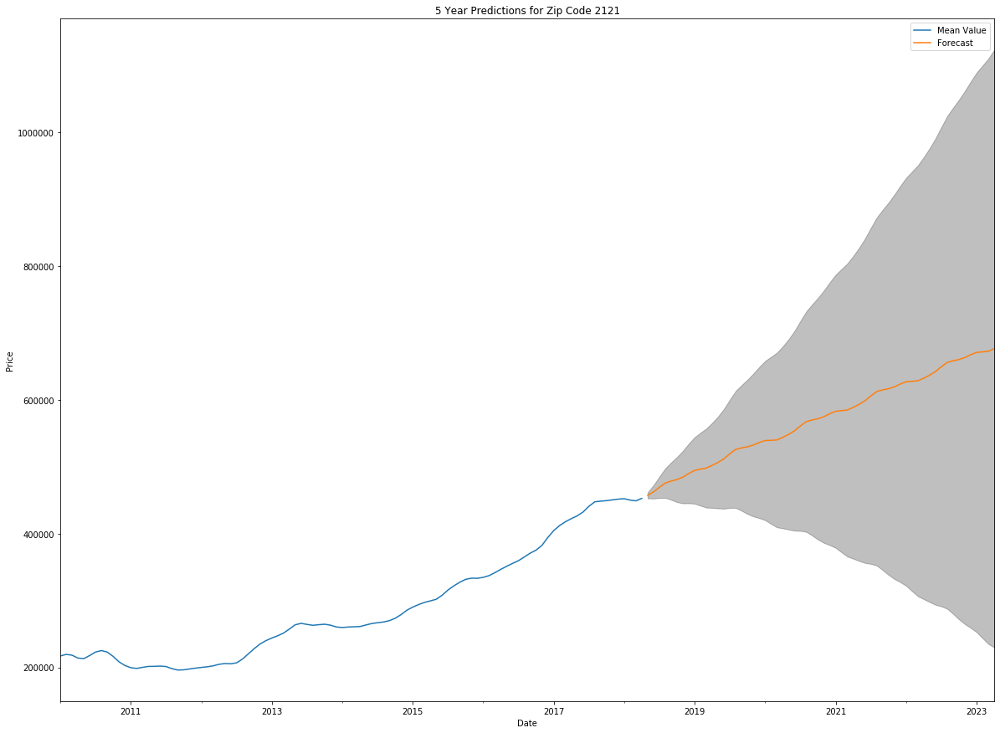

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2824.8354560482676
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2440.7759174448993
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2085.7796213274446
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1799.7073141173476
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2010.042787719045
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1897.2929672077937
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1759.6486487519057
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1708.8144293312275
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2728.3215147772003
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2381.9147764078416
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2012.5936406906044
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1724.0067563654918
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2428.3210354566454
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2375.0970737

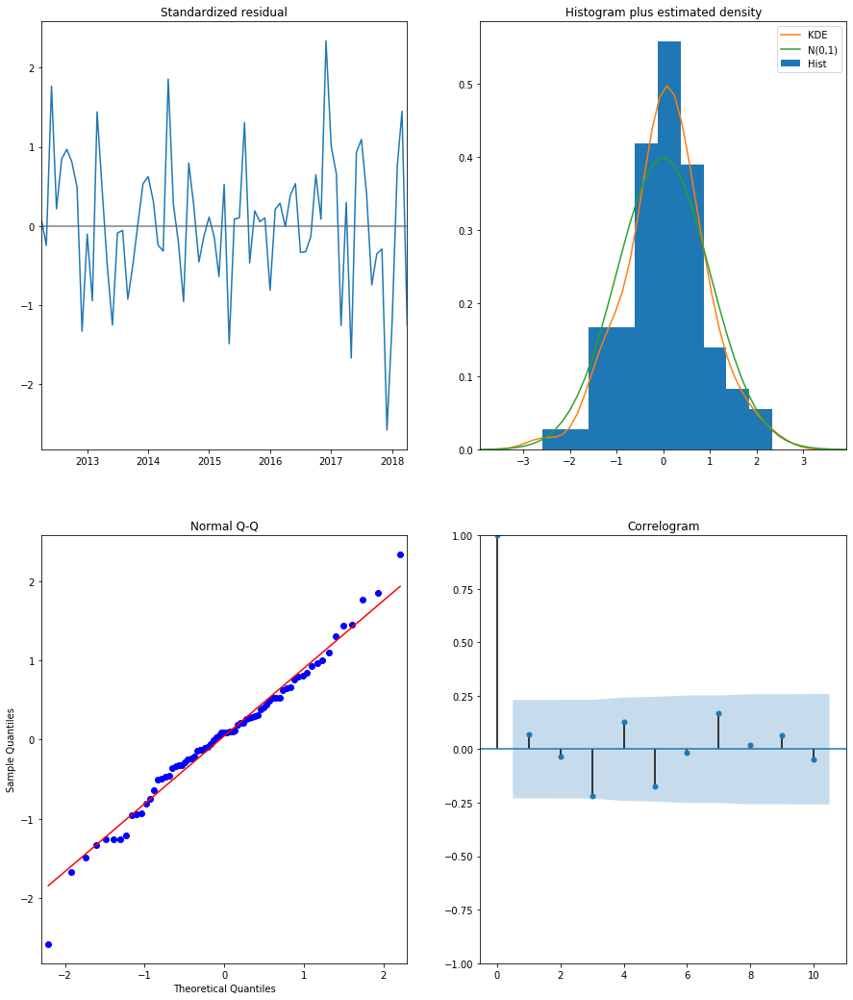

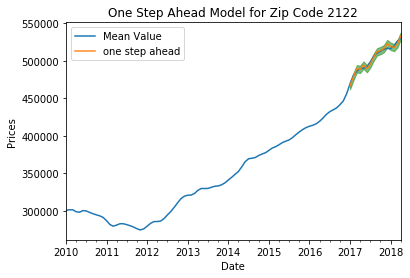

The Mean Squared Error of our forecasts is 2911.1337


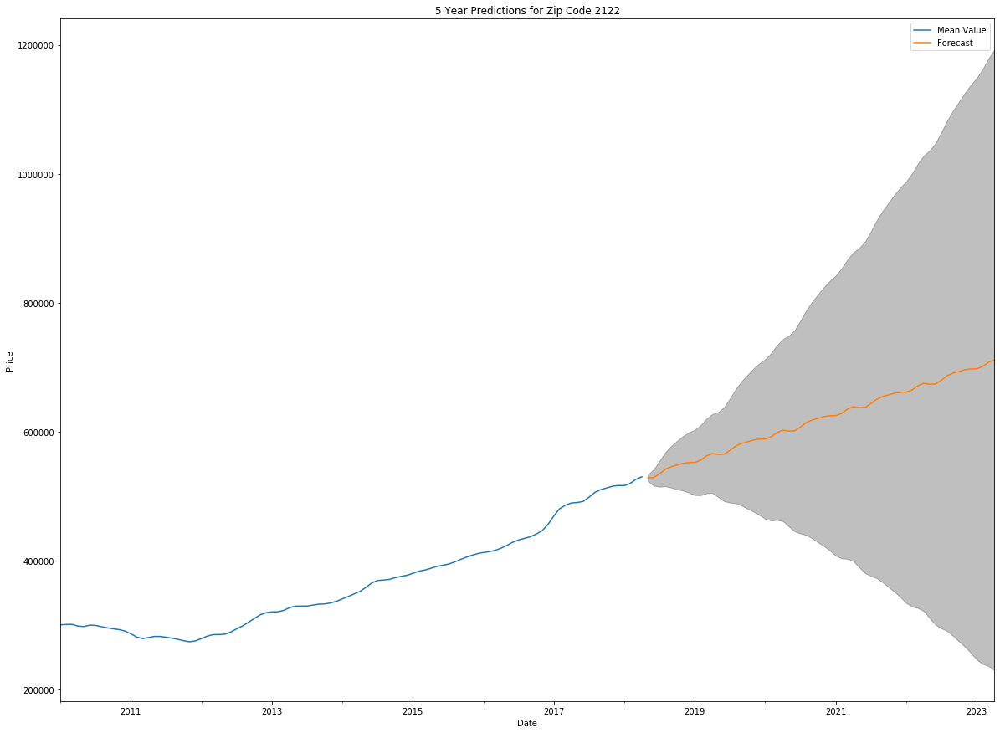

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2767.914594184359
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2390.446179517044
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2041.0626111322779
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1757.4867234365765
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1909.5370860879682
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1880.9719994143632
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1695.95697027753
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1677.225264977847
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2672.1963577386605
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2332.6813092996863
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 1967.706793346393
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1684.0014043848173
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2378.0025524432594
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2326.025048439092

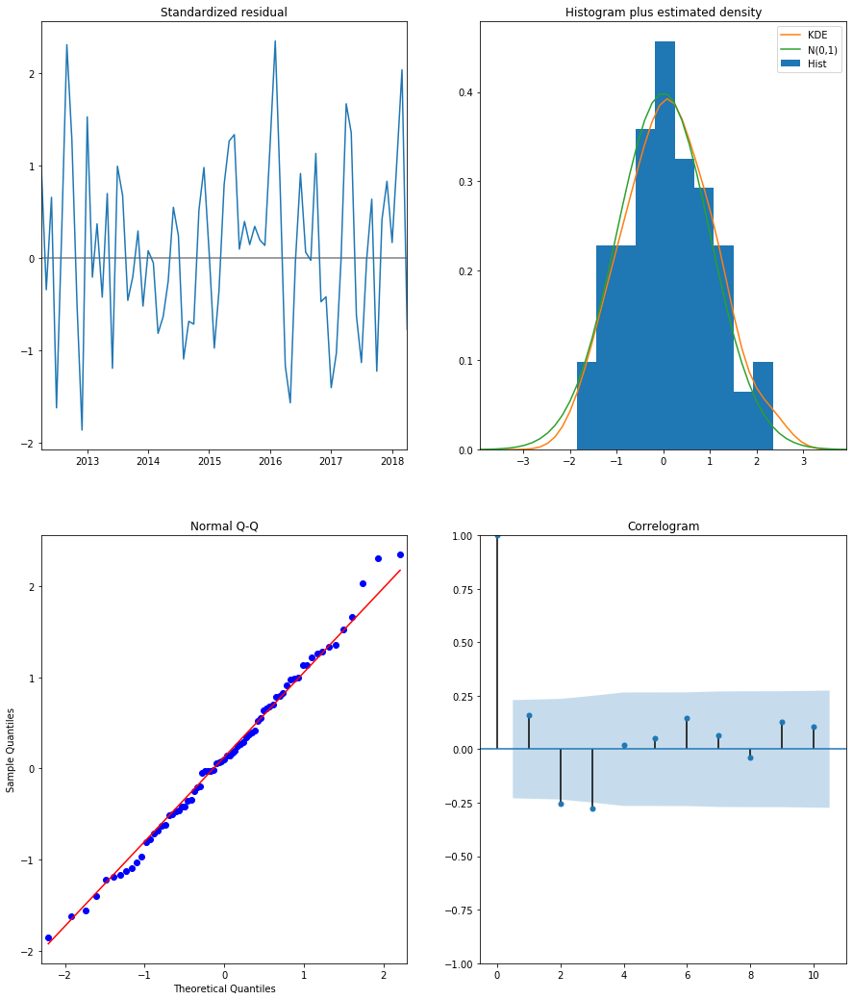

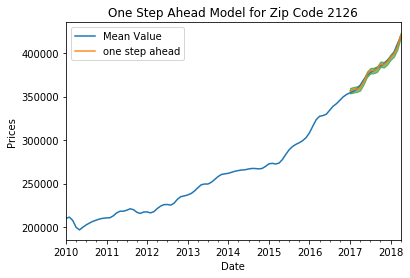

The Mean Squared Error of our forecasts is 1805.9671


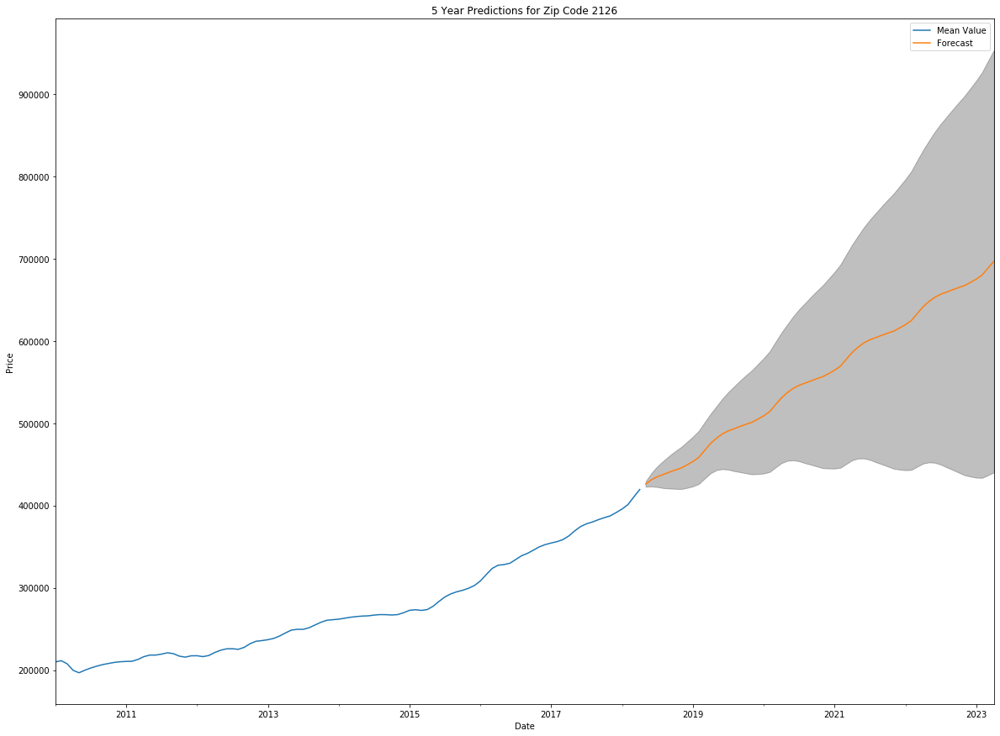

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2869.591756721221
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2483.3855709947147
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2172.8222125686916
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1876.8387847827062
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2096.360086126601
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 2049.611508544825
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1867.006672869658
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1821.5972894894537
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2772.629930112731
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2421.1506414384307
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2094.116194976845
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1797.6554318233805
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2468.532110896711
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2414.4315174414537

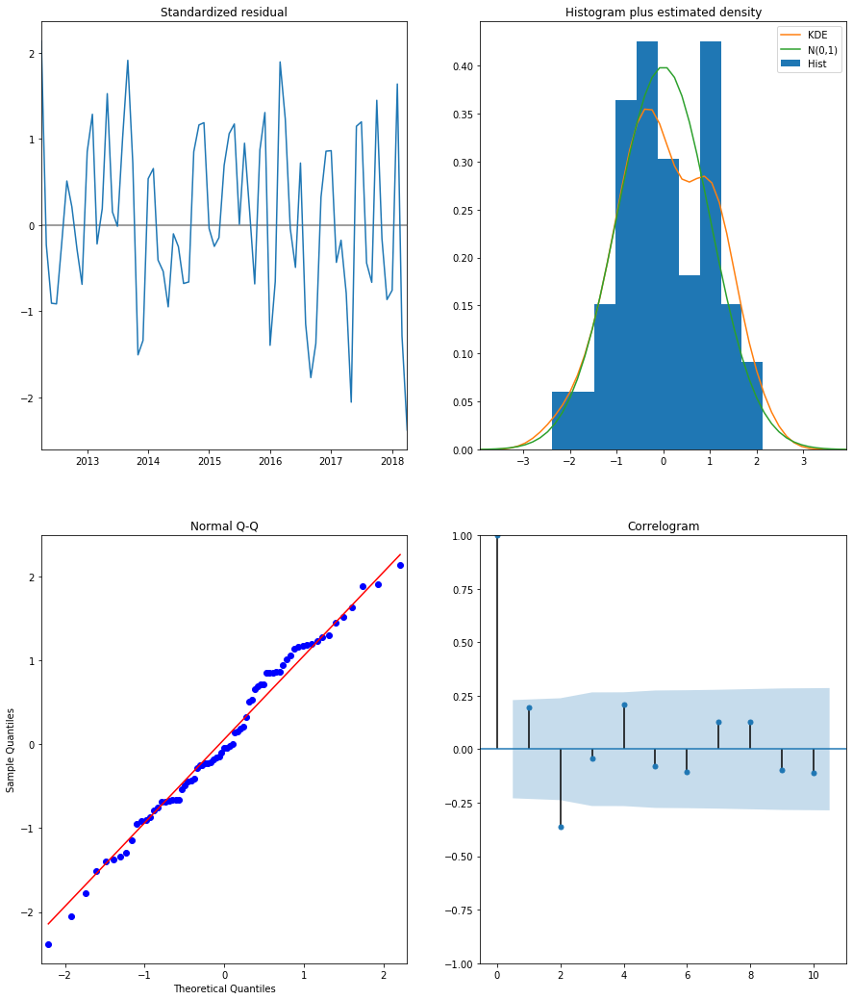

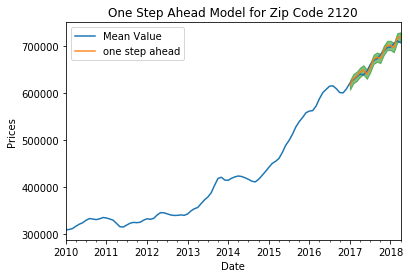

The Mean Squared Error of our forecasts is 6090.7795


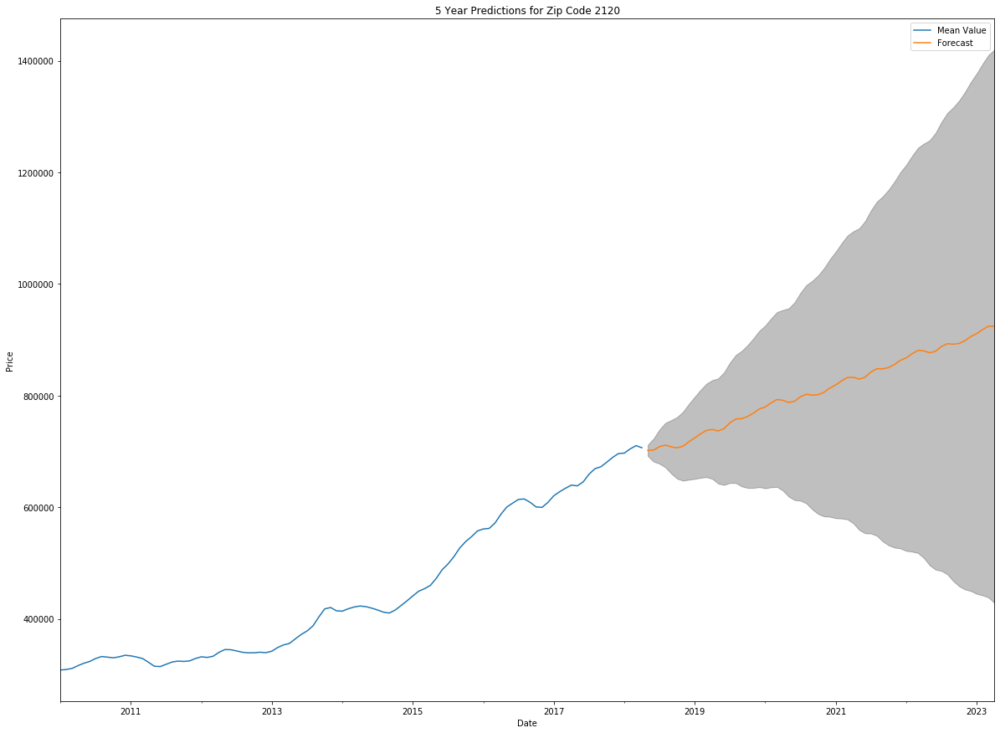

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2833.1209949302324
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2448.1754713751275
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2101.802569535841
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1816.1012378800988
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2001.0295126547173
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1941.2744810622567
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1742.6820496534096
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1714.6200341612468
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2736.657097143984
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2389.337509591064
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2028.2651761262255
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1738.0259470816452
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2435.87678642449
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2382.54271087064

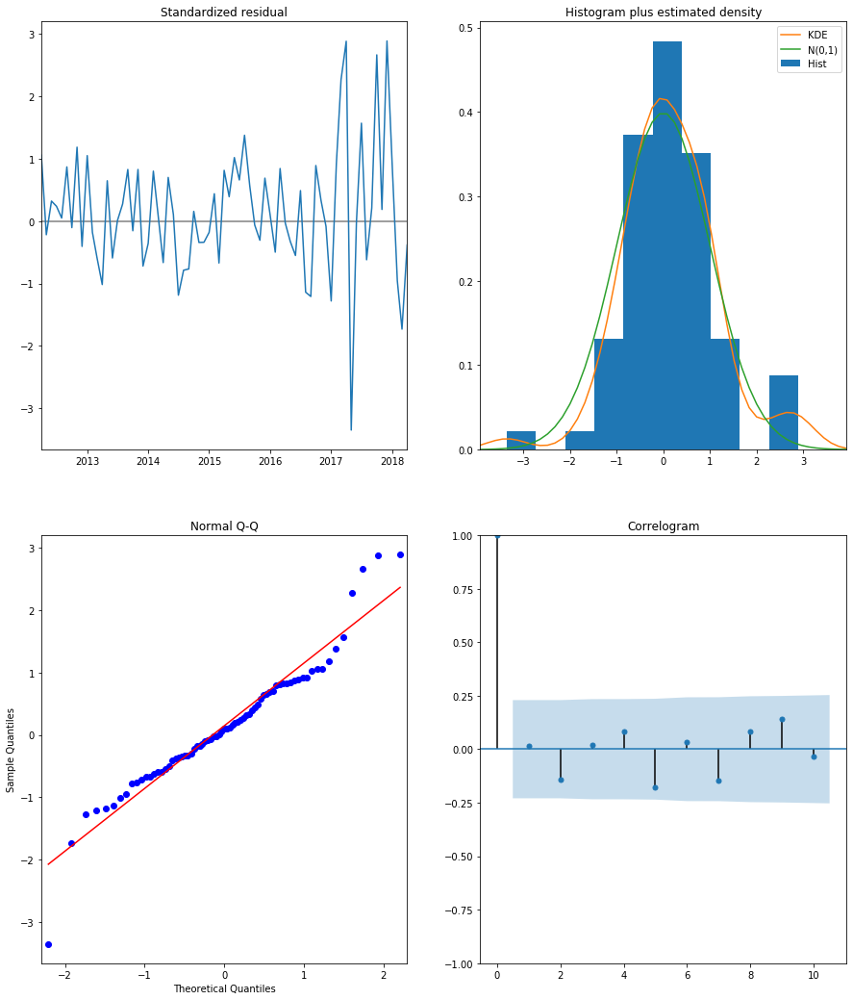

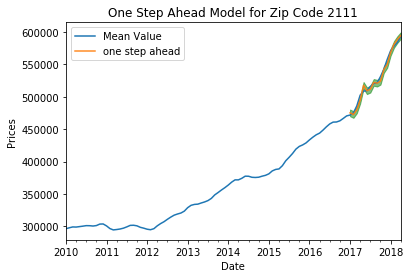

The Mean Squared Error of our forecasts is 4714.251


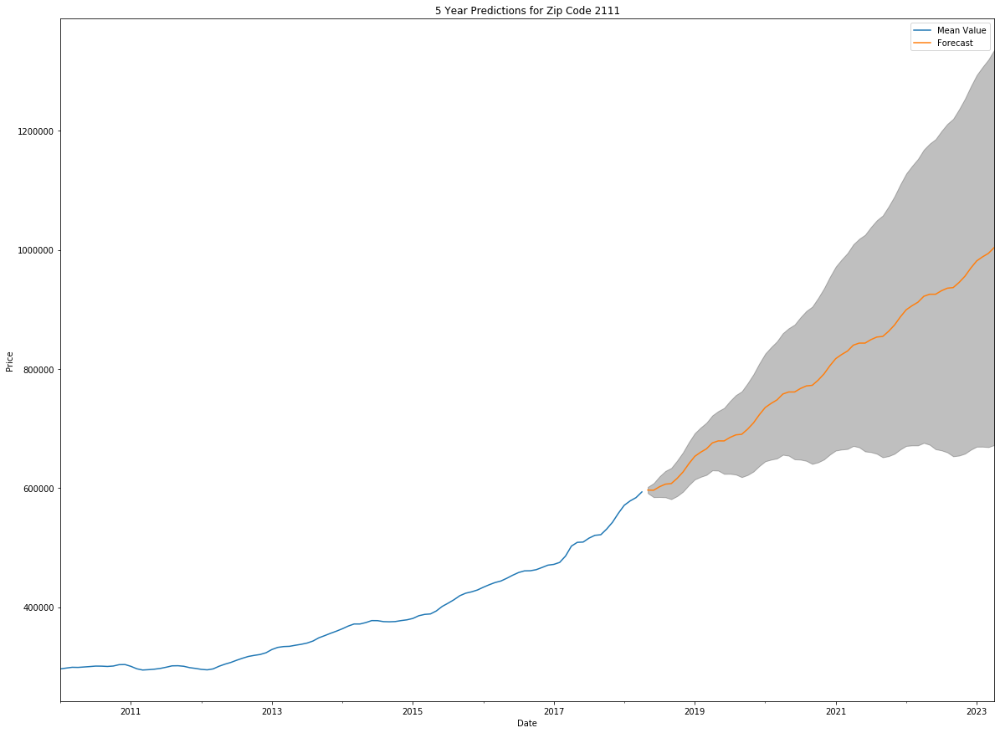

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2884.5431557066354
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2491.555720756949
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2125.579618194696
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1839.1473281931765
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2009.4256226685895
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1968.0931606094716
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1757.359291218169
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1739.1940872943774
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2787.4224773485594
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2433.7914000409273
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2048.9153396646707
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1755.4812019708181
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2481.37562181206
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2427.04585524801

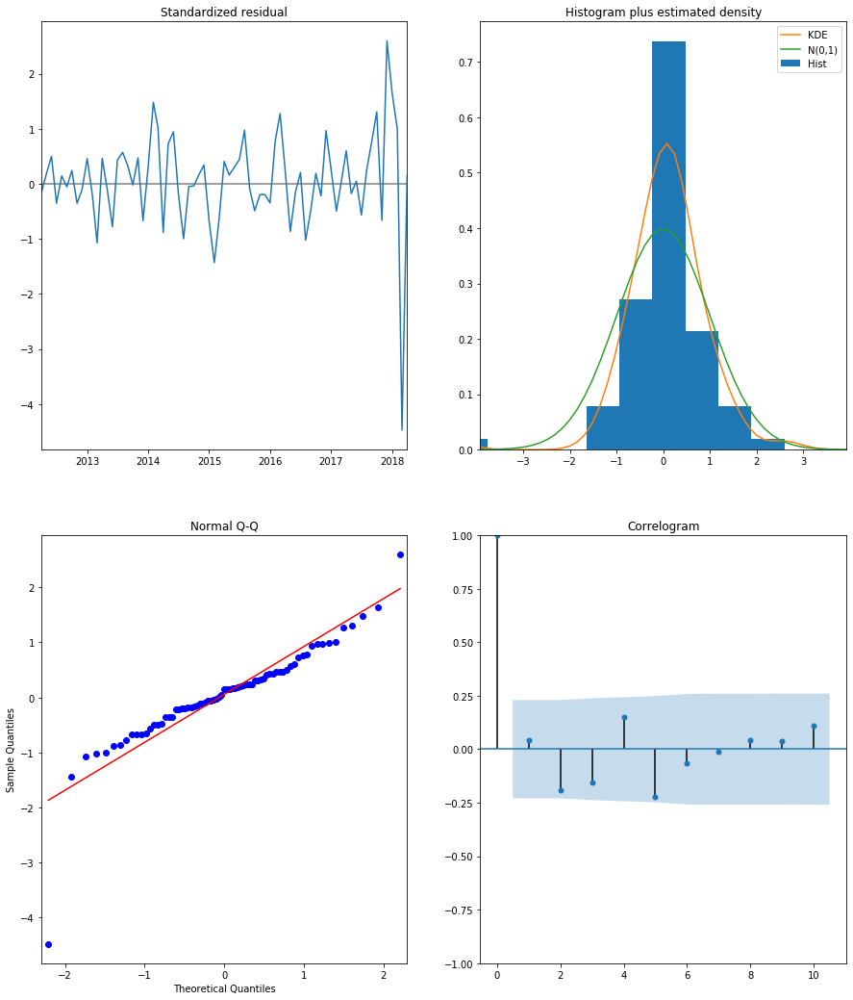

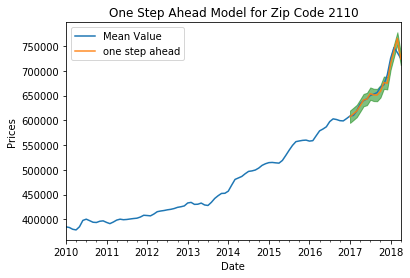

The Mean Squared Error of our forecasts is 9324.7435


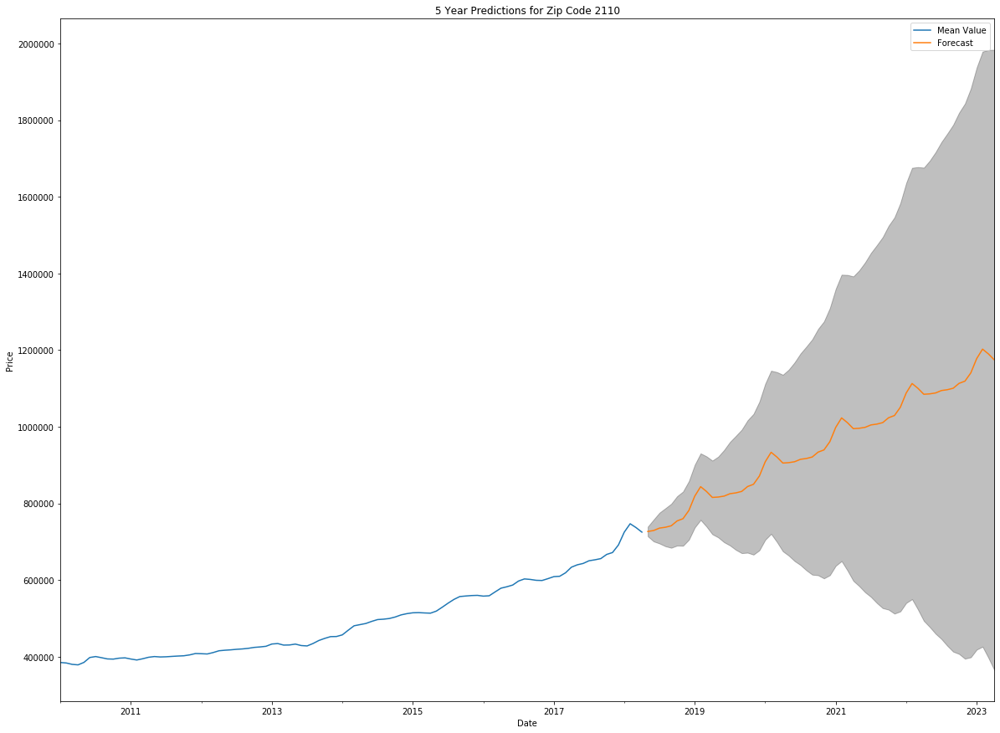

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 1430.6470839592112
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 1100.4705691209367
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 890.0182152958579
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 893.8406013743122
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1166.0320936982898
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 571.3472481879955
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 1370.3187174636917
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 993.5868491248812
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 839.6577639698642
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 1052.0508356458338
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 992.4356807846762
ARIMA (0, 0, 1) x (1, 1, 0, 12)12 : AIC Calculated = 571.2804301956572
ARIMA (0, 1, 0) x (0, 0, 0, 12)12 : AIC Calculated = 1046.682618978113
ARIMA (0, 1, 0) x (0, 0, 1, 12)12 : AIC Calculated = 762.525443435077
AR

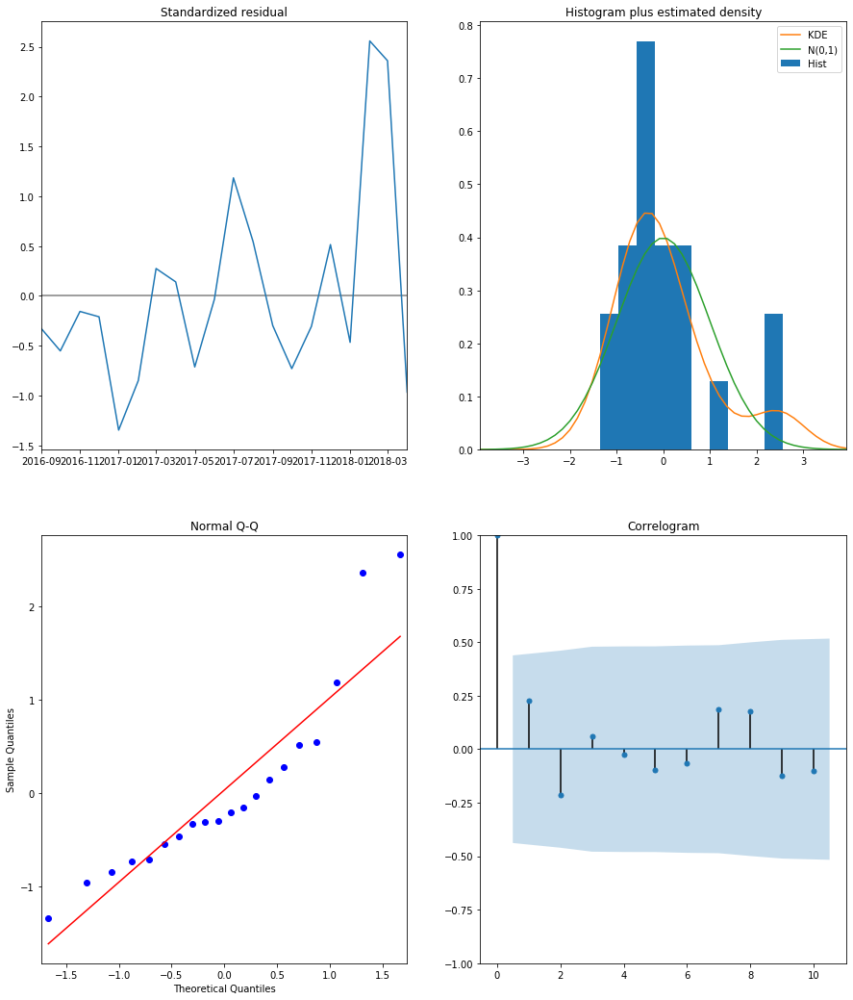

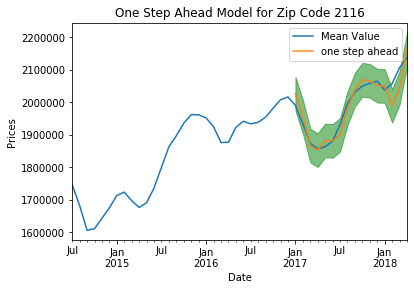

The Mean Squared Error of our forecasts is 28932.5751


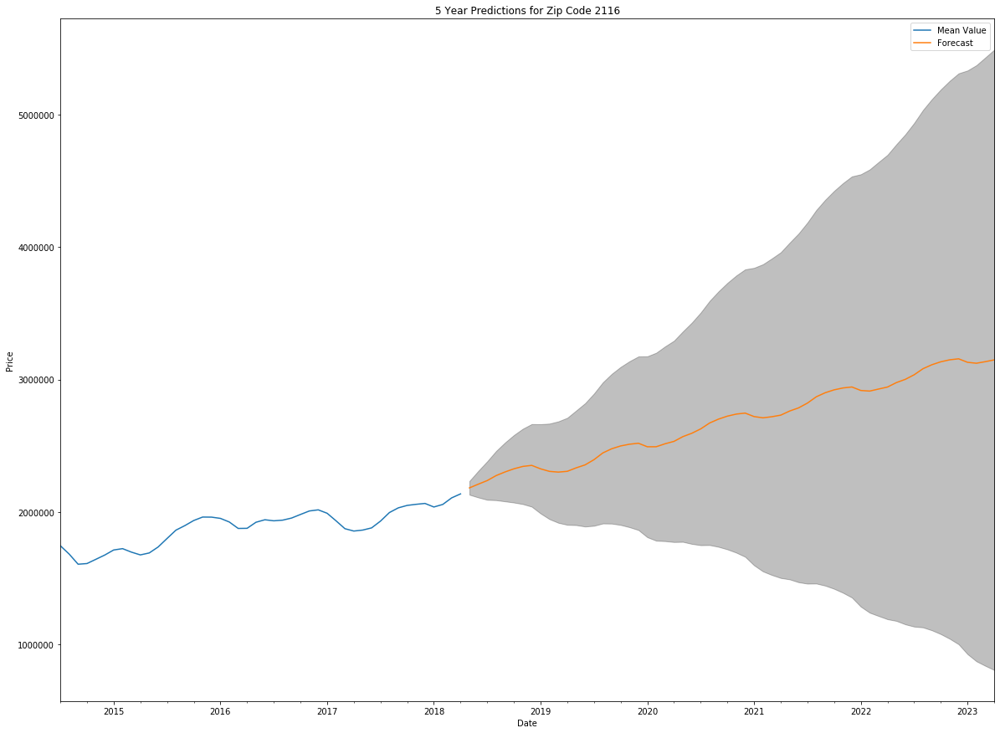

In [13]:
zip_dic = {}

for zip in list(boston['RegionName'].unique()):
        # Making a temporary dataframe with one zip code only and formatting it a little bit
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        
        # Iterate through to find the best pdq/pdqs combination
        ans = []
        for comb in pdq:
            for combs in pdqs:
                try:
                    mod = sm.tsa.statespace.SARIMAX(temp_df,
                                                    order = comb,
                                                    seasonal_order = combs,
                                                    enforce_stationarity = False,
                                                    enforce_intertibility = False)
                    output = mod.fit()
                    ans.append([comb, combs, output.aic])
                    print('ARIMA {} x {}12 : AIC Calculated = {}'.format(comb, combs, output.aic))
                except:
                    continue
        
        # Give us the combination that minimizes the AIC 
        ans_df = pd.DataFrame(ans, columns = ['pdq', 'pdqs', 'aic'])
        ans_df.loc[ans_df['aic'].idxmin()]
        
        # Store these numbers to use 
        mod_order = ans_df.loc[ans_df['aic'].idxmin()]['pdq']
        seasonal_mod_order = ans_df.loc[ans_df['aic'].idxmin()]['pdqs']
        
        # Create a model with optimal pdq/pdqs
        ARIMA_MODEL = sm.tsa.statespace.SARIMAX(temp_df,
                                        order = mod_order,
                                        seasonal_order = seasonal_mod_order,
                                        enforce_stationarity = False,
                                        enforce_invertibility = False)
        output = ARIMA_MODEL.fit()
        print(output.summary().tables[1])
        
        # Look at our residuals
        output.plot_diagnostics(figsize = (15, 18))
        plt.show()
        
        # Get one step ahead predictions using our model
        pred = output.get_prediction(start = pd.to_datetime('2017-01-01'), dynamic = False)
        pred_conf = pred.conf_int()
        
        # Plot one step ahead model
        #rcParams['figure.figsize'] = 20, 7

        ax = temp_df['2010':].plot(label = 'observed')
        pred.predicted_mean.plot(ax = ax, title = 'One Step Ahead Model for Zip Code {}'.format(zip), label = 'one step ahead', alpha = .9)

        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color = 'g', alpha = .5)

        ax.set_xlabel('Date')
        ax.set_ylabel('Prices')
        plt.legend()

        plt.show()
        
        # Calculate RMSE
        zip_forecasted = pred.predicted_mean
        zip_truth = temp_df['2017-01-01':]

        rmse = np.sqrt(((zip_forecasted - zip_truth['Mean Value']) ** 2).mean())
        print('The Mean Squared Error of our forecasts is {}'.format(round(rmse, 4)))
        
        
        # Making future predictions
        prediction = output.get_forecast(steps=60)
        pred_conf = prediction.conf_int()
        
        ax = temp_df.plot(label='observed', figsize=(20, 15))
        prediction.predicted_mean.plot(title = '5 Year Predictions for Zip Code {}'.format(zip), ax=ax, label='Forecast')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=0.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('Price')

        plt.legend()
        plt.show()

In [29]:
zip_dic[2135]['rmse:']

2997.074578946365

# Really just getting statistics/organizing some info for my presentation

In [30]:
for zip in list(boston['RegionName'].unique()):
    temp_df = boston[(boston.RegionName == zip)]
    temp_df.set_index('Month', inplace = True)
    temp_df = temp_df.drop(['RegionName'], axis = 1)
    zip_dic[zip]['last_known_price'] = temp_df['Mean Value'][-1]

In [31]:
zip_dic

{2135: {'rmse:': 2997.074578946365,
  'predictions:': [739776.1513826628,
   744013.2962047664,
   751179.0943214758,
   756222.8264035606,
   758177.4939628114,
   760994.0764375144,
   767064.2764223893,
   775742.9866510096,
   783013.5778927357,
   789116.0421829247,
   794549.103289418,
   796875.8396800658,
   798371.2874113395,
   802651.0116322782,
   810835.8993461016,
   816866.6148899856,
   818879.0376105926,
   821374.6395811304,
   827422.7488241442,
   836004.4816500379,
   842506.3357693743,
   848537.8358385562,
   854491.8698745514,
   856915.9360680738,
   858511.2256345602,
   862776.0218638588,
   870599.5086116082,
   876280.1738724478,
   878272.1621436395,
   880881.6677960028,
   886937.6382311657,
   895553.7901449228,
   902328.3634904595,
   908385.0454882834,
   914154.2703811283,
   916543.8124081212,
   918103.6855583267,
   922373.7790096226,
   930325.4731304981,
   936130.3187908632,
   938129.5566176437,
   940698.6554647334,
   946751.8373704781,
   

In [37]:
for zip in zip_dic:
    zip_dic[zip]['1 yr ROI:'] = (zip_dic[zip]['predictions:'][11] - zip_dic[zip]['last_known_price'])/zip_dic[zip]['last_known_price']

In [39]:
for zip in zip_dic:
    zip_dic[zip]['3 yr ROI:'] = (zip_dic[zip]['predictions:'][35] - zip_dic[zip]['last_known_price'])/zip_dic[zip]['last_known_price']
    zip_dic[zip]['5 yr ROI:'] = (zip_dic[zip]['predictions:'][59] - zip_dic[zip]['last_known_price'])/zip_dic[zip]['last_known_price']

In [41]:
one_yr = {}
three_yr = {}
five_yr = {}

for zip in zip_dic:
    one_yr[zip] = zip_dic[zip]['1 yr ROI:']
    three_yr[zip] = zip_dic[zip]['3 yr ROI:']
    five_yr[zip] = zip_dic[zip]['5 yr ROI:']

    

In [57]:
sorted_one_yr = {k: v for k, v in sorted(one_yr.items(), key=lambda item: item[1])}
sorted_three_yr = {k: v for k, v in sorted(three_yr.items(), key=lambda item: item[1])}
sorted_five_yr = {k: v for k, v in sorted(five_yr.items(), key=lambda item: item[1])}

In [68]:
sorted_one_yr

{2120: 0.04634599033110009,
 2132: 0.06360020948812149,
 2122: 0.06802774658899374,
 2116: 0.07975329261305077,
 2135: 0.0797775605420945,
 2136: 0.08173394398262046,
 2134: 0.09441440563694176,
 2130: 0.10066648708153378,
 2131: 0.10068151009921344,
 2128: 0.10698749281221033,
 2121: 0.1093033519374908,
 2119: 0.11517698263851406,
 2110: 0.12495738594759669,
 2127: 0.12716746423698957,
 2125: 0.13152489465087094,
 2126: 0.1333444995812913,
 2111: 0.13864337567933355,
 2124: 0.1570827200189889}

In [66]:
top_5 = [2124, 2111, 2126, 2125, 2127]

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2819.4400621006603
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2436.2227159654008
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2082.8722526552333
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1797.510942595117
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1969.6210259154955
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1861.9764979206425
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1730.5843922956
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1662.3639830832426
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2723.090145951662
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2377.449988304478
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2010.3262001238559
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1722.4589281875494
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2423.664097573204
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2370.5916904951214

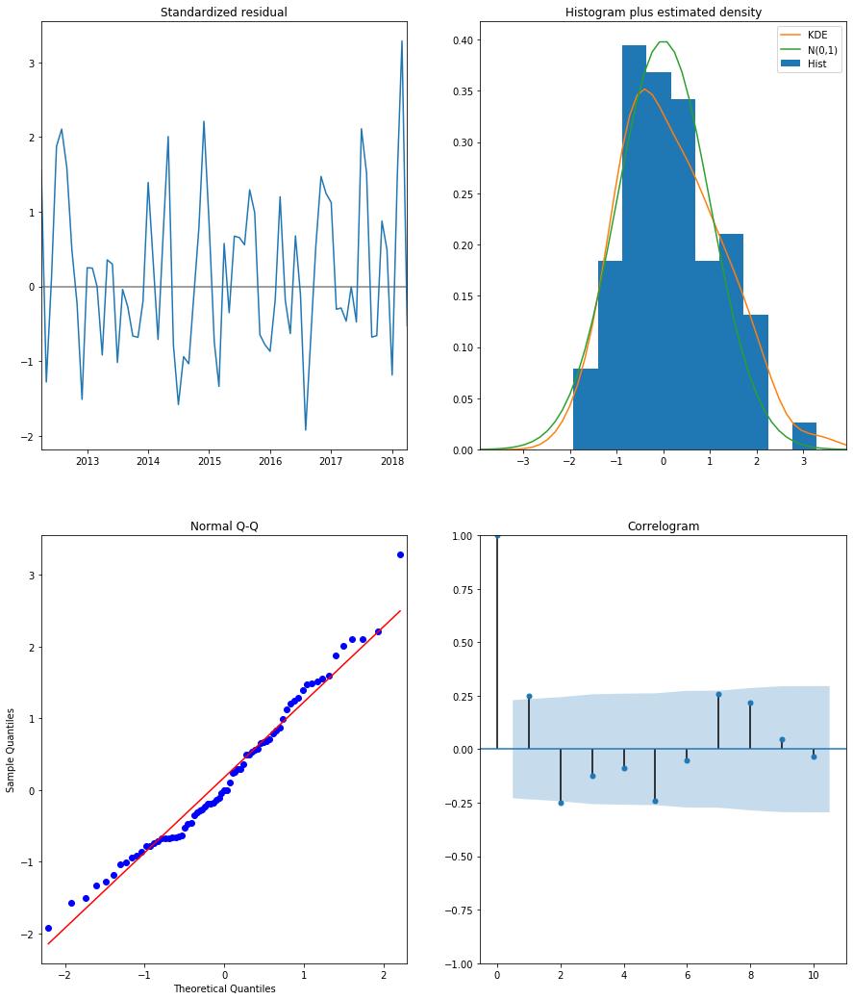

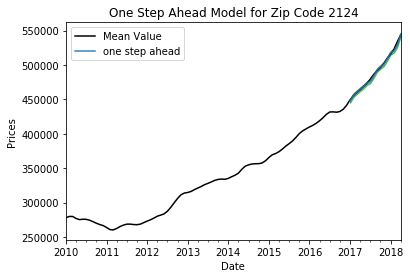

The Mean Squared Error of our forecasts is 1881.6776


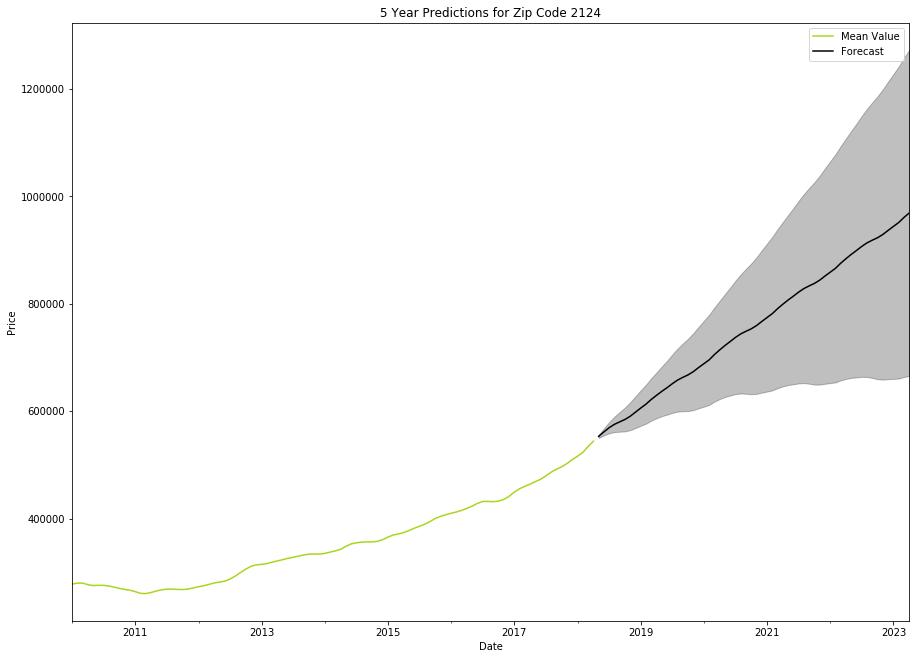

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2833.1209949302324
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2448.1754713751275
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2101.802569535841
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1816.1012378800988
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2001.0295126547173
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1941.2744810622567
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1742.6820496534096
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1714.6200341612468
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2736.657097143984
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2389.337509591064
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2028.2651761262255
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1738.0259470816452
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2435.87678642449
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2382.54271087064

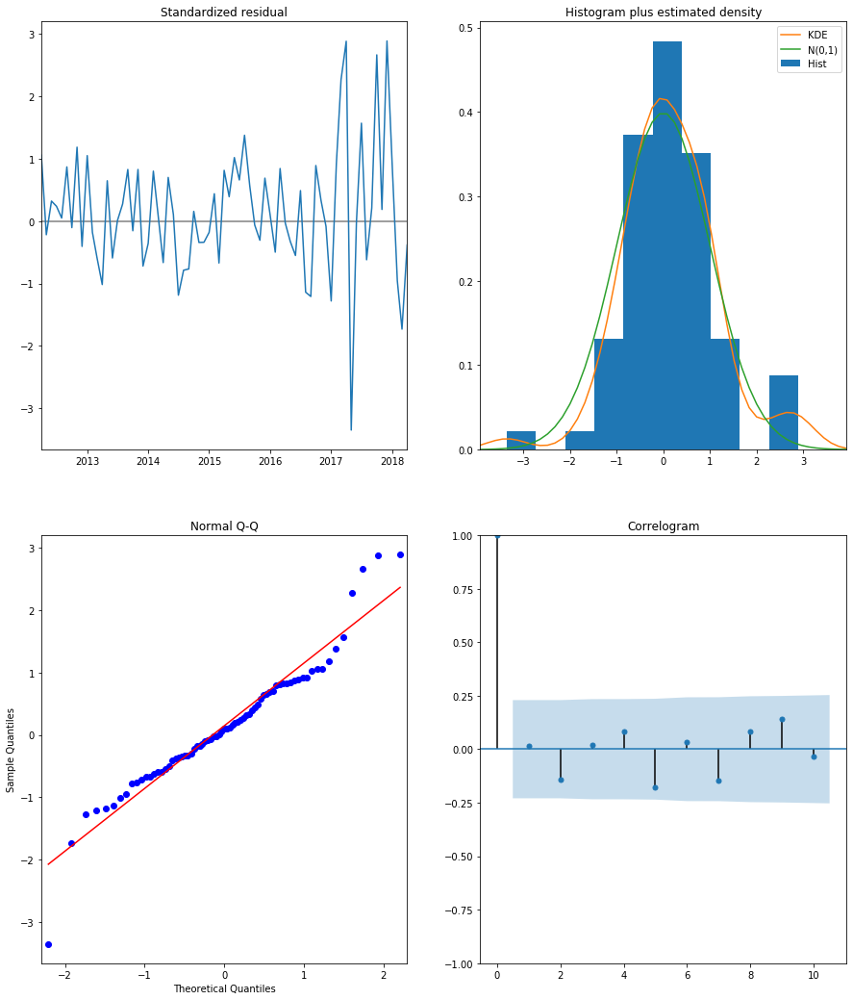

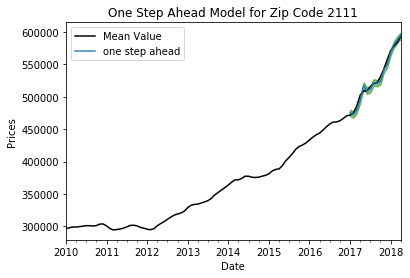

The Mean Squared Error of our forecasts is 4714.251


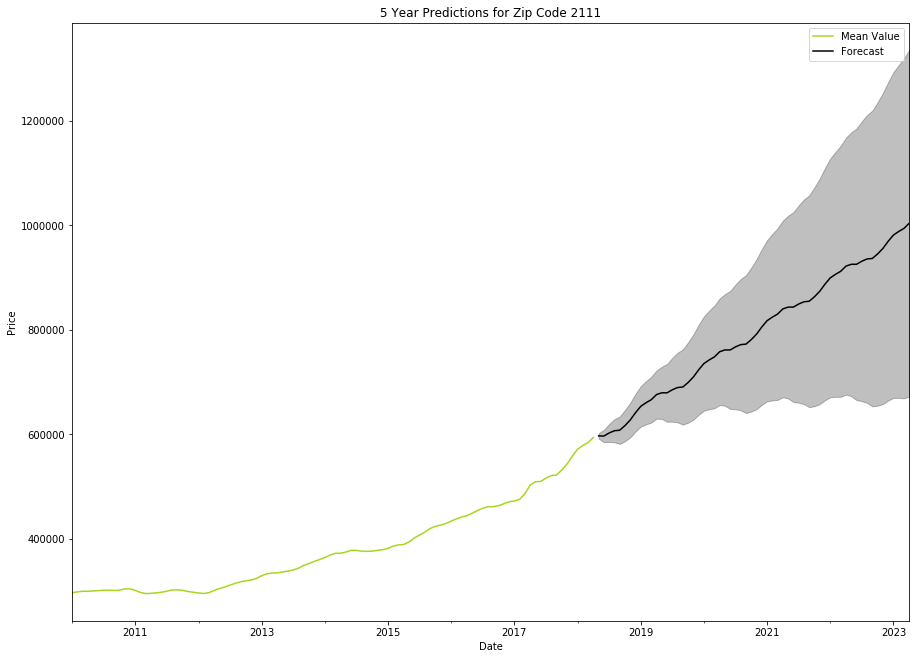

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2767.914594184359
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2390.446179517044
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2041.0626111322779
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1757.4867234365765
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1909.5370860879682
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1880.9719994143632
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1695.95697027753
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1677.225264977847
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2672.1963577386605
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2332.6813092996863
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 1967.706793346393
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1684.0014043848173
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2378.0025524432594
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2326.025048439092

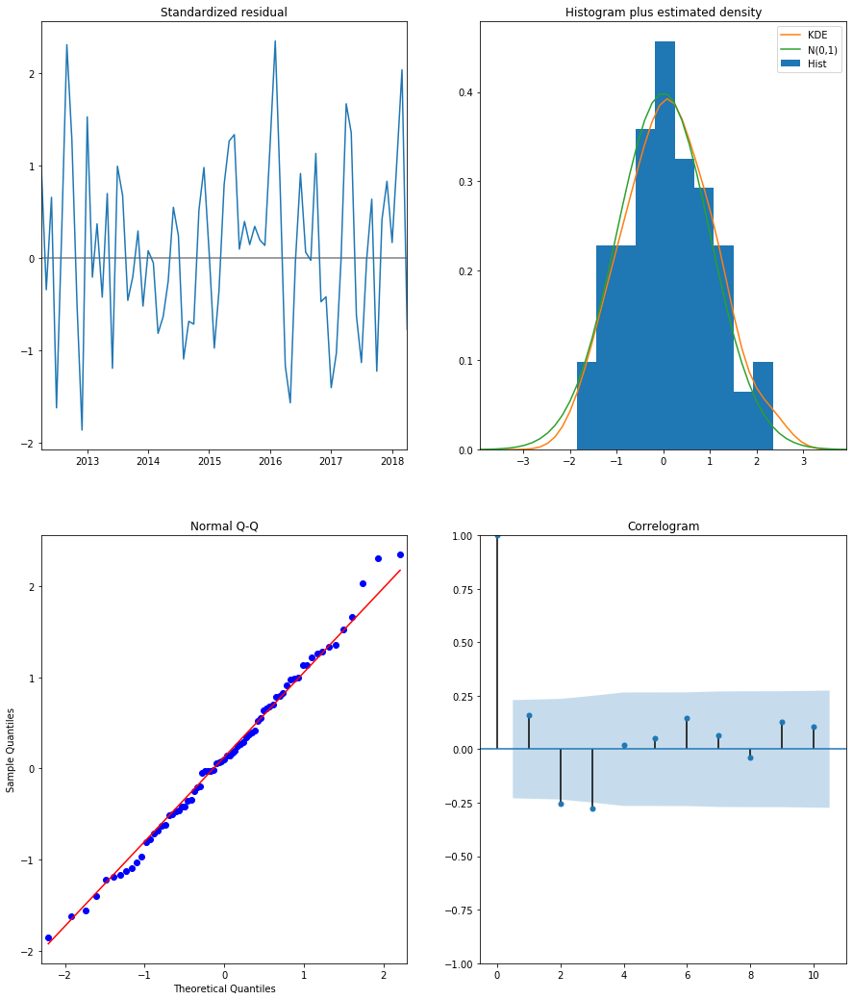

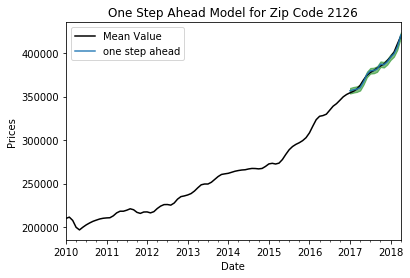

The Mean Squared Error of our forecasts is 1805.9671


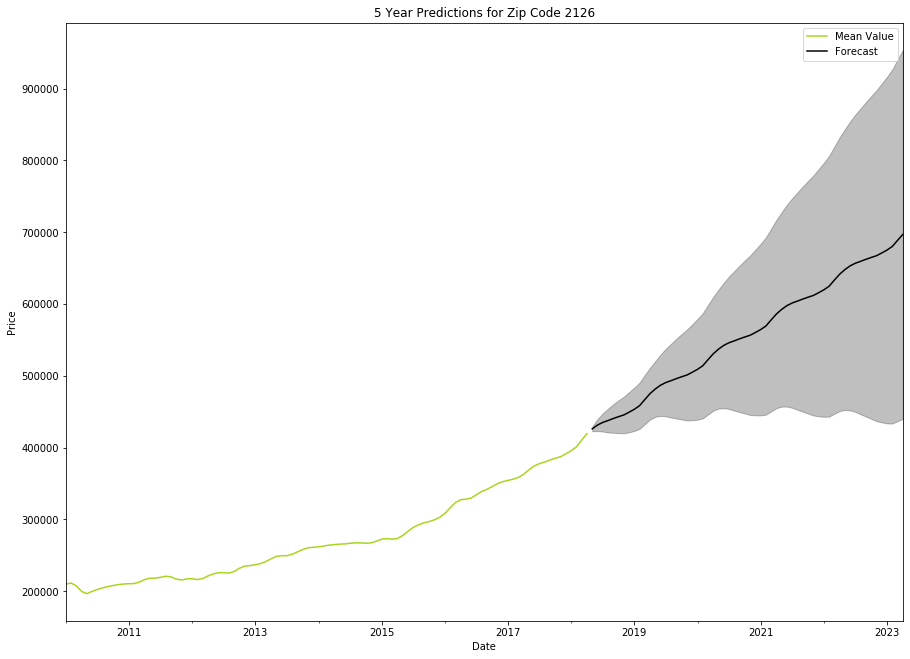

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2819.652233088339
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2438.288472179682
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2109.942176417458
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1818.9776609836044
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 1990.3831985860475
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 1910.1563102127484
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1714.2901053321941
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1670.2604536583854
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2723.3601163589983
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2377.7196906813942
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2035.8091491424977
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1743.3445362581356
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2423.9548786833934
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2370.853893611

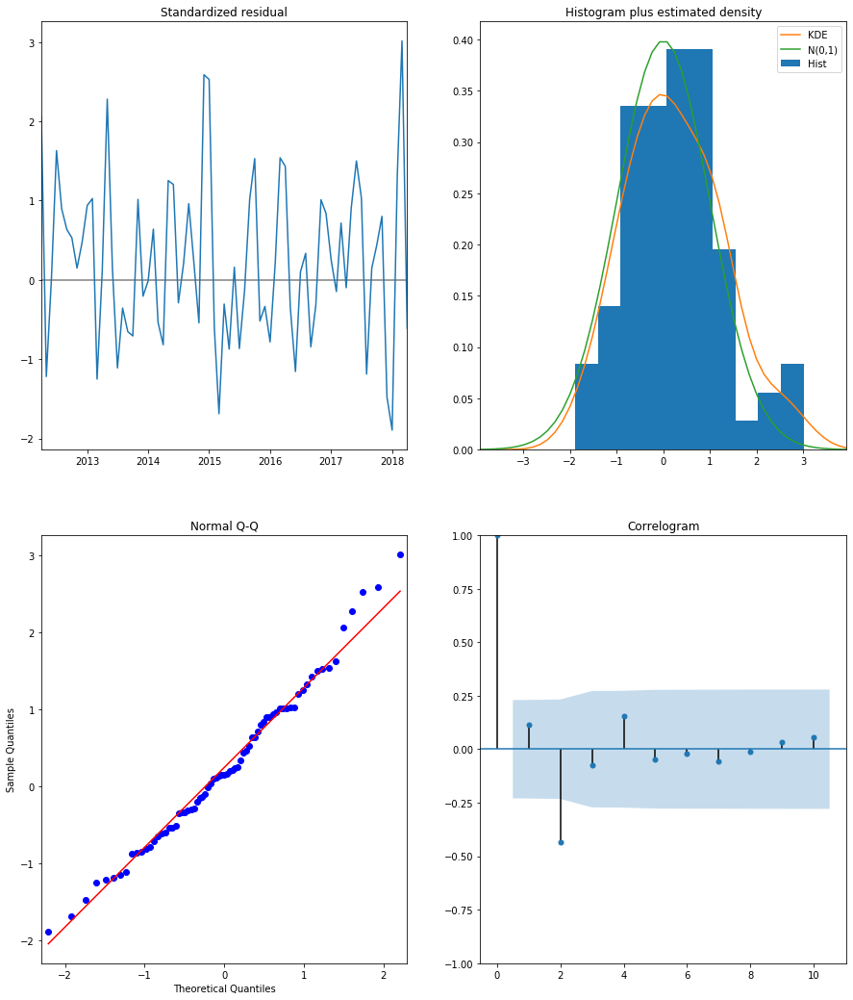

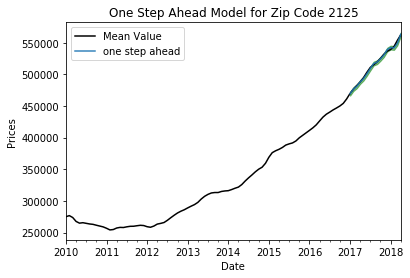

The Mean Squared Error of our forecasts is 1977.7768


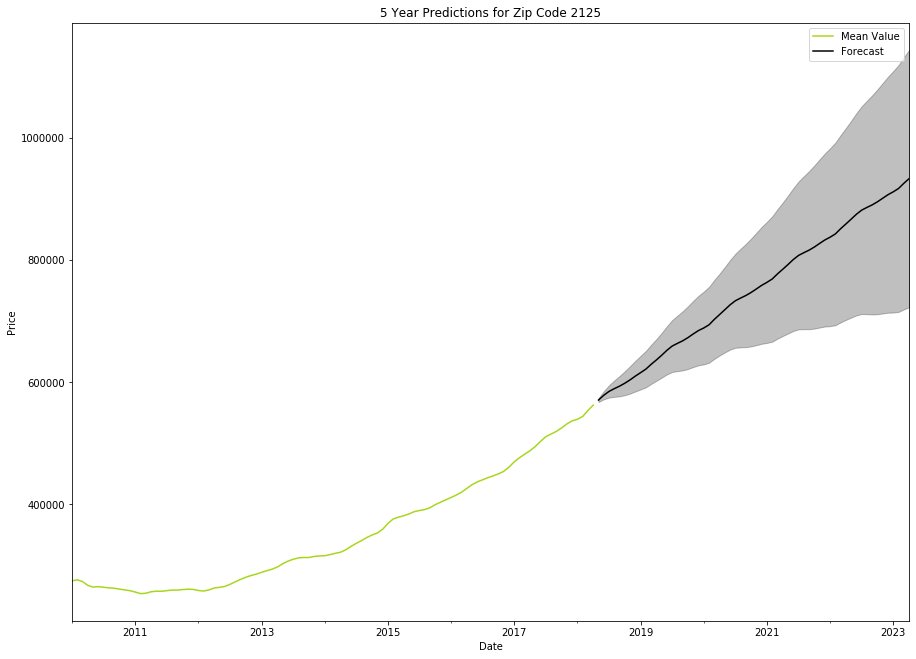

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated = 2894.6706033329747
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated = 2503.6716996155196
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated = 2159.908550022592
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated = 1858.3578798835515
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated = 2025.0444093360427
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated = 2042.158198949701
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated = 1756.3805306184643
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated = 1764.981927187859
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated = 2797.560283692107
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated = 2442.756434048306
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated = 2085.5251595423833
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated = 1785.1813874862585
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated = 2490.6060891122816
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated = 2436.04628749595

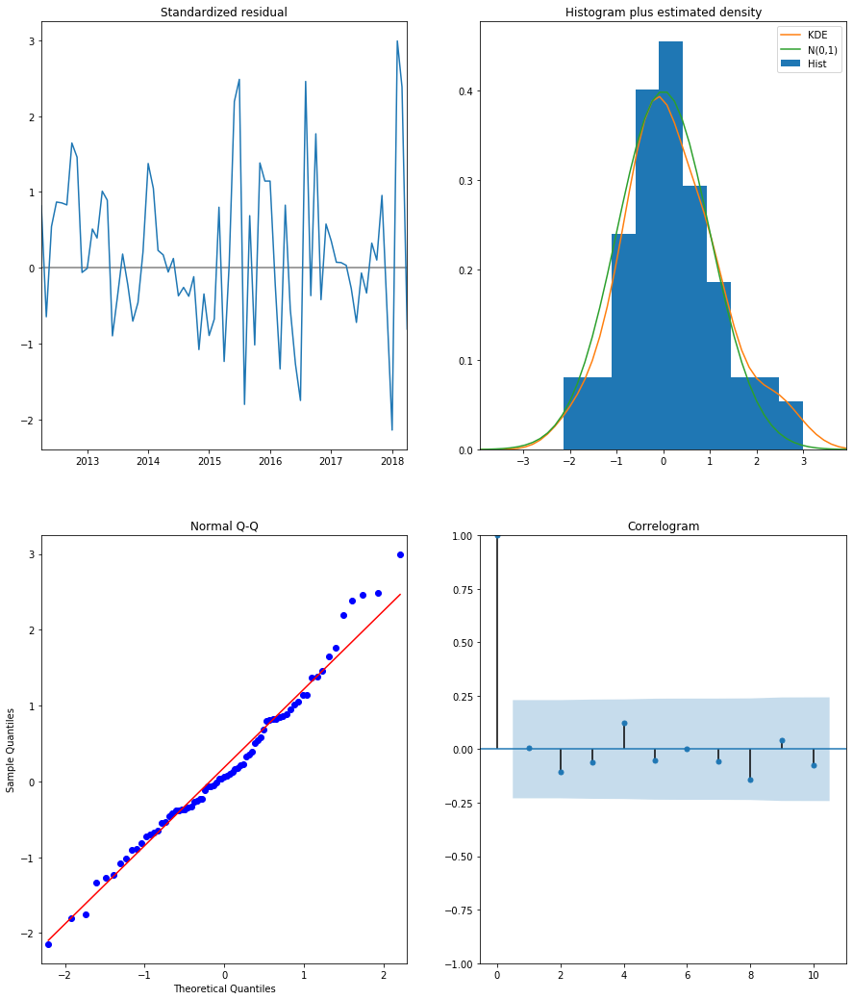

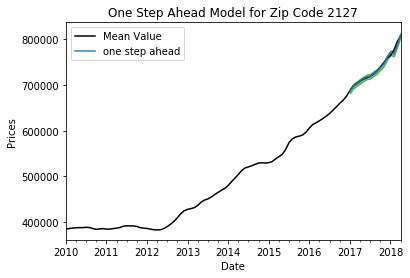

The Mean Squared Error of our forecasts is 3386.1721


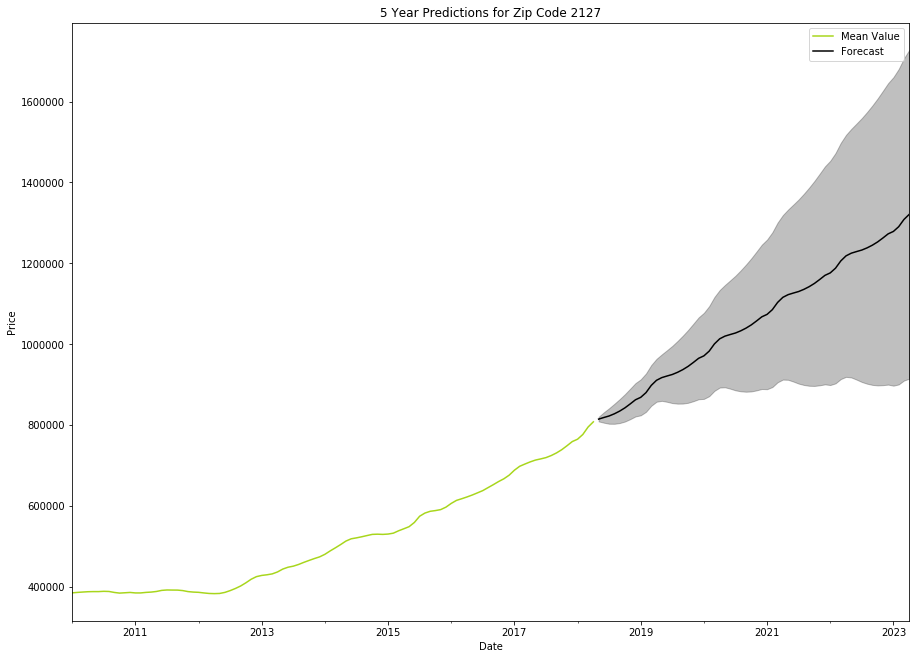

In [92]:
for zip in top_5:
        # Making a temporary dataframe with one zip code only and formatting it a little bit
        temp_df = boston[(boston.RegionName == zip)]
        temp_df.set_index('Month', inplace = True)
        temp_df = temp_df.drop(['RegionName'], axis = 1)
        
        # Iterate through to find the best pdq/pdqs combination
        ans = []
        for comb in pdq:
            for combs in pdqs:
                try:
                    mod = sm.tsa.statespace.SARIMAX(temp_df,
                                                    order = comb,
                                                    seasonal_order = combs,
                                                    enforce_stationarity = False,
                                                    enforce_intertibility = False)
                    output = mod.fit()
                    ans.append([comb, combs, output.aic])
                    print('ARIMA {} x {}12 : AIC Calculated = {}'.format(comb, combs, output.aic))
                except:
                    continue
        
        # Give us the combination that minimizes the AIC 
        ans_df = pd.DataFrame(ans, columns = ['pdq', 'pdqs', 'aic'])
        ans_df.loc[ans_df['aic'].idxmin()]
        
        # Store these numbers to use 
        mod_order = ans_df.loc[ans_df['aic'].idxmin()]['pdq']
        seasonal_mod_order = ans_df.loc[ans_df['aic'].idxmin()]['pdqs']
        
        # Create a model with optimal pdq/pdqs
        ARIMA_MODEL = sm.tsa.statespace.SARIMAX(temp_df,
                                        order = mod_order,
                                        seasonal_order = seasonal_mod_order,
                                        enforce_stationarity = False,
                                        enforce_invertibility = False)
        output = ARIMA_MODEL.fit()
        print(output.summary().tables[1])
        
        # Look at our residuals
        output.plot_diagnostics(figsize = (15, 18))
        plt.show()
        
        # Get one step ahead predictions using our model
        pred = output.get_prediction(start = pd.to_datetime('2017-01-01'), dynamic = False)
        pred_conf = pred.conf_int()
        
        # Plot one step ahead model
        #rcParams['figure.figsize'] = 20, 7

        ax = temp_df['2010':].plot(label = 'observed', color = 'black')
        pred.predicted_mean.plot(ax = ax, title = 'One Step Ahead Model for Zip Code {}'.format(zip), label = 'one step ahead', alpha = .9)

        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color = 'g', alpha = .5)

        ax.set_xlabel('Date')
        ax.set_ylabel('Prices')
        plt.legend()

        plt.show()
        
        # Calculate RMSE
        zip_forecasted = pred.predicted_mean
        zip_truth = temp_df['2017-01-01':]

        rmse = np.sqrt(((zip_forecasted - zip_truth['Mean Value']) ** 2).mean())
        print('The Mean Squared Error of our forecasts is {}'.format(round(rmse, 4)))
        
        
        # Making future predictions
        prediction = output.get_forecast(steps=60)
        pred_conf = prediction.conf_int()
        
        ax = temp_df.plot(label='observed', color = (.659, .839, .110), figsize=(15, 11))
        prediction.predicted_mean.plot(title = '5 Year Predictions for Zip Code {}'.format(zip), ax=ax, label='Forecast', color = 'black')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=0.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('Price')

        plt.legend()
        plt.show()

In [83]:
zip_dic[2127]

{'rmse:': 3386.172083742499,
 'predictions:': [814610.9604236537,
  818633.5089875086,
  822407.8450865726,
  827814.9622240508,
  834443.6210566078,
  842472.3473186584,
  852177.1354009188,
  862431.3555793202,
  868472.7708427978,
  880097.4854200449,
  898021.4234548253,
  910638.5943570639,
  917268.1503967297,
  921252.8265208194,
  925009.5429092055,
  930408.4626818903,
  937033.30778613,
  945060.2597555822,
  954764.222368915,
  965018.05850753,
  971059.2951009782,
  982683.9265540789,
  1000607.8259163202,
  1013224.9788266111,
  1019854.5264957332,
  1023839.1987255252,
  1027595.9133021347,
  1032994.8322319116,
  1039619.6769439982,
  1047646.6287310058,
  1057350.5912594583,
  1067604.427358584,
  1073645.6639336604,
  1085270.2953782135,
  1103194.1947364784,
  1115811.3476449193,
  1122440.8953131805,
  1126425.567542572,
  1130182.2821189952,
  1135581.2010486855,
  1142206.045760732,
  1150232.9975477208,
  1159936.9600761647,
  1170190.7961752862,
  1176232.0327503